Make sure you have same BL implementation as the nocrossval versions here

In [1]:
# General
import numpy as np
import pandas as pd
import os

# For loading data and feature engineering
from feature_set_v2 import MergedDataLoader

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt

# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier


In [2]:
###############################################################################
# 1) HELPER: EWMA Covariance
###############################################################################
def ewm_covariance(returns: pd.DataFrame, halflife=126, min_periods=1) -> pd.DataFrame:
    """
    Compute an exponentially weighted covariance matrix over all data in 'returns'.
    The half-life is 126 days, meaning weights decay by 50% every 126 days.
    We then select the final NxN slice from the multi-index result.
    """
    ewm_cov = returns.ewm(halflife=halflife, adjust=False, min_periods=min_periods).cov()
    if len(returns) == 0:
        # Return an empty DataFrame if no data
        return pd.DataFrame()
    last_date = returns.index[-1]
    df_slice = ewm_cov.loc[last_date]  # shape (N, N)
    df_slice.index.name = None
    return df_slice

In [ ]:
###############################################################################
# 2) HELPER: Rolling + Expanding Black–Litterman
###############################################################################
def run_bl_portfolio_pyopt_expanding(
    factor_dict,
    returns_df,
    test_index,
    tau=0.05,
    delta=2.5
):
    """
    An expanding-window Black–Litterman procedure:
    - For each date t in test_index, we take all historical data up to t-1 to compute:
       (a) an EWMA covariance (with half-life=126)
       (b) a BL prior using pi="equal"  (i.e. all assets get equal baseline expected return)
       (c) factor-based relative views: factor vs Market => P, Q
    - Then we get posterior (bl_returns, bl_cov).
    - Then run a standard Efficient Frontier (max_sharpe).
    - We store the resulting weights for day t+1 (one-day lag).
    """
    assets = list(returns_df.columns)   # e.g. [factor1, factor2, ..., Market]
    factors = list(factor_dict.keys())  # e.g. [factor1, factor2, ...]
    weights_df = pd.DataFrame(index=test_index, columns=assets, dtype=float)

    bounds = []
    for asset in assets:
        if asset == "Market":
            bounds.append((-1, 1))  # allow short up to -100%
        else:
            bounds.append((0, 1))   # no shorting these factors

    test_dates = list(test_index)

    
    # Assign "market caps" equally to each ETF => that implies an equal-weight reference portfolio. To be used to calculate the prior
    market_caps = {etf: 1.0 for etf in assets} # The actual numeric value doesn’t matter as much as the ratio 1:1:1:... across all ETFs.
    

    for i, t in enumerate(test_dates):
        # 1) Expand up to day t-1
        window_end_idx = returns_df.index.get_loc(t)
        if window_end_idx == 0:
            # No prior data => skip
            continue
        expanding_slice = returns_df.iloc[:window_end_idx]

        # 2) Compute the EWMA covariance
        cov_matrix = ewm_covariance(expanding_slice, halflife=126, min_periods=60) * 252
        if cov_matrix.empty or cov_matrix.isna().any().any():
            # If invalid, skip
            continue

        # 3) Construct abs views - P, Q not needed now
        viewdict = {}
        for fac in factors:
            # figure out which regime fac is in
            st = factor_dict[fac]['states'].loc[t]
            daily_abs_ret = factor_dict[fac]['abs_regime_returns'][st]
            annual_abs_ret = daily_abs_ret * 252
            
            # put that in the dictionary
            viewdict[fac] = annual_abs_ret

        # 4) Calculate the prior
        prior = black_litterman.market_implied_prior_returns(market_caps, delta, cov_matrix) 

        # 5) Build the Black–Litterman model
        #    We'll say pi="equal" so that each asset has the same baseline prior
        #    Then we incorporate the relative views in (P, Q).
        #    tau=0.05 is a typical default.
        try:
            bl = BlackLittermanModel(
                cov_matrix=cov_matrix,
                pi=prior,
                tau=tau,
                delta=delta,
                absolute_views=viewdict,  
                # no "omega" => default is Proportional to var of view portfolio
            )
        except Exception as e:
            print(f"BL Model error on day {t}: {e}")
            continue

        # 5) Retrieve posterior returns & covariance
        mu_bl = bl.bl_returns()
        cov_bl = bl.bl_cov()  # posterior covariance

        # 6) Mean-variance optimization
        ef = EfficientFrontier(mu_bl, cov_bl, weight_bounds=bounds)
        try:
            ef.max_sharpe()  # or ef.min_volatility() etc.
        except Exception as e:
            print(f"Optimization error on day {t}: {e}")
            continue

        # 7) Store weights for day t+1 (one-day lag)
        w_series = pd.Series(ef.clean_weights(), name=t)
        if i < len(test_dates) - 1:
            rebalance_day = test_dates[i+1]
            weights_df.loc[rebalance_day] = w_series
        else:
            weights_df.loc[t] = w_series

    return weights_df


In [4]:
# ---------------------------------------------------------------------
# Sharpe Ratio
# ---------------------------------------------------------------------
def annualized_sharpe(r):
    return (r.mean() / r.std()) * np.sqrt(252)


Loading data for factor iwf

Loading data for factor mtum

Loading data for factor qual

Loading data for factor size

Loading data for factor usmv

Loading data for factor vlue

CROSS-VALIDATION PERIOD: 2017-01-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=194.44, κ=2.80, Sharpe=-0.0004


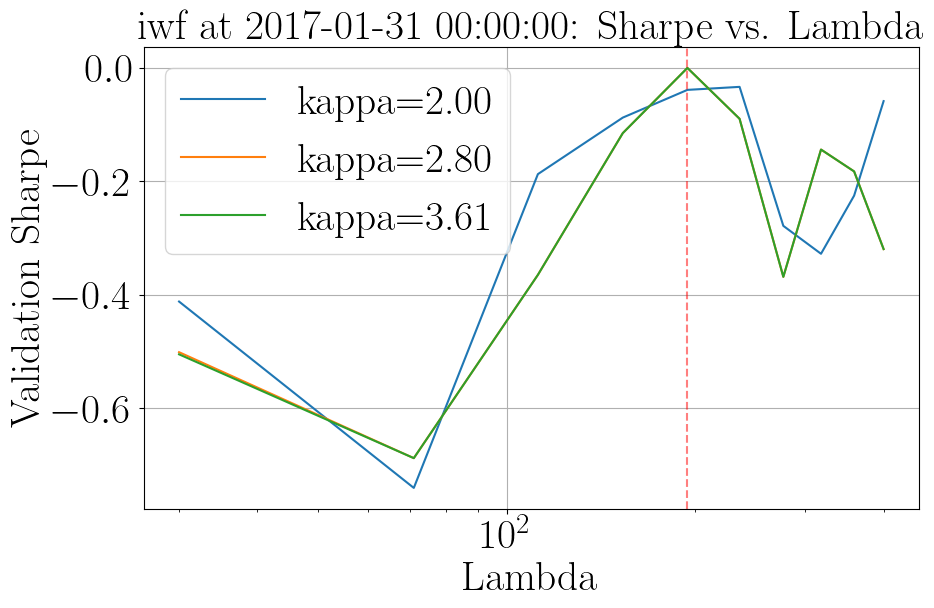


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=153.33, κ=3.61, Sharpe=0.9738


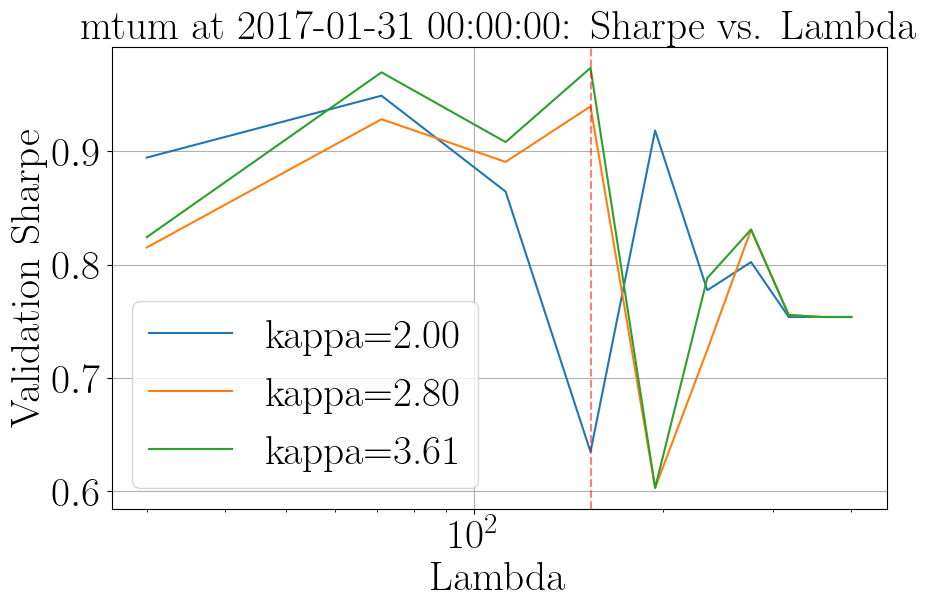


Processing factor qual
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=112.22, κ=2.00, Sharpe=-0.0089


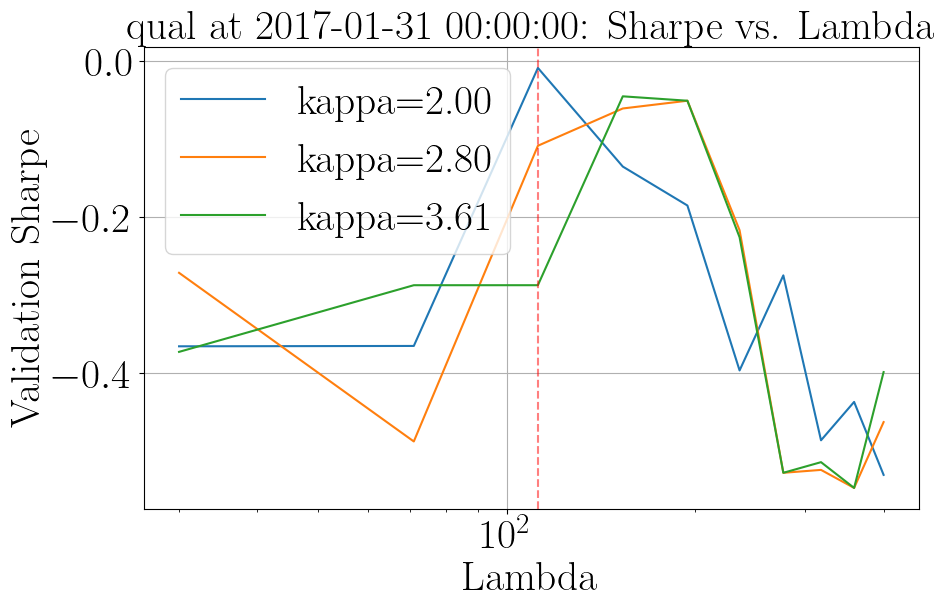


Processing factor size
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.1833


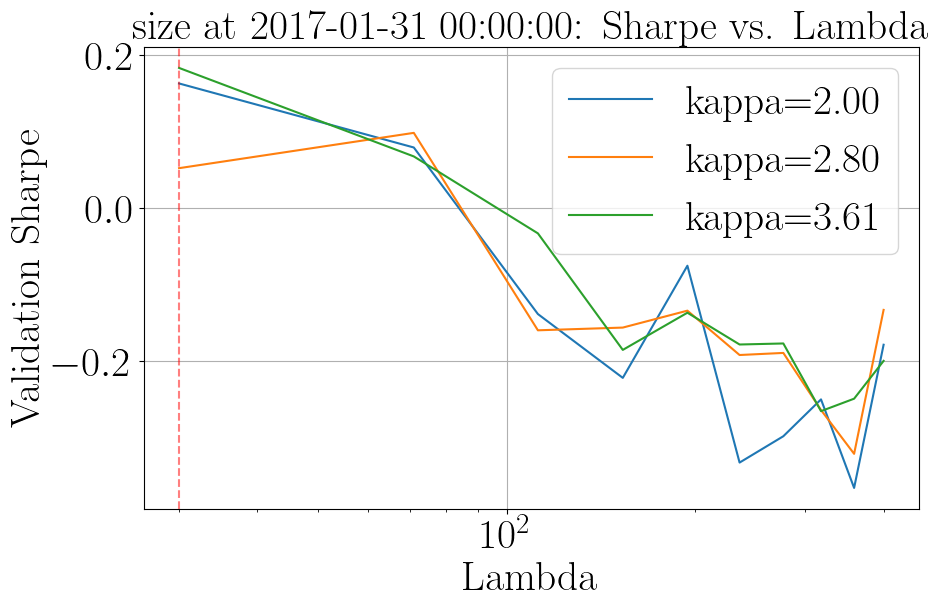


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=30.00, κ=2.00, Sharpe=-0.0184


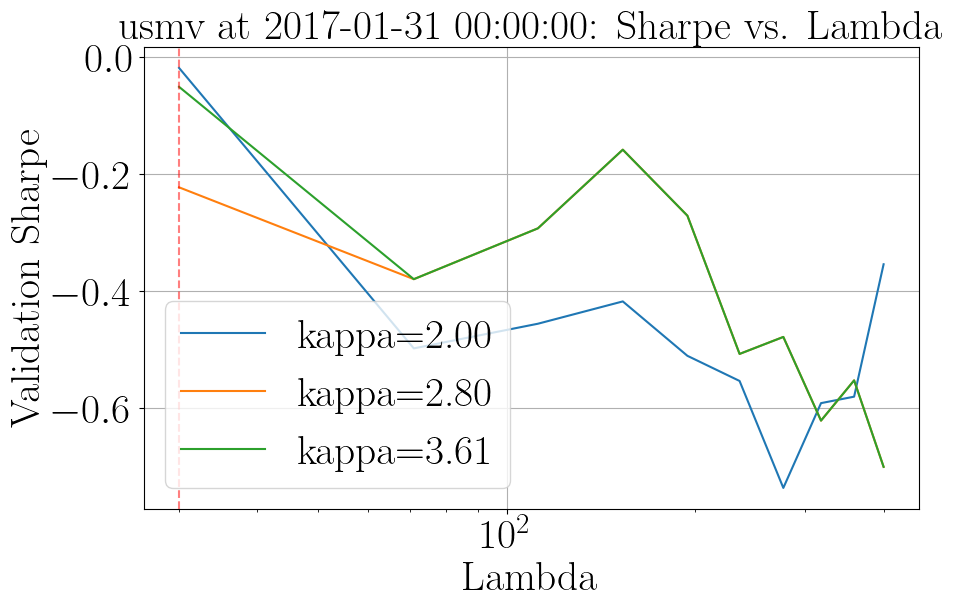


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (8.42 years)
Validation: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-01-28 00:00:00 (2044 days)
Validation data: 2011-01-31 00:00:00 to 2017-01-31 00:00:00 (1490 days)
Best params: λ=112.22, κ=2.00, Sharpe=0.9809


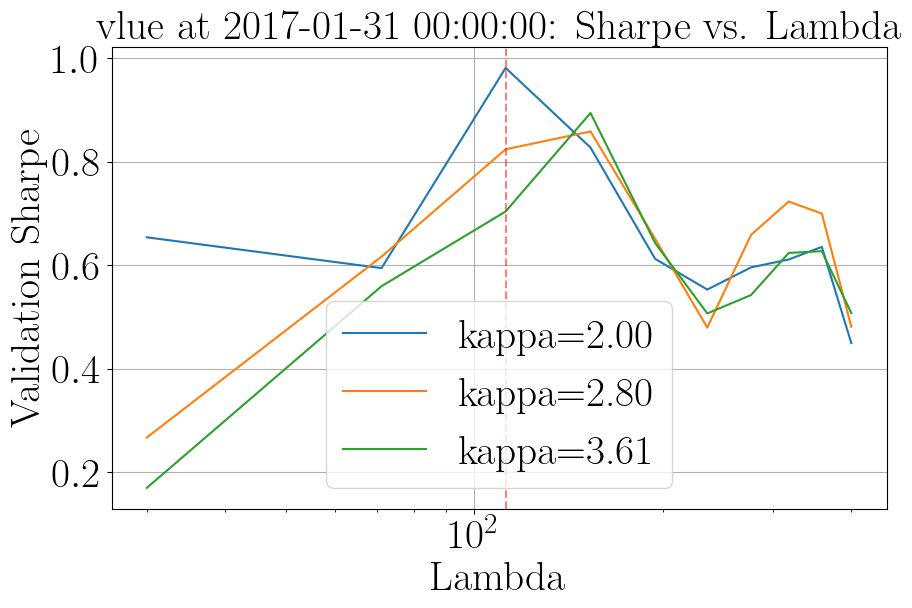


Trading period: 2017-02-28 00:00:00 to 2017-03-31 00:00:00 (23 days)

Trading period: 2017-03-31 00:00:00 to 2017-04-28 00:00:00 (19 days)

Trading period: 2017-04-28 00:00:00 to 2017-05-31 00:00:00 (22 days)

Trading period: 2017-05-31 00:00:00 to 2017-06-30 00:00:00 (22 days)

Trading period: 2017-06-30 00:00:00 to 2017-07-31 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2017-07-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=194.44, κ=2.00, Sharpe=0.1707


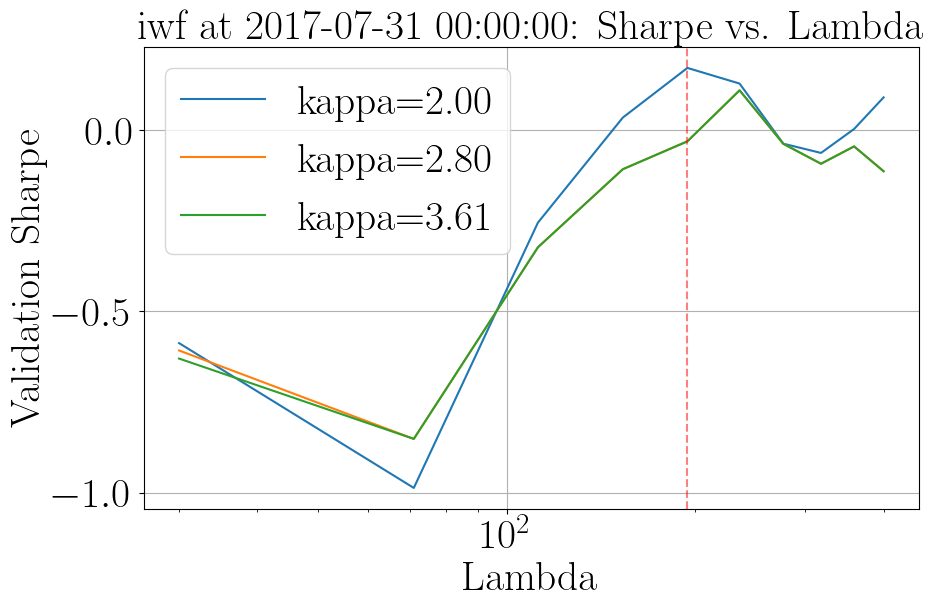


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=71.11, κ=2.00, Sharpe=1.2385


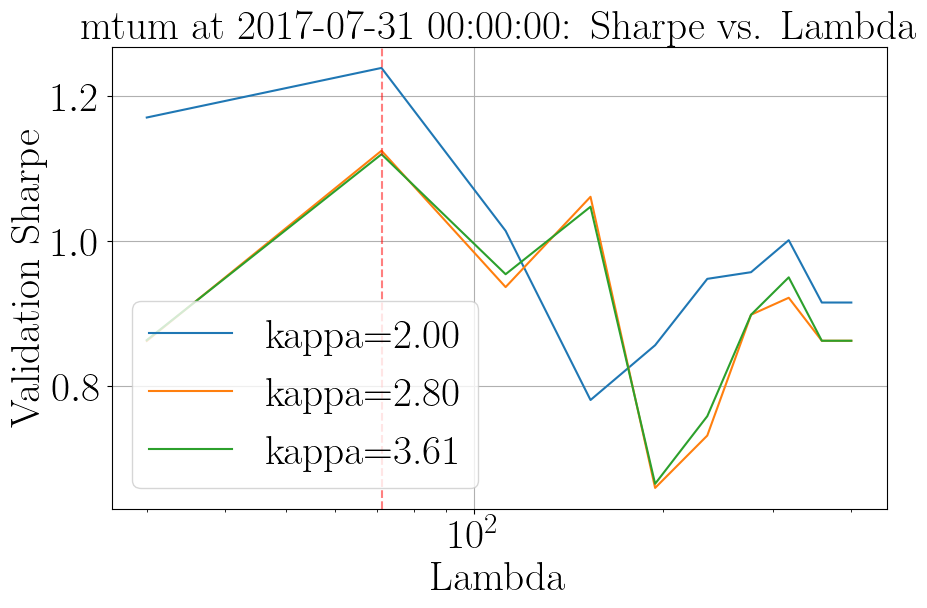


Processing factor qual
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=194.44, κ=2.80, Sharpe=0.3730


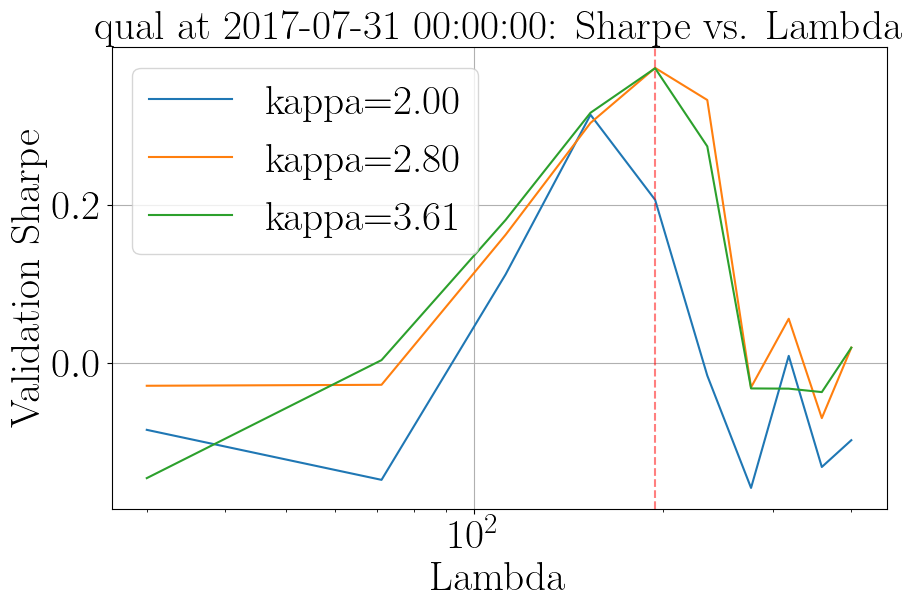


Processing factor size
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.3600


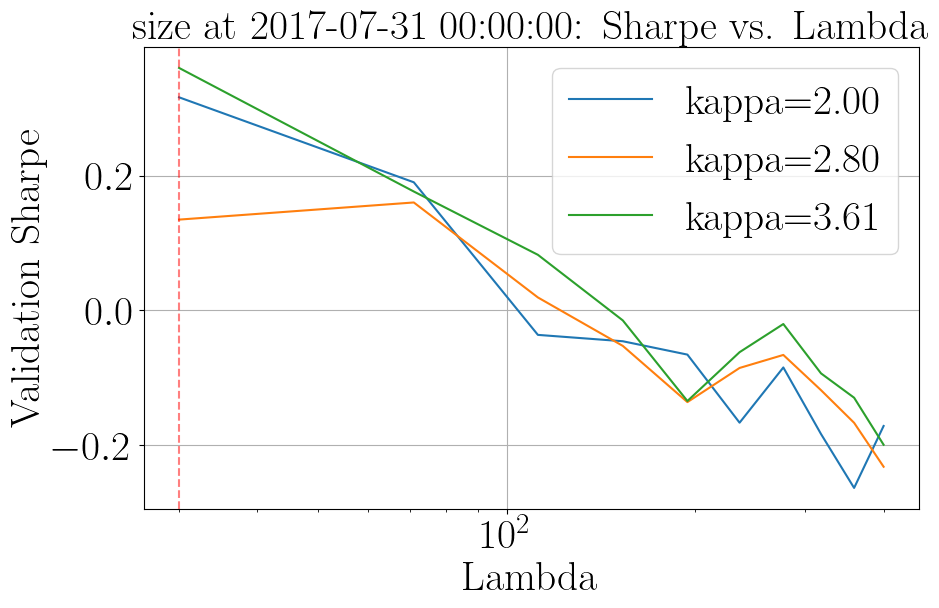


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=400.00, κ=2.00, Sharpe=0.2271


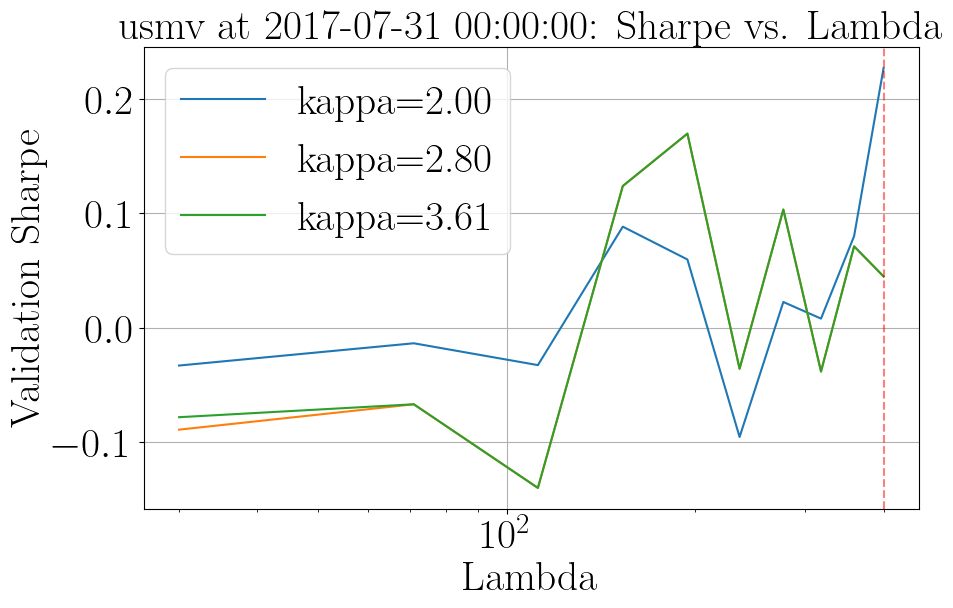


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (8.91 years)
Validation: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2011-07-29 00:00:00 (2166 days)
Validation data: 2011-08-01 00:00:00 to 2017-07-31 00:00:00 (1493 days)
Best params: λ=317.78, κ=3.61, Sharpe=0.8394


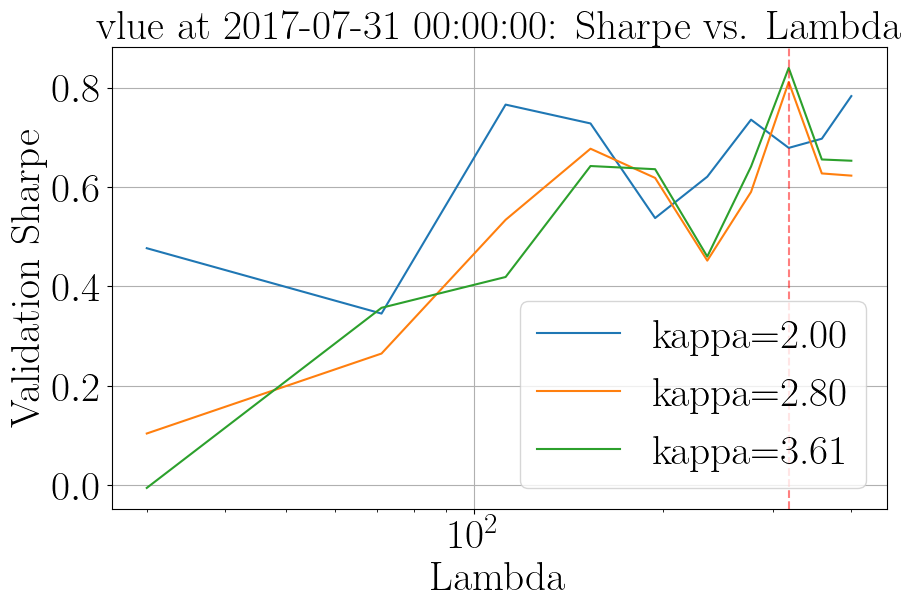


Trading period: 2017-08-31 00:00:00 to 2017-09-29 00:00:00 (20 days)

Trading period: 2017-09-29 00:00:00 to 2017-10-31 00:00:00 (22 days)

Trading period: 2017-10-31 00:00:00 to 2017-11-30 00:00:00 (21 days)

Trading period: 2017-11-30 00:00:00 to 2017-12-29 00:00:00 (20 days)

Trading period: 2017-12-29 00:00:00 to 2018-01-31 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2018-01-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=358.89, κ=2.00, Sharpe=0.3578


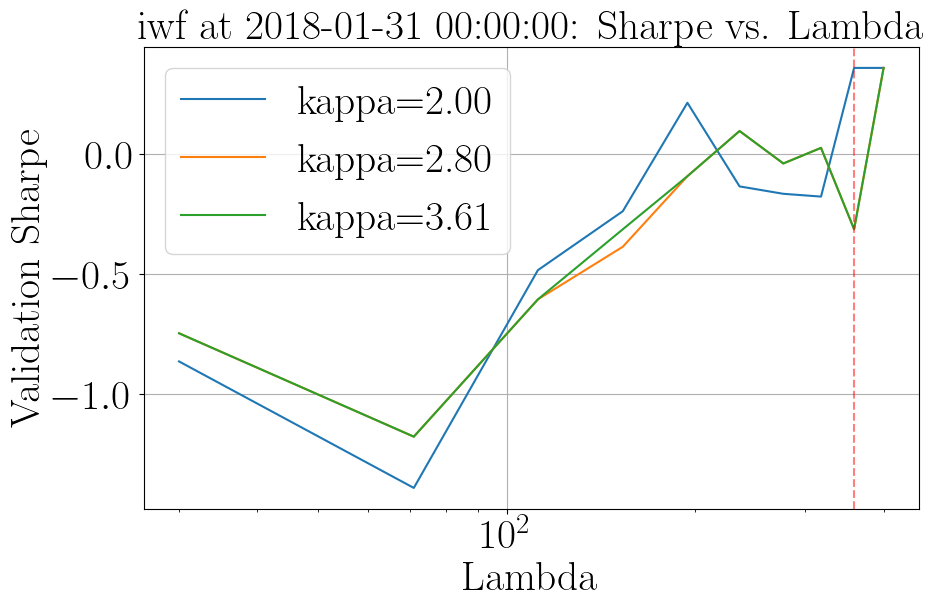


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=71.11, κ=2.00, Sharpe=1.5384


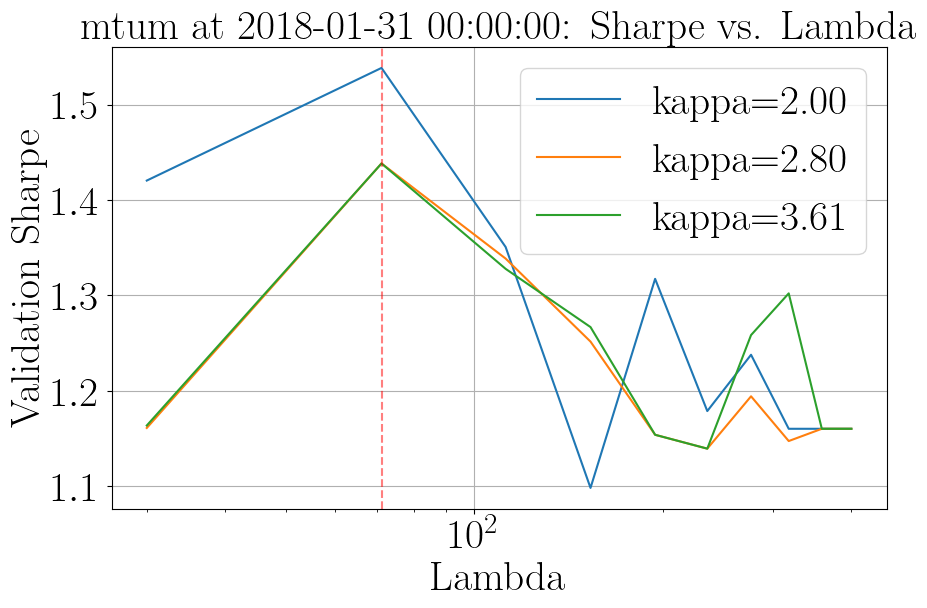


Processing factor qual
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=276.67, κ=2.00, Sharpe=0.4570


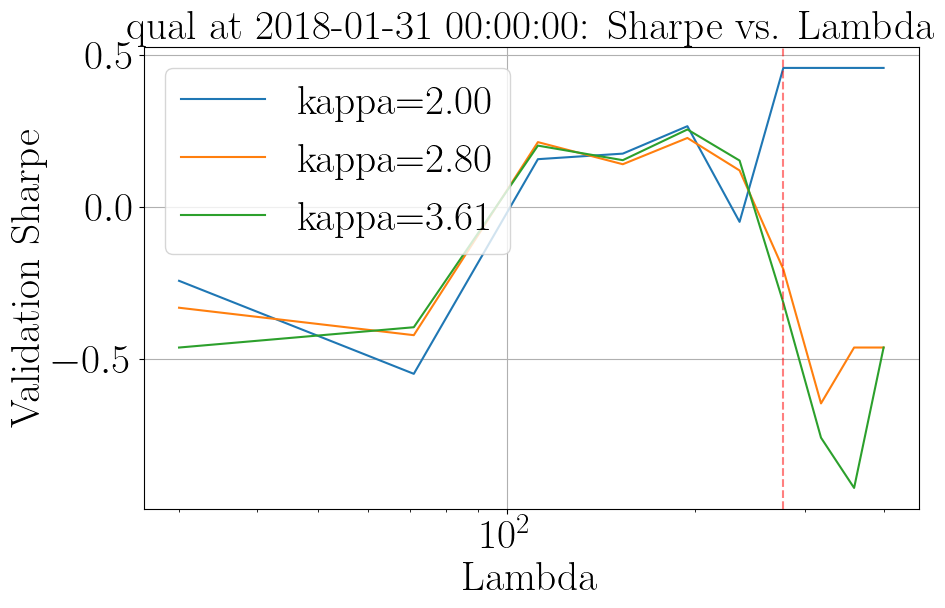


Processing factor size
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.2075


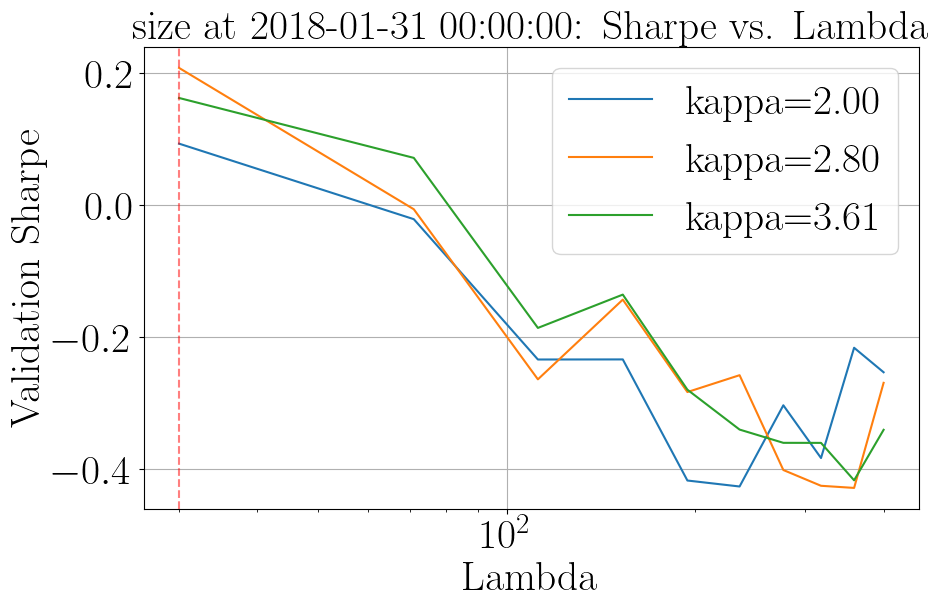


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=194.44, κ=2.80, Sharpe=-0.1157


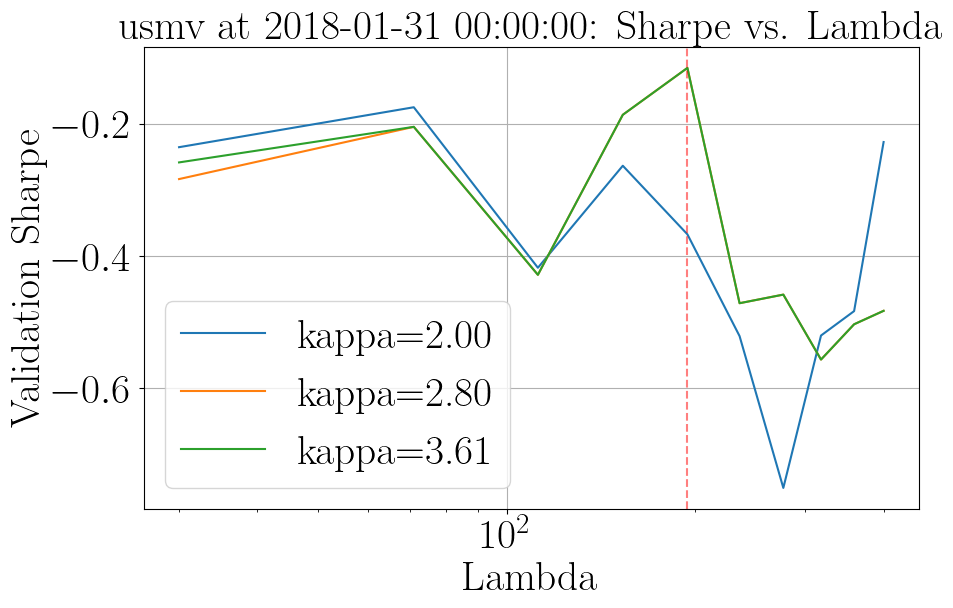


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (9.42 years)
Validation: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-01-30 00:00:00 (2287 days)
Validation data: 2012-01-31 00:00:00 to 2018-01-31 00:00:00 (1499 days)
Best params: λ=276.67, κ=2.00, Sharpe=1.0061


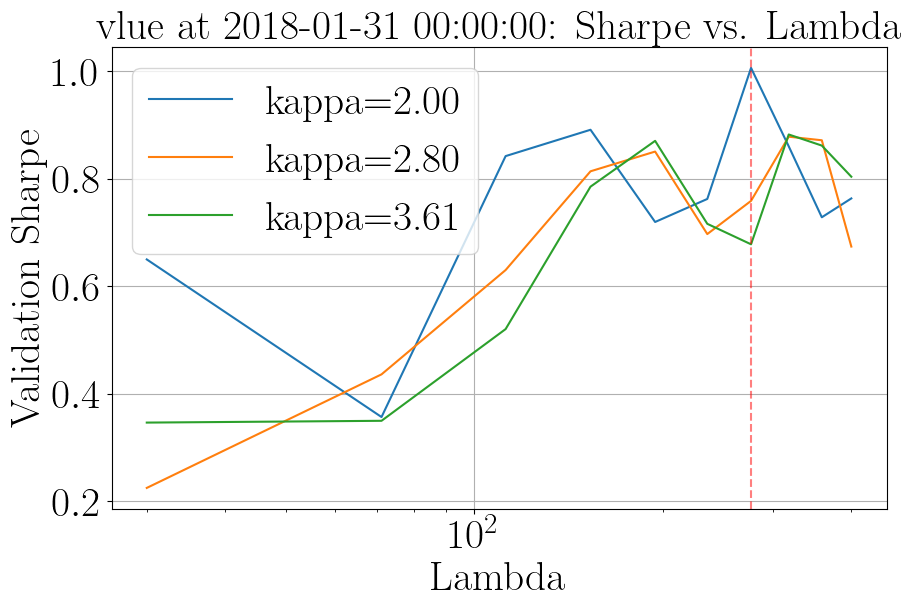


Trading period: 2018-02-28 00:00:00 to 2018-03-29 00:00:00 (21 days)

Trading period: 2018-03-29 00:00:00 to 2018-04-30 00:00:00 (21 days)

Trading period: 2018-04-30 00:00:00 to 2018-05-31 00:00:00 (22 days)

Trading period: 2018-05-31 00:00:00 to 2018-06-29 00:00:00 (21 days)

Trading period: 2018-06-29 00:00:00 to 2018-07-31 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2018-07-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=358.89, κ=2.80, Sharpe=0.4842


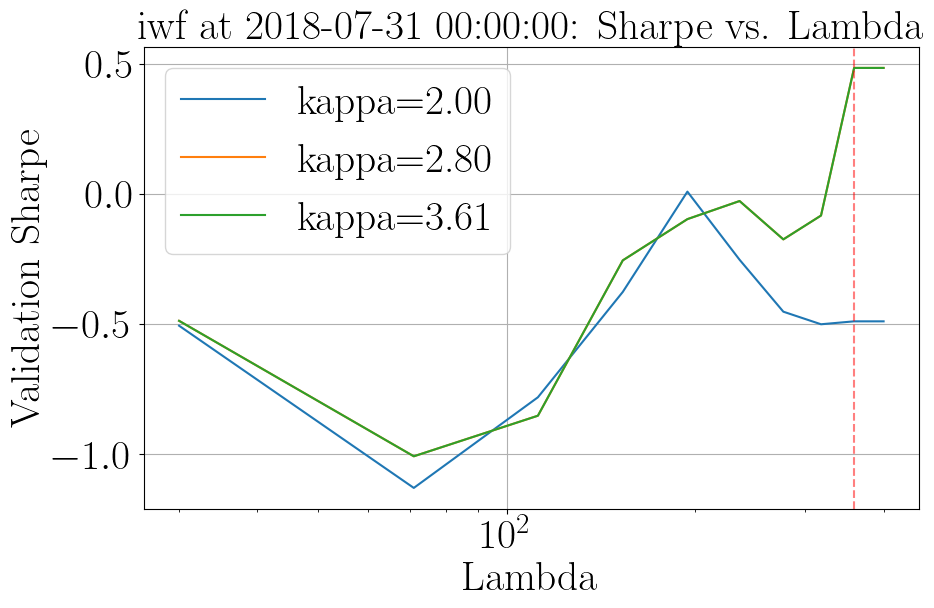


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=71.11, κ=2.00, Sharpe=1.2449


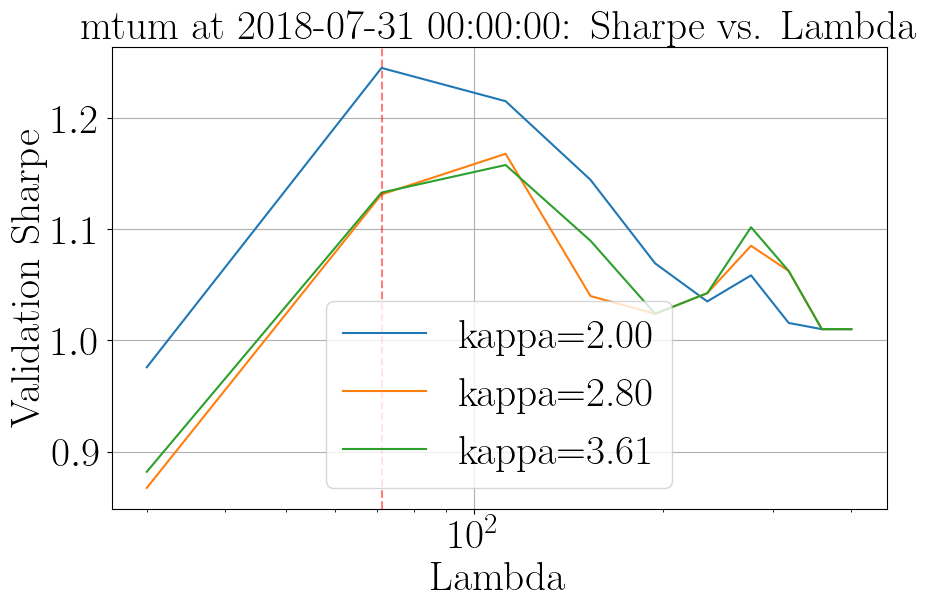


Processing factor qual
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=276.67, κ=2.00, Sharpe=0.4665


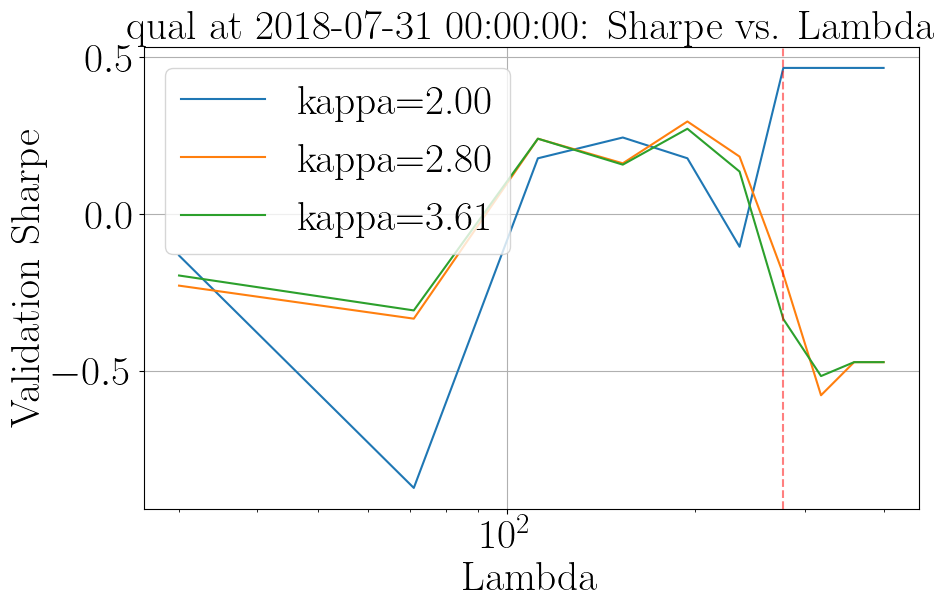


Processing factor size
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.1690


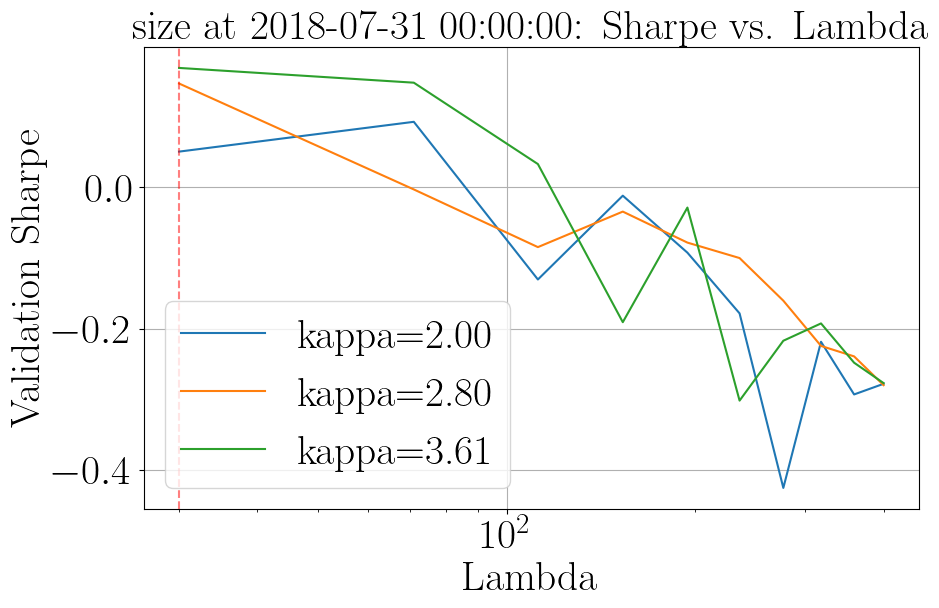


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=194.44, κ=2.80, Sharpe=-0.1317


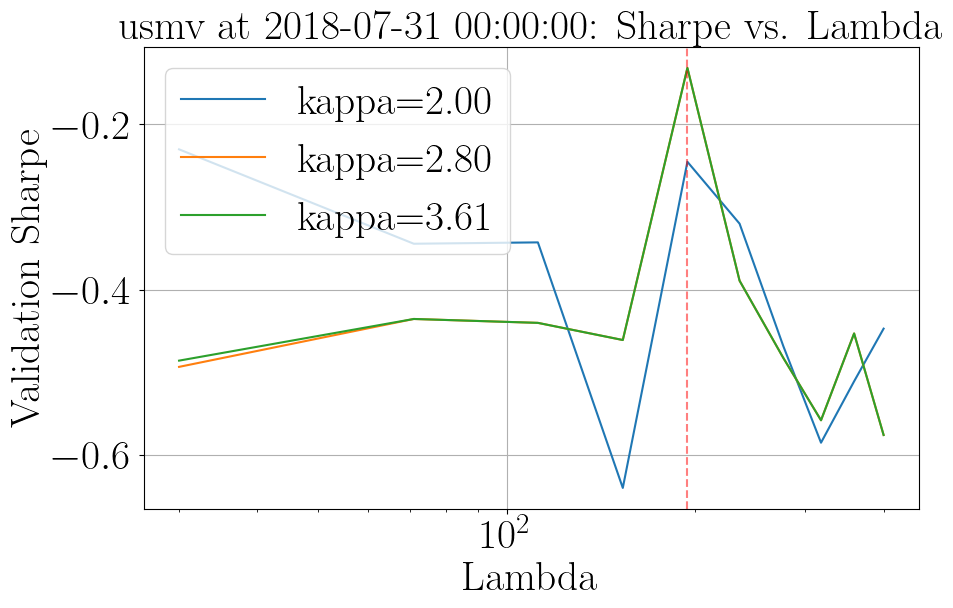


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (9.92 years)
Validation: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2012-07-30 00:00:00 (2409 days)
Validation data: 2012-07-31 00:00:00 to 2018-07-31 00:00:00 (1502 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.0366


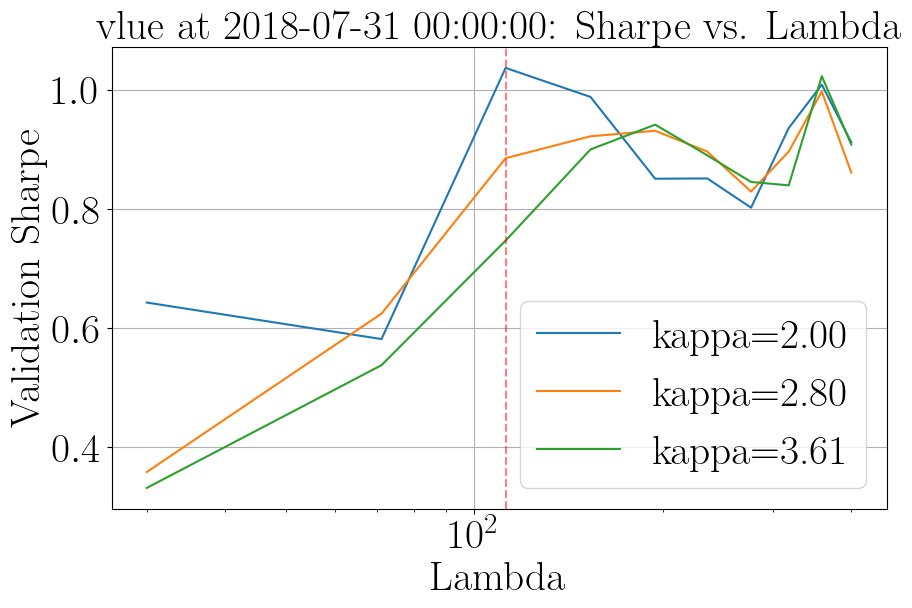


Trading period: 2018-08-31 00:00:00 to 2018-09-28 00:00:00 (19 days)

Trading period: 2018-09-28 00:00:00 to 2018-10-31 00:00:00 (23 days)

Trading period: 2018-10-31 00:00:00 to 2018-11-30 00:00:00 (21 days)

Trading period: 2018-11-30 00:00:00 to 2018-12-31 00:00:00 (19 days)

Trading period: 2018-12-31 00:00:00 to 2019-01-31 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2019-01-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=358.89, κ=2.00, Sharpe=0.0022


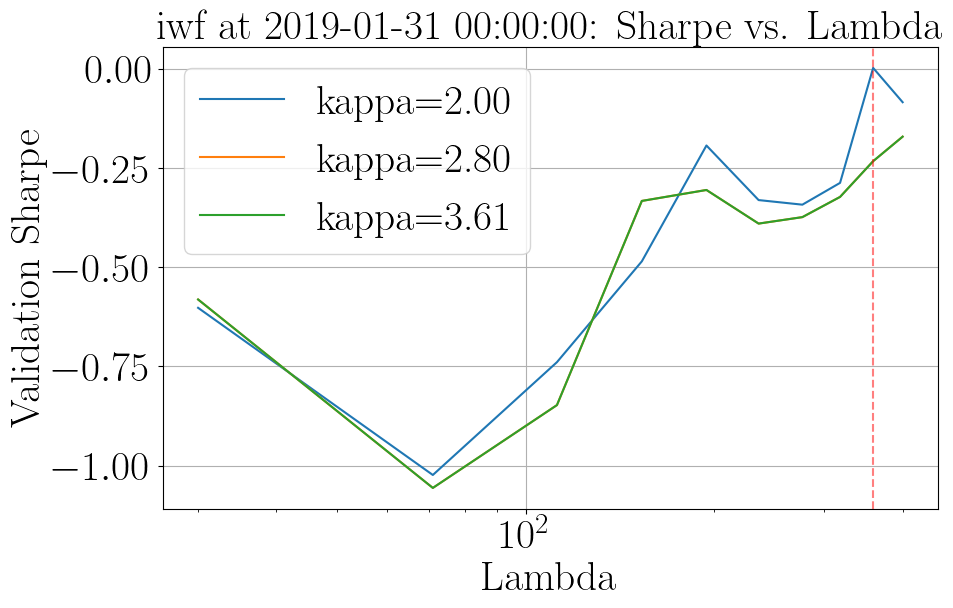


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.2849


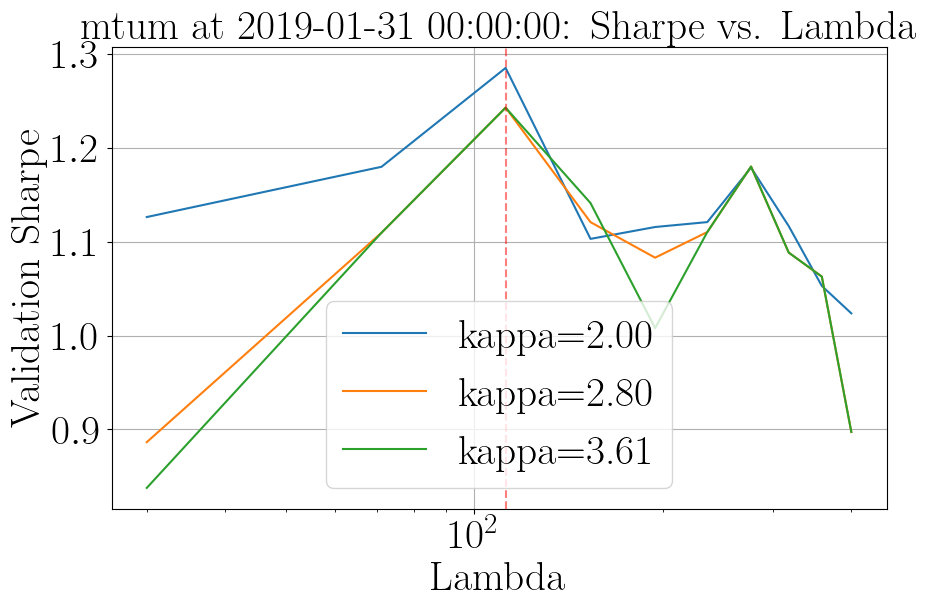


Processing factor qual
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=317.78, κ=2.00, Sharpe=0.4497


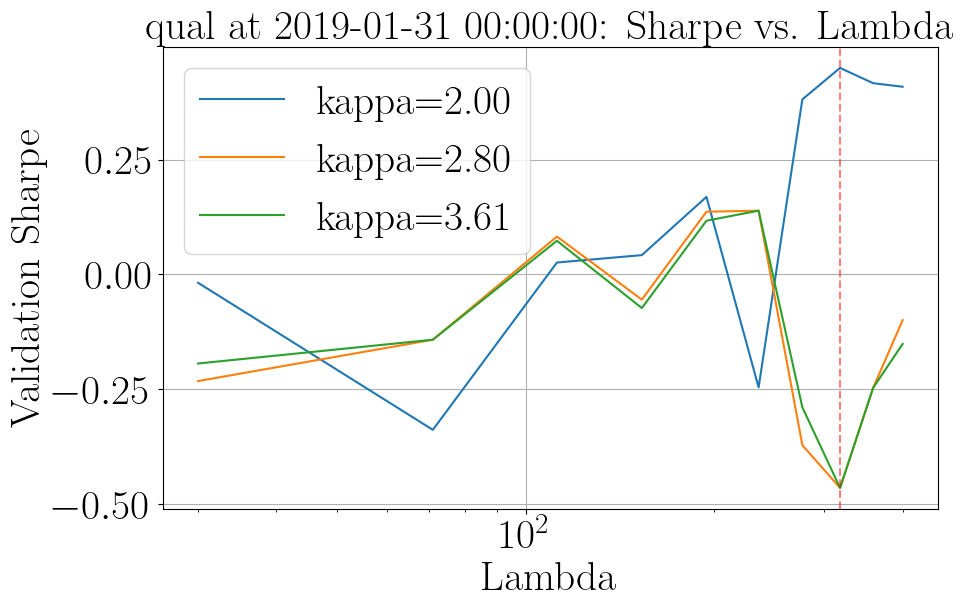


Processing factor size
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.1706


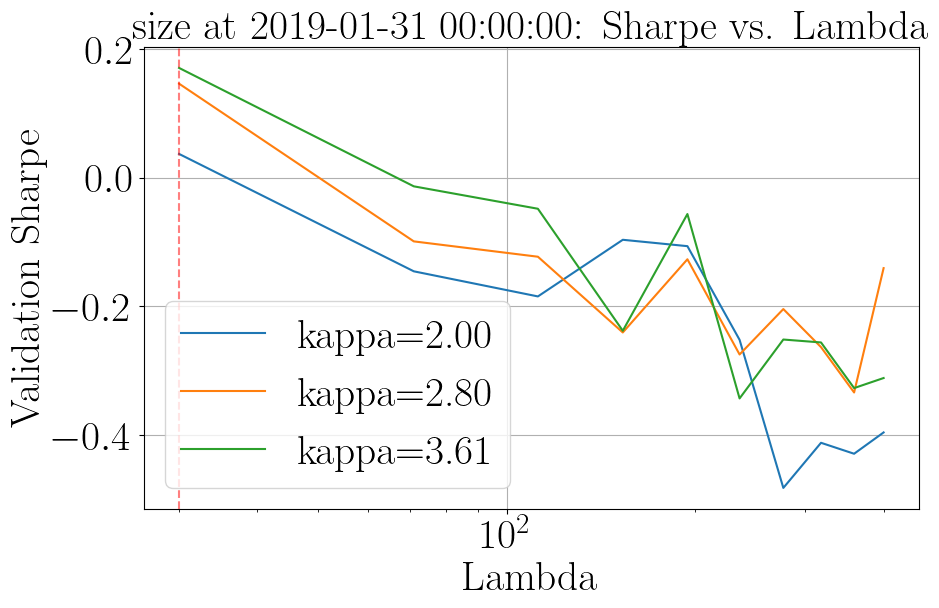


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=112.22, κ=2.80, Sharpe=-0.0402


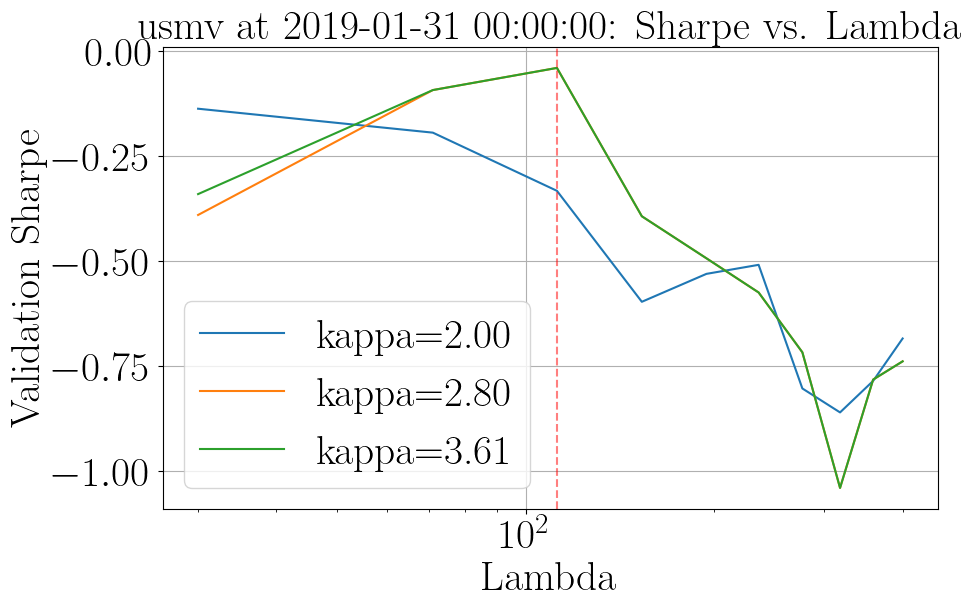


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (10.42 years)
Validation: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-01-30 00:00:00 (2528 days)
Validation data: 2013-01-31 00:00:00 to 2019-01-31 00:00:00 (1509 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.0882


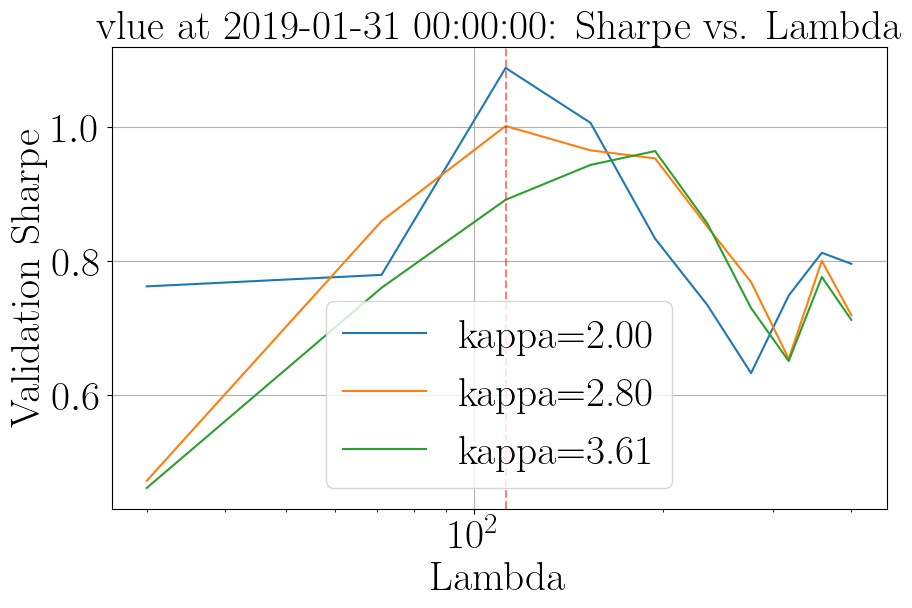


Trading period: 2019-02-28 00:00:00 to 2019-03-29 00:00:00 (21 days)

Trading period: 2019-03-29 00:00:00 to 2019-04-30 00:00:00 (21 days)

Trading period: 2019-04-30 00:00:00 to 2019-05-31 00:00:00 (22 days)

Trading period: 2019-05-31 00:00:00 to 2019-06-28 00:00:00 (20 days)

Trading period: 2019-06-28 00:00:00 to 2019-07-31 00:00:00 (22 days)

CROSS-VALIDATION PERIOD: 2019-07-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=400.00, κ=2.80, Sharpe=-0.0866


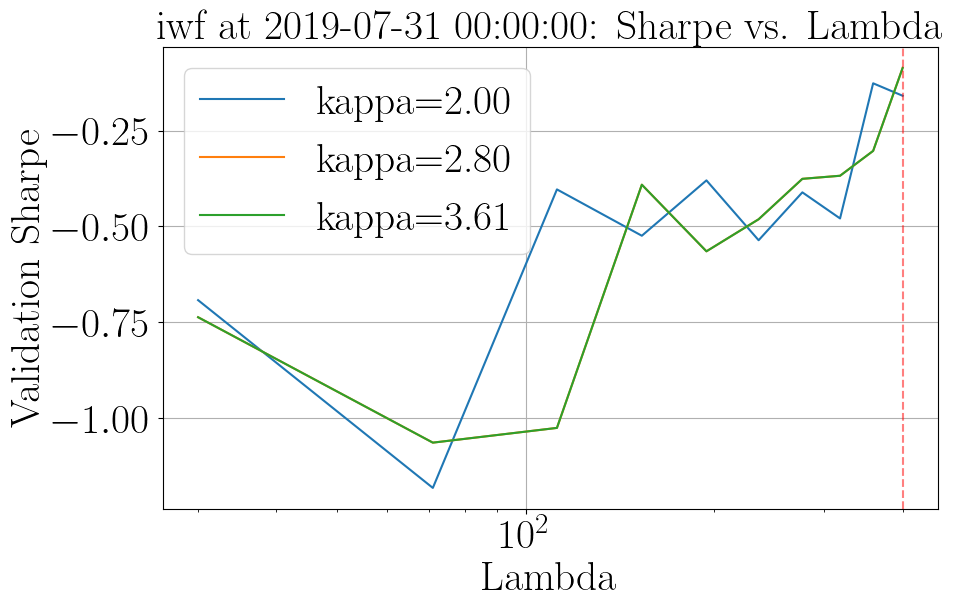


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.3550


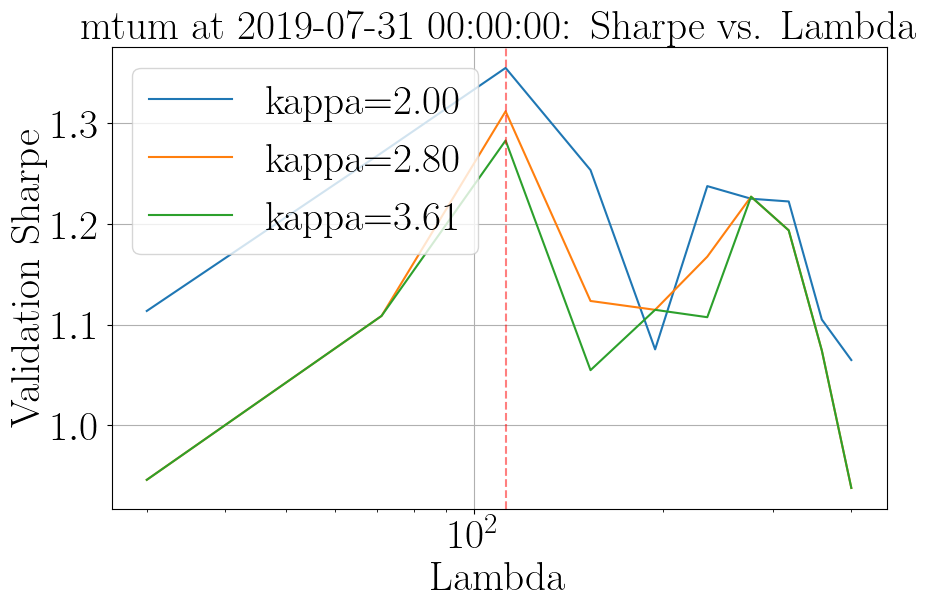


Processing factor qual
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.00, Sharpe=0.4566


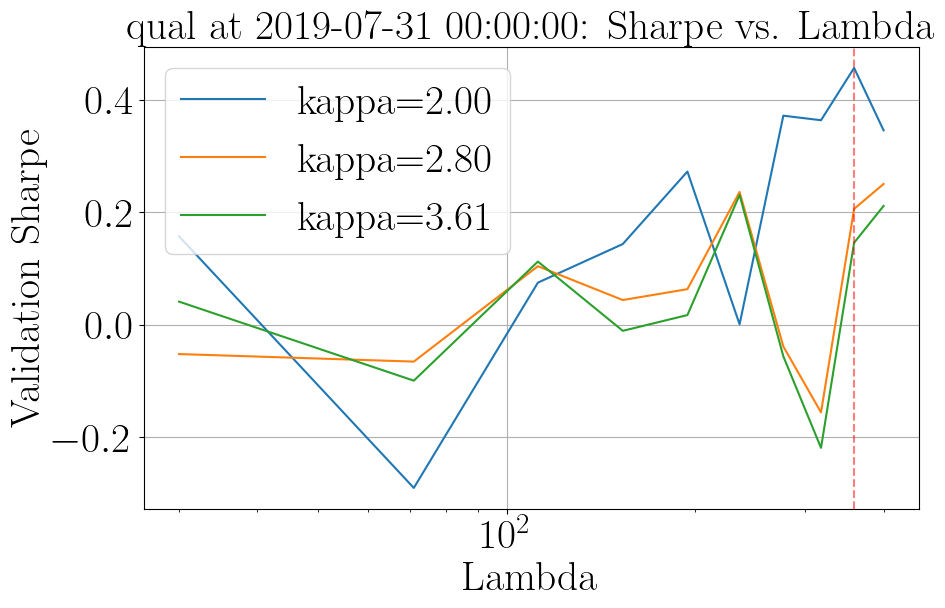


Processing factor size
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.0823


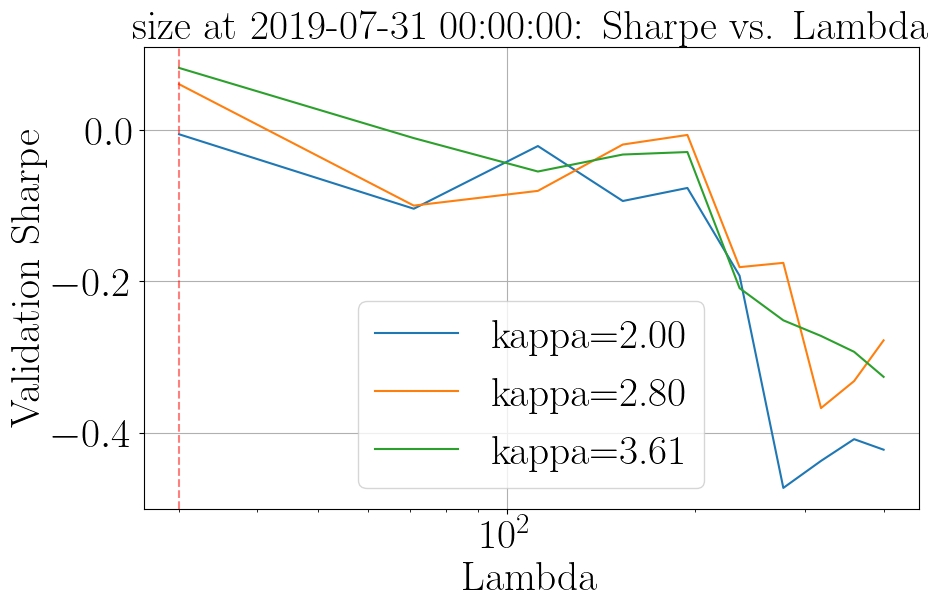


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=71.11, κ=2.80, Sharpe=-0.0949


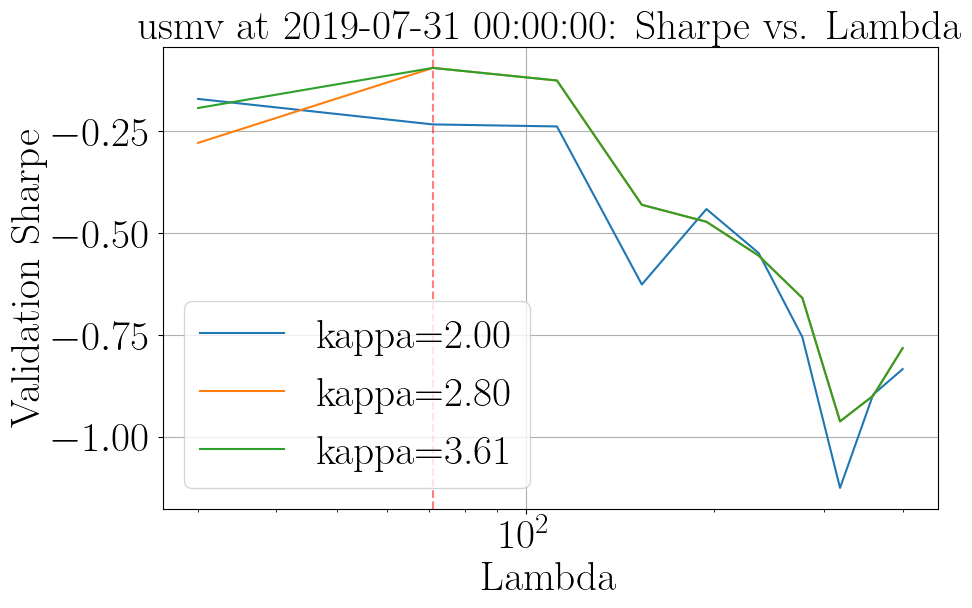


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (10.92 years)
Validation: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2013-07-30 00:00:00 (2651 days)
Validation data: 2013-07-31 00:00:00 to 2019-07-31 00:00:00 (1511 days)
Best params: λ=358.89, κ=3.61, Sharpe=0.6060


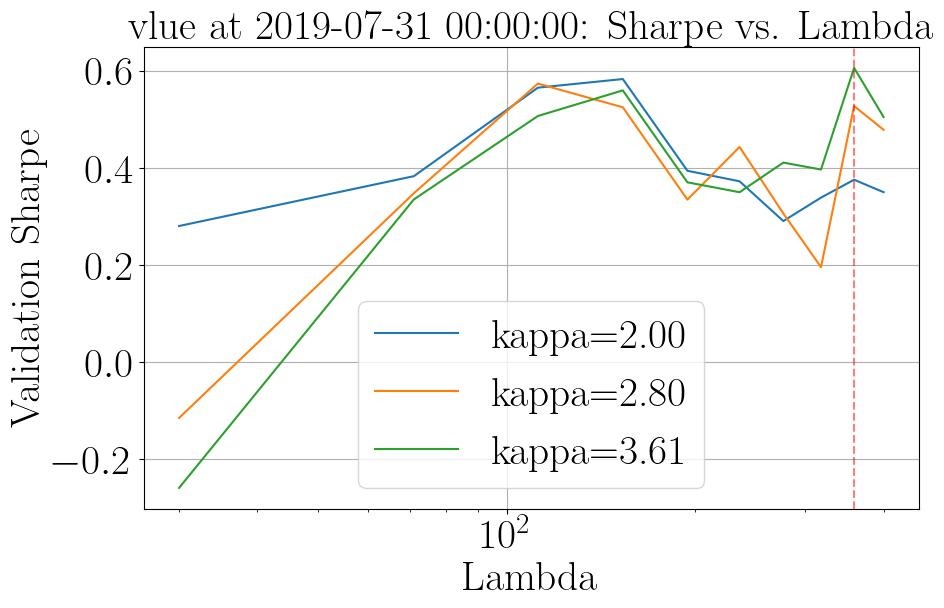


Trading period: 2019-08-30 00:00:00 to 2019-09-30 00:00:00 (20 days)

Trading period: 2019-09-30 00:00:00 to 2019-10-31 00:00:00 (23 days)

Trading period: 2019-10-31 00:00:00 to 2019-11-29 00:00:00 (20 days)

Trading period: 2019-11-29 00:00:00 to 2019-12-31 00:00:00 (21 days)

Trading period: 2019-12-31 00:00:00 to 2020-01-31 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2020-01-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=400.00, κ=2.80, Sharpe=0.0454


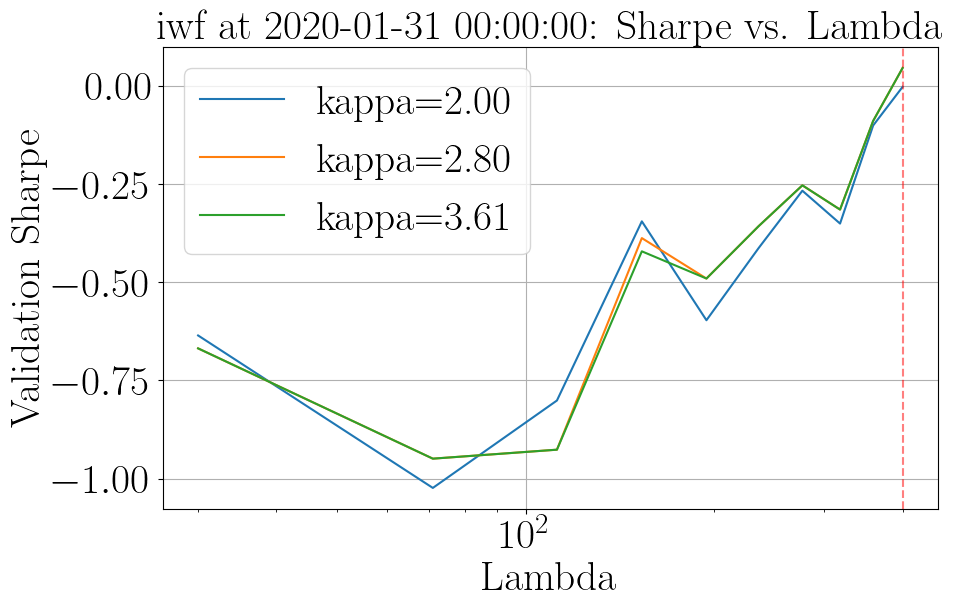


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.2947


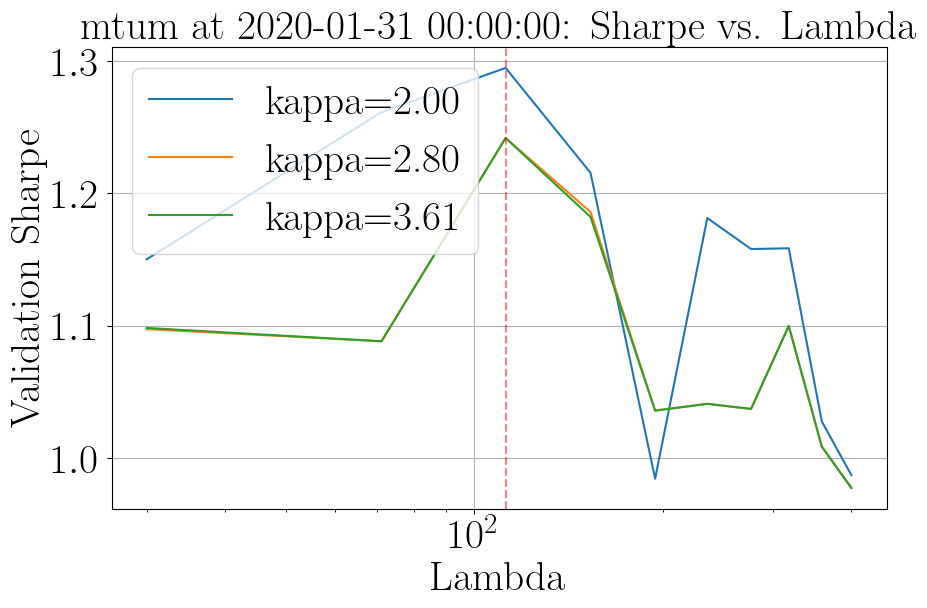


Processing factor qual
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=276.67, κ=2.00, Sharpe=0.5155


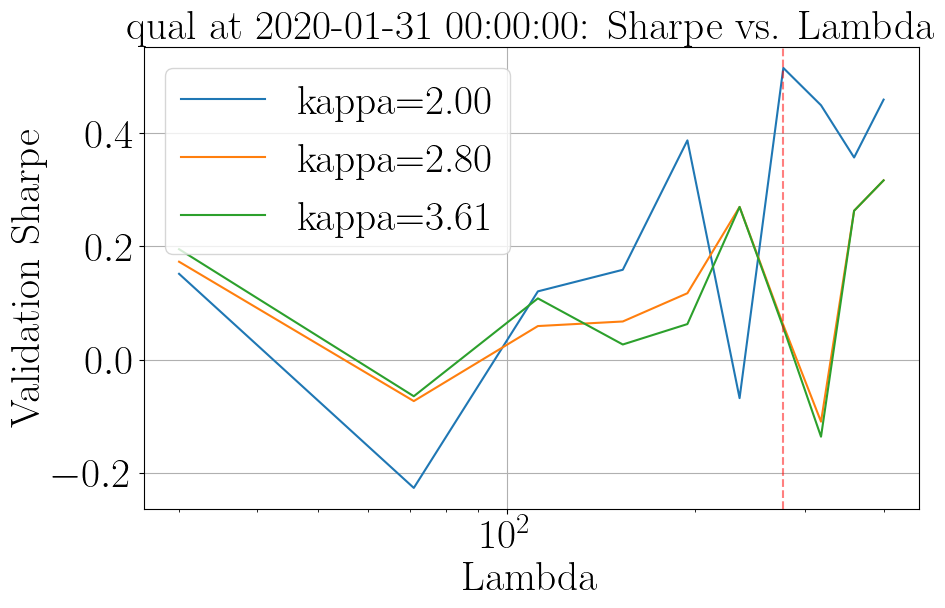


Processing factor size
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=194.44, κ=3.61, Sharpe=0.0798


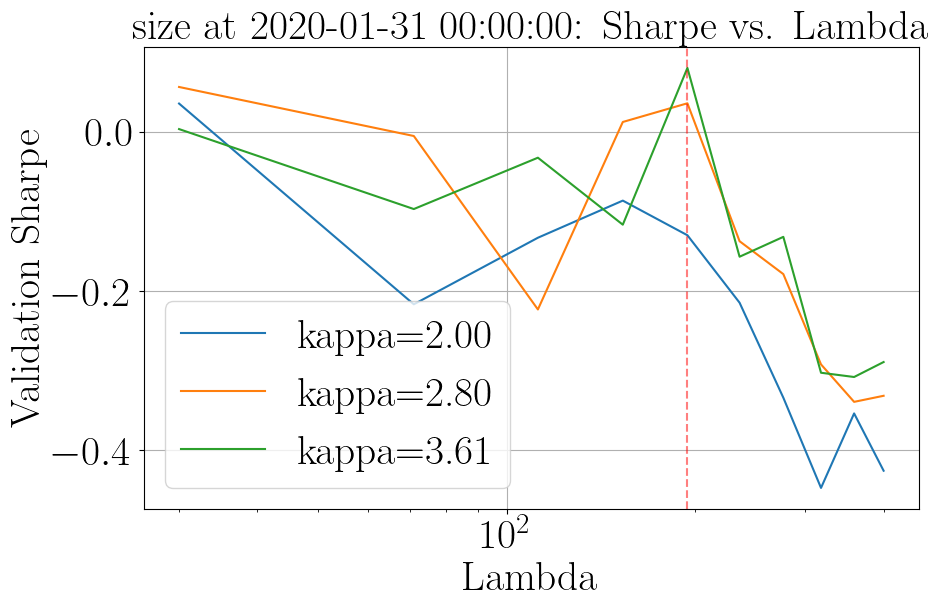


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=2.00, Sharpe=-0.2051


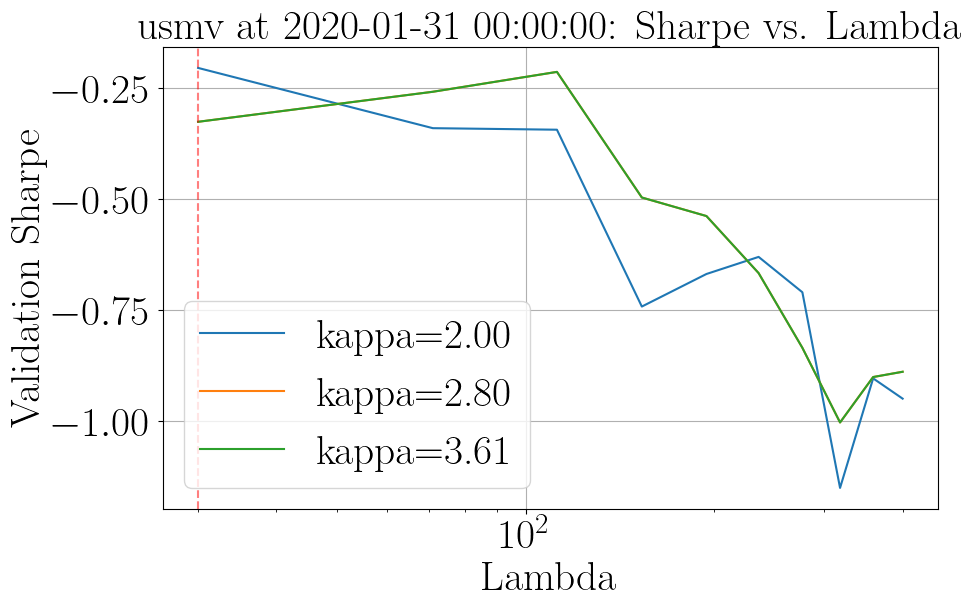


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (11.42 years)
Validation: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-01-30 00:00:00 (2778 days)
Validation data: 2014-01-31 00:00:00 to 2020-01-31 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.80, Sharpe=0.3935


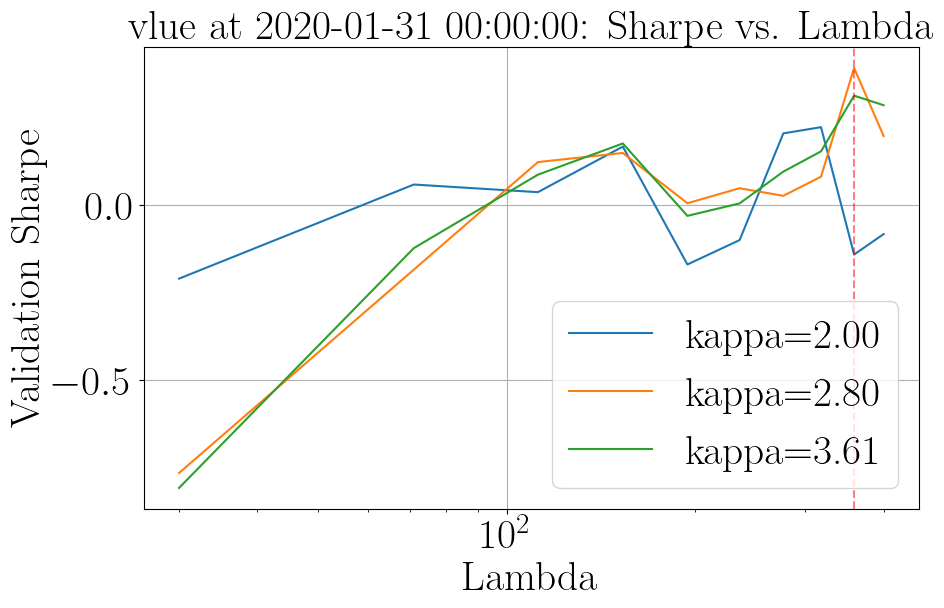


Trading period: 2020-02-28 00:00:00 to 2020-03-31 00:00:00 (22 days)

Trading period: 2020-03-31 00:00:00 to 2020-04-30 00:00:00 (21 days)

Trading period: 2020-04-30 00:00:00 to 2020-05-29 00:00:00 (20 days)

Trading period: 2020-05-29 00:00:00 to 2020-06-30 00:00:00 (22 days)

Trading period: 2020-06-30 00:00:00 to 2020-07-31 00:00:00 (22 days)

CROSS-VALIDATION PERIOD: 2020-07-31 00:00:00

Processing factor iwf
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=400.00, κ=2.80, Sharpe=0.3796


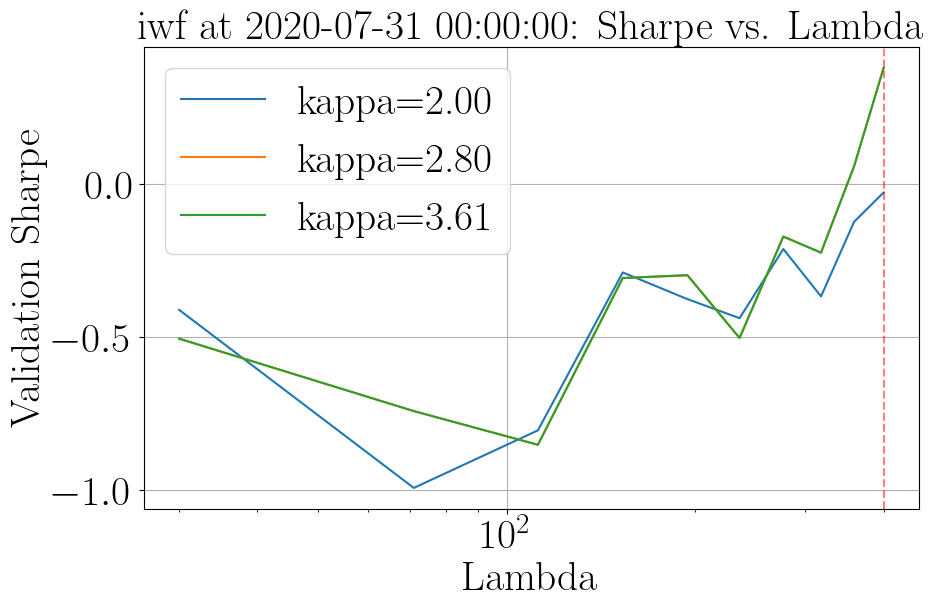


Processing factor mtum
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=112.22, κ=2.00, Sharpe=1.2444


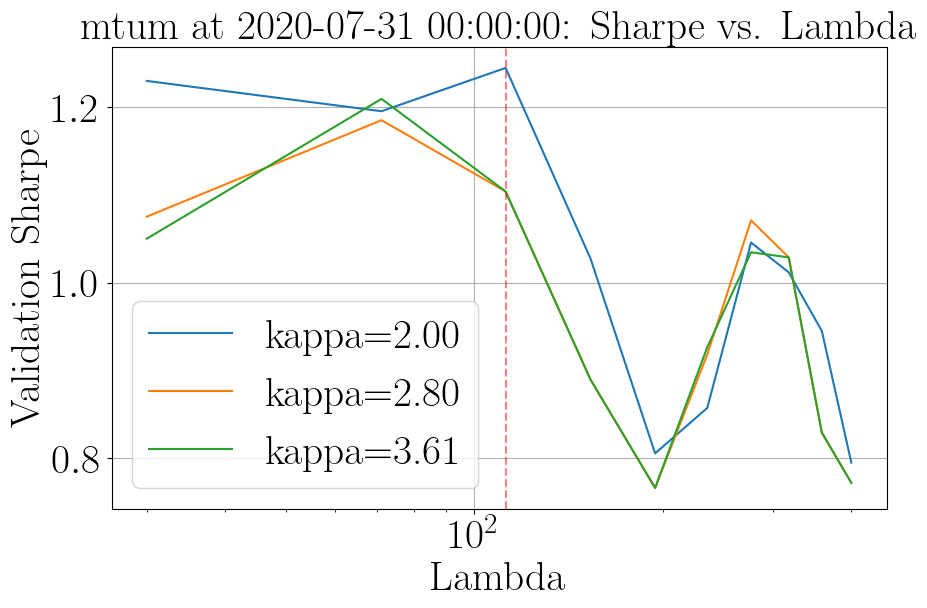


Processing factor qual
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.3408


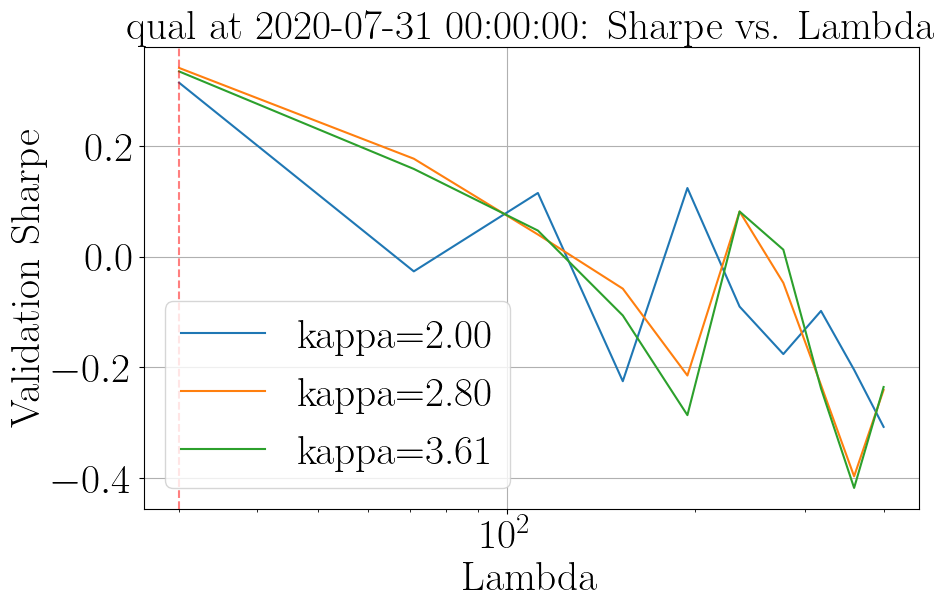


Processing factor size
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=194.44, κ=3.61, Sharpe=0.2099


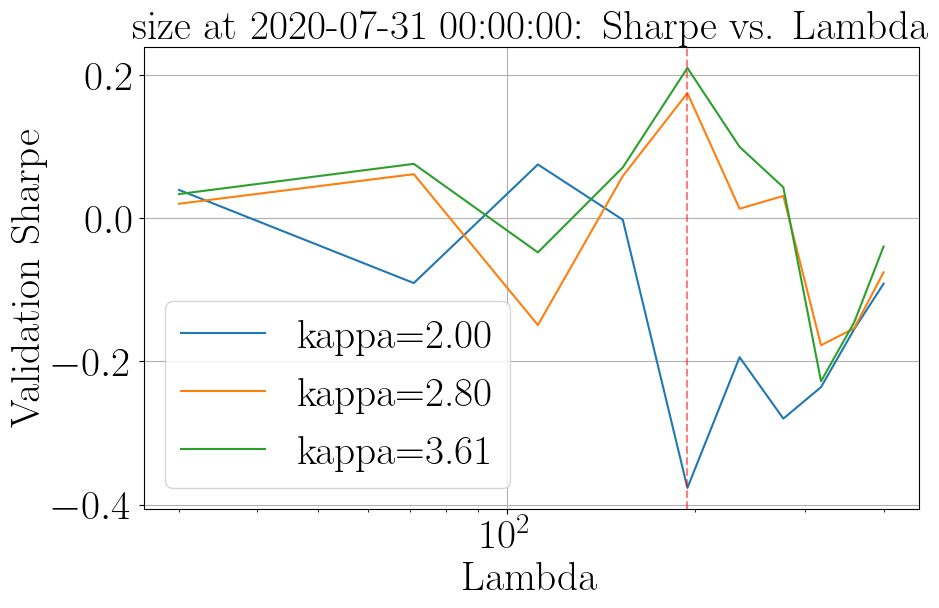


Processing factor usmv
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.80, Sharpe=-0.2112


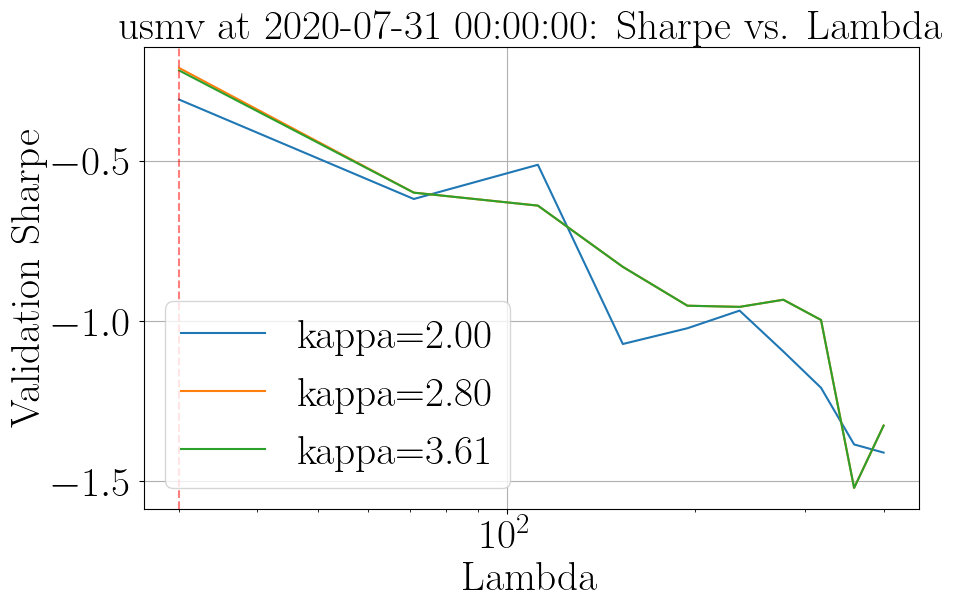


Processing factor vlue
Training: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (11.92 years)
Validation: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (6.00 years)
Training data: 2002-08-29 00:00:00 to 2014-07-30 00:00:00 (2903 days)
Validation data: 2014-07-31 00:00:00 to 2020-07-31 00:00:00 (1512 days)
Best params: λ=153.33, κ=3.61, Sharpe=0.3508


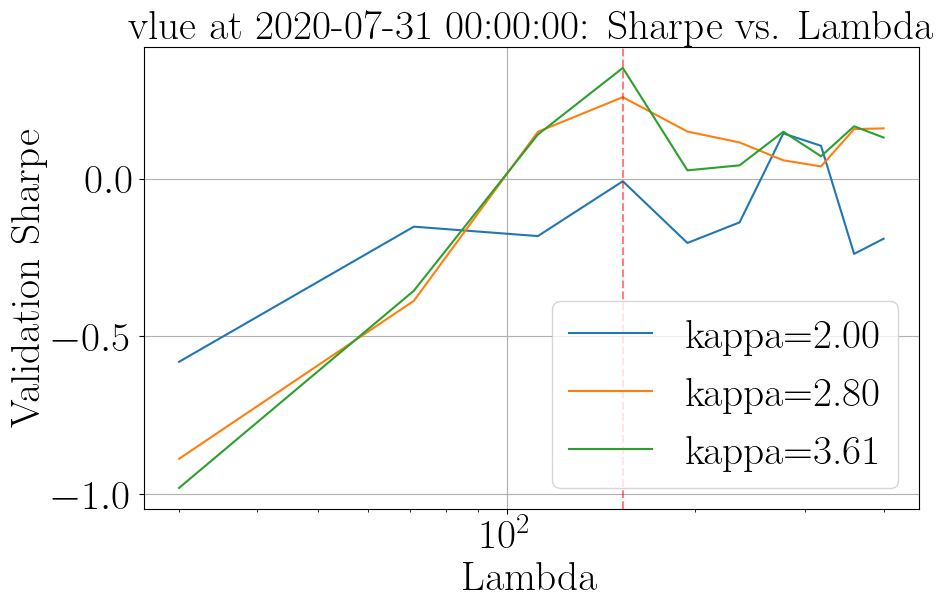


Trading period: 2020-08-31 00:00:00 to 2020-09-30 00:00:00 (21 days)

Trading period: 2020-09-30 00:00:00 to 2020-10-30 00:00:00 (22 days)

Trading period: 2020-10-30 00:00:00 to 2020-11-30 00:00:00 (20 days)

Trading period: 2020-11-30 00:00:00 to 2020-12-31 00:00:00 (22 days)

Trading period: 2020-12-31 00:00:00 to 2021-01-29 00:00:00 (19 days)

CROSS-VALIDATION PERIOD: 2021-01-29 00:00:00

Processing factor iwf
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=400.00, κ=2.00, Sharpe=0.3144


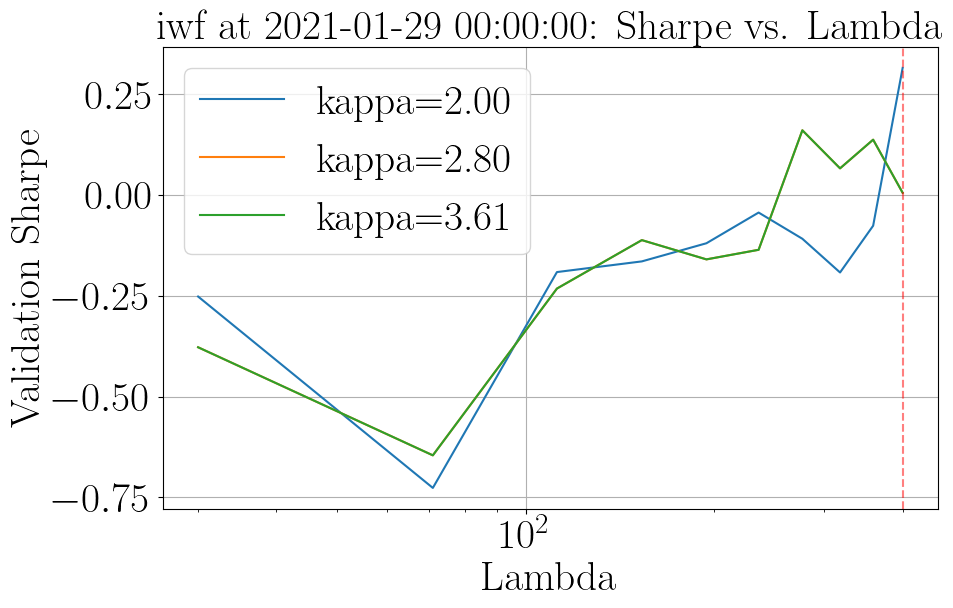


Processing factor mtum
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.00, Sharpe=1.0609


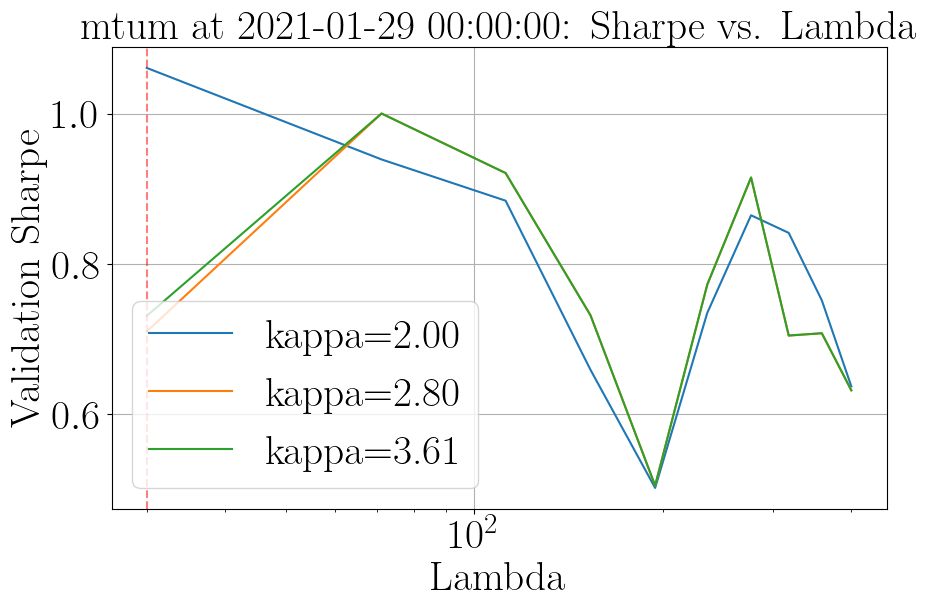


Processing factor qual
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.4304


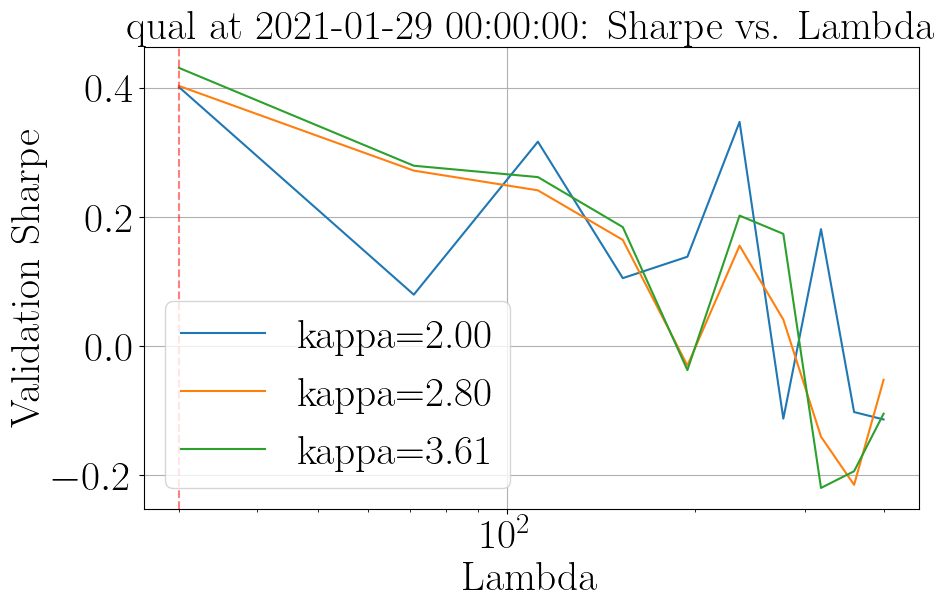


Processing factor size
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=235.56, κ=3.61, Sharpe=0.1604


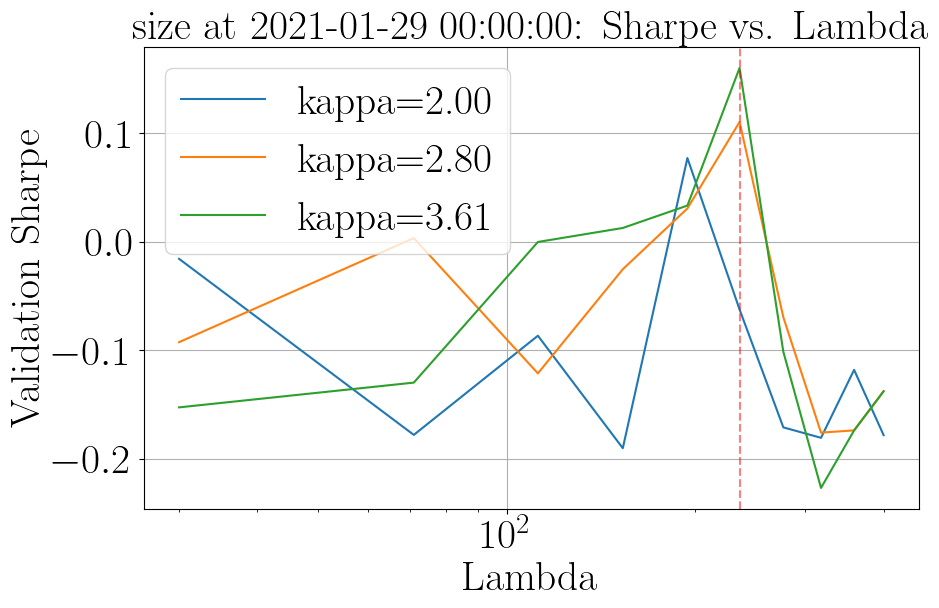


Processing factor usmv
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.2736


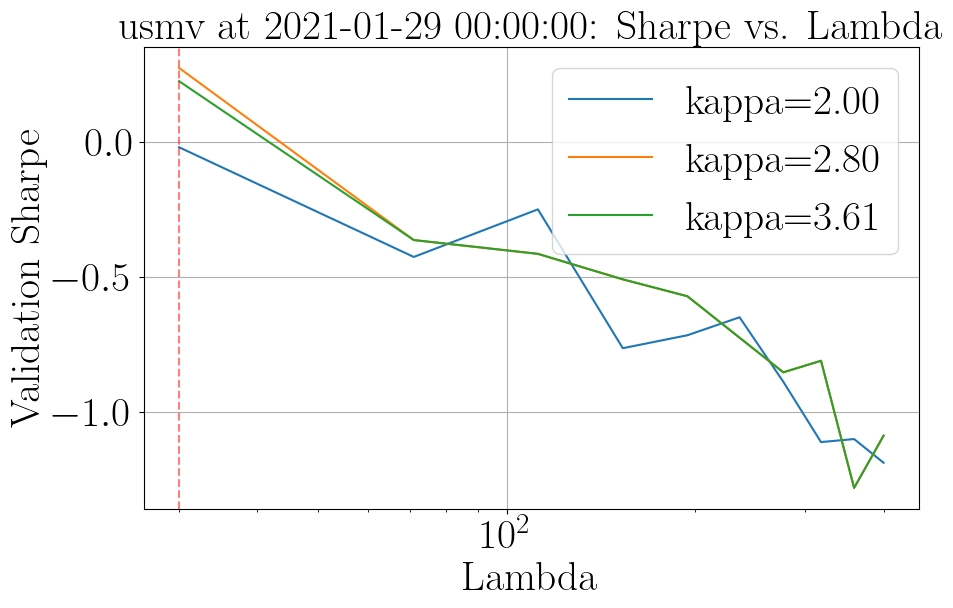


Processing factor vlue
Training: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (12.00 years)
Validation: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (6.00 years)
Training data: 2003-01-28 00:00:00 to 2015-01-28 00:00:00 (2930 days)
Validation data: 2015-01-29 00:00:00 to 2021-01-29 00:00:00 (1512 days)
Best params: λ=153.33, κ=3.61, Sharpe=0.4540


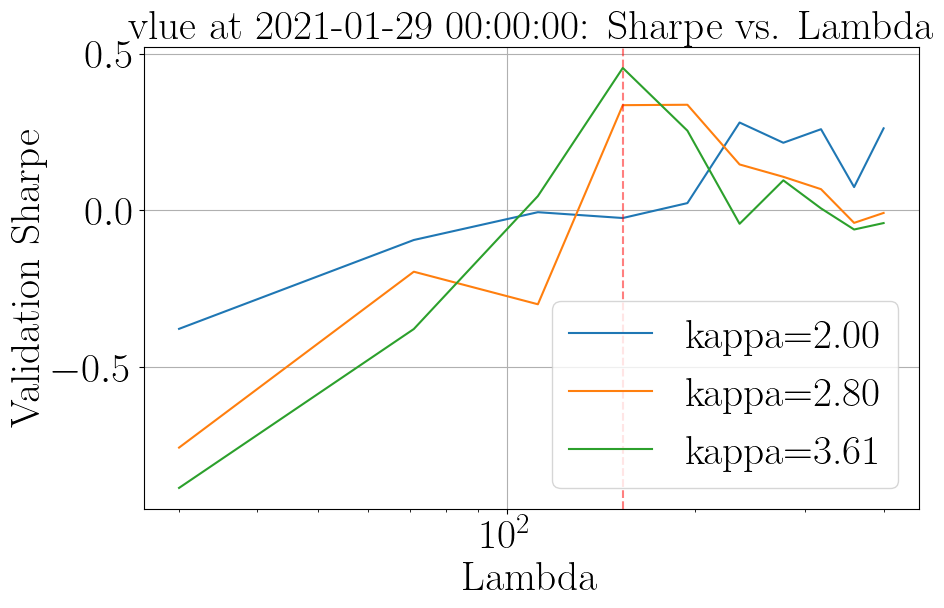


Trading period: 2021-02-26 00:00:00 to 2021-03-31 00:00:00 (23 days)

Trading period: 2021-03-31 00:00:00 to 2021-04-30 00:00:00 (21 days)

Trading period: 2021-04-30 00:00:00 to 2021-05-28 00:00:00 (20 days)

Trading period: 2021-05-28 00:00:00 to 2021-06-30 00:00:00 (22 days)

Trading period: 2021-06-30 00:00:00 to 2021-07-30 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2021-07-30 00:00:00

Processing factor iwf
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=71.11, κ=2.00, Sharpe=0.6566


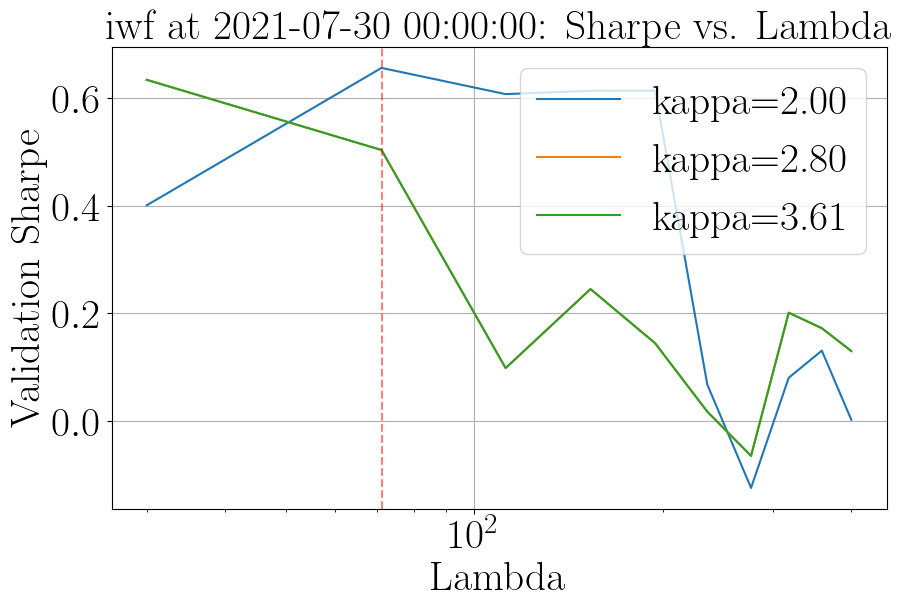


Processing factor mtum
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=317.78, κ=2.00, Sharpe=0.5337


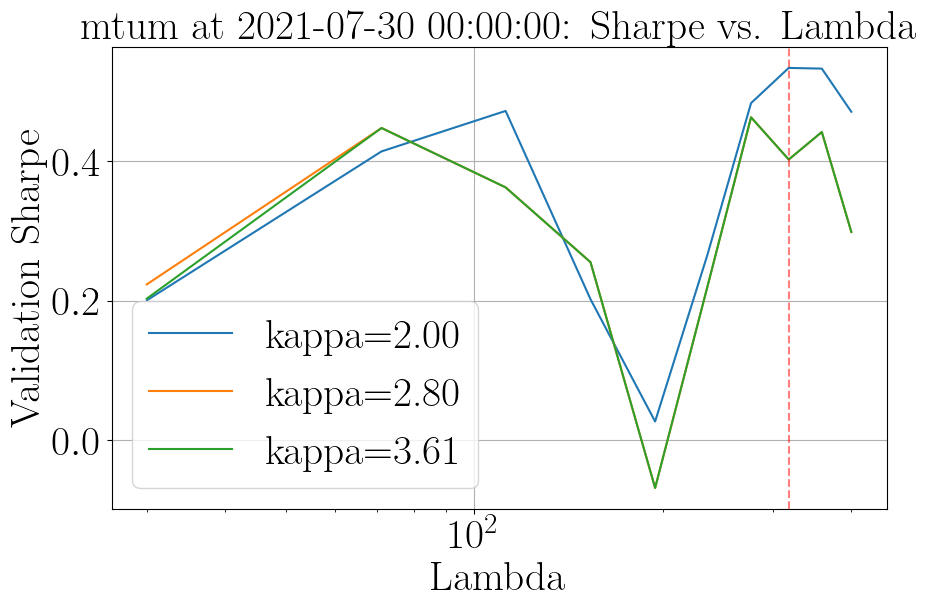


Processing factor qual
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=235.56, κ=2.00, Sharpe=0.4855


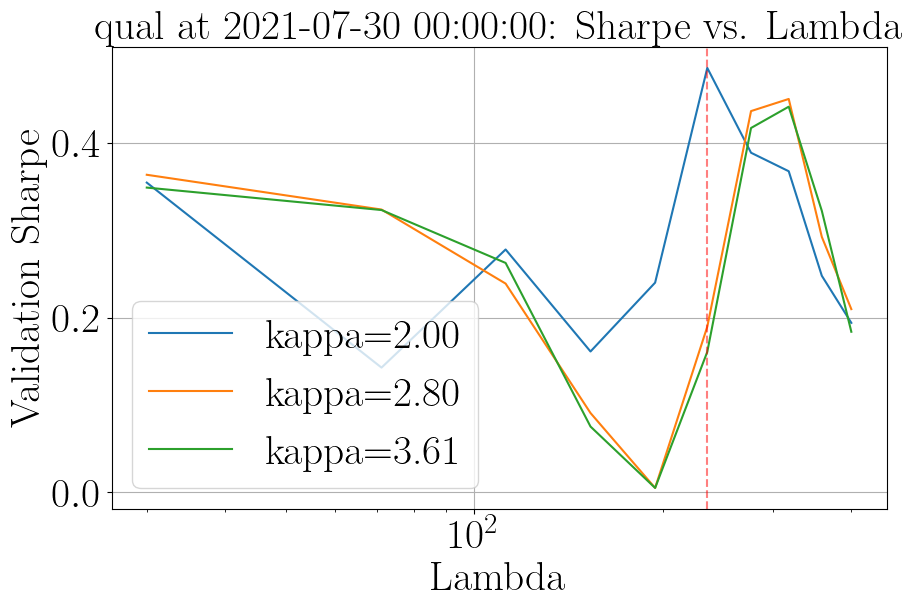


Processing factor size
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=317.78, κ=2.00, Sharpe=-0.0182


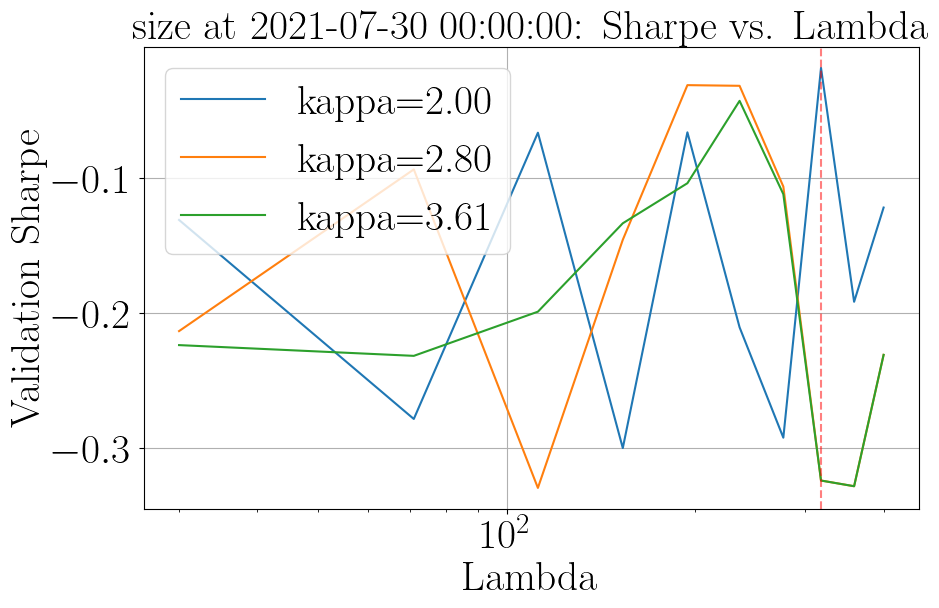


Processing factor usmv
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.1232


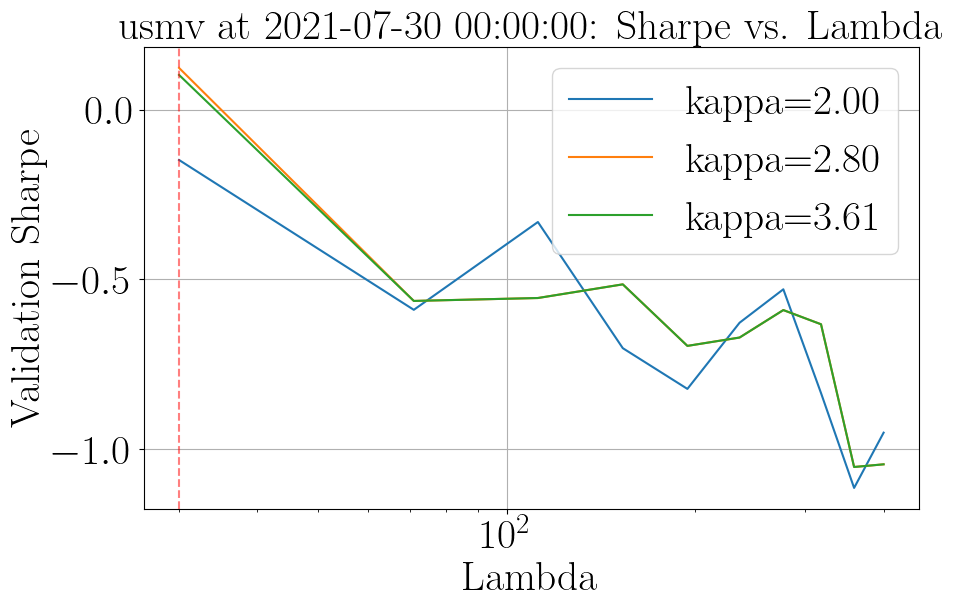


Processing factor vlue
Training: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (12.00 years)
Validation: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (6.00 years)
Training data: 2003-07-29 00:00:00 to 2015-07-29 00:00:00 (2934 days)
Validation data: 2015-07-30 00:00:00 to 2021-07-30 00:00:00 (1512 days)
Best params: λ=235.56, κ=2.80, Sharpe=0.4572


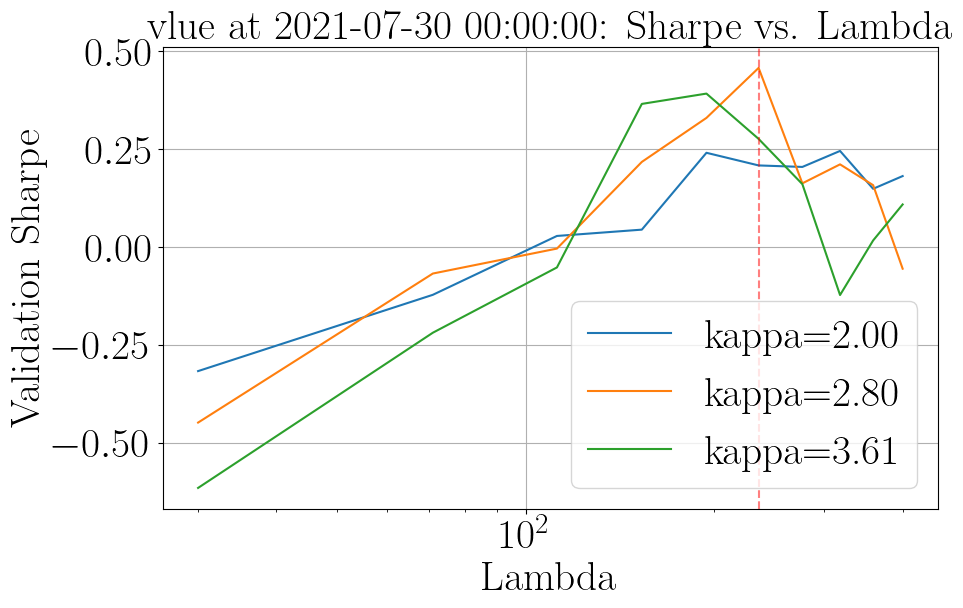


Trading period: 2021-08-31 00:00:00 to 2021-09-30 00:00:00 (21 days)

Trading period: 2021-09-30 00:00:00 to 2021-10-29 00:00:00 (21 days)

Trading period: 2021-10-29 00:00:00 to 2021-11-30 00:00:00 (21 days)

Trading period: 2021-11-30 00:00:00 to 2021-12-31 00:00:00 (22 days)

Trading period: 2021-12-31 00:00:00 to 2022-01-31 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2022-01-31 00:00:00

Processing factor iwf
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=30.00, κ=2.00, Sharpe=0.5662


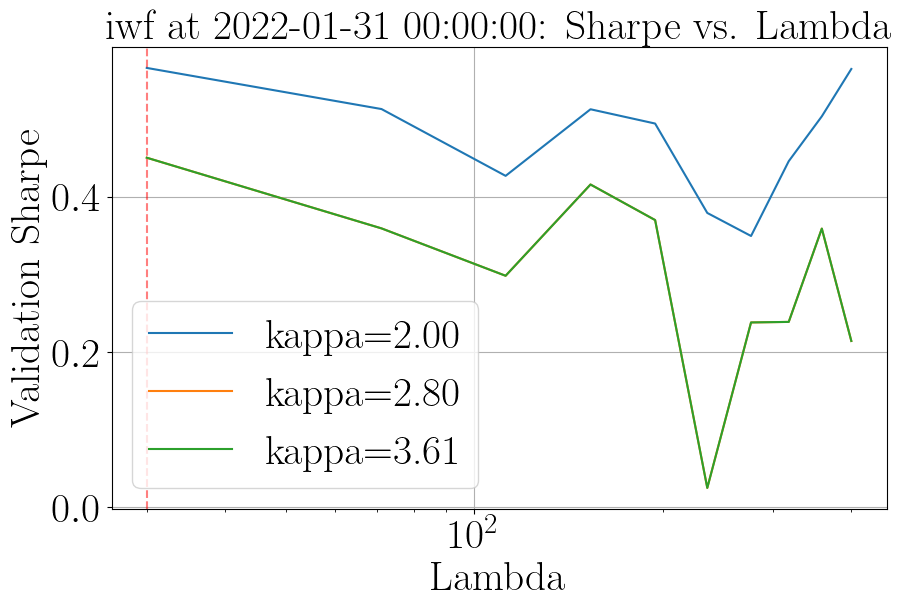


Processing factor mtum
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=71.11, κ=2.80, Sharpe=0.4209


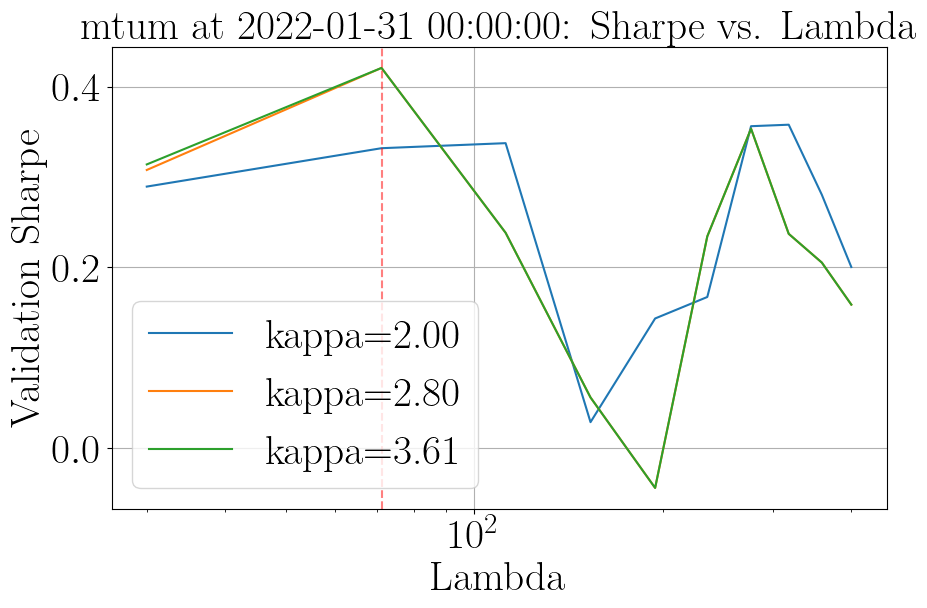


Processing factor qual
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=235.56, κ=2.80, Sharpe=0.2468


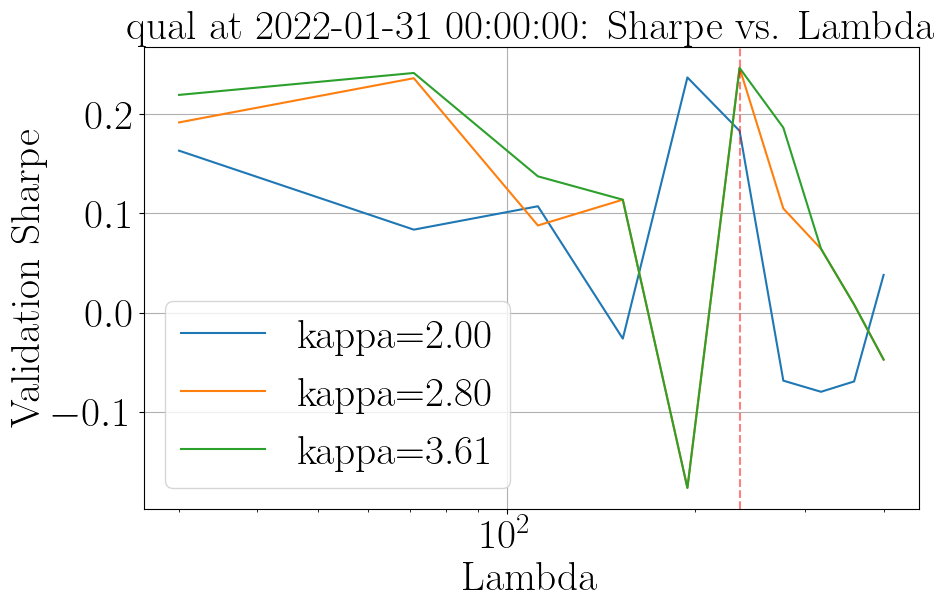


Processing factor size
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=400.00, κ=2.00, Sharpe=0.0365


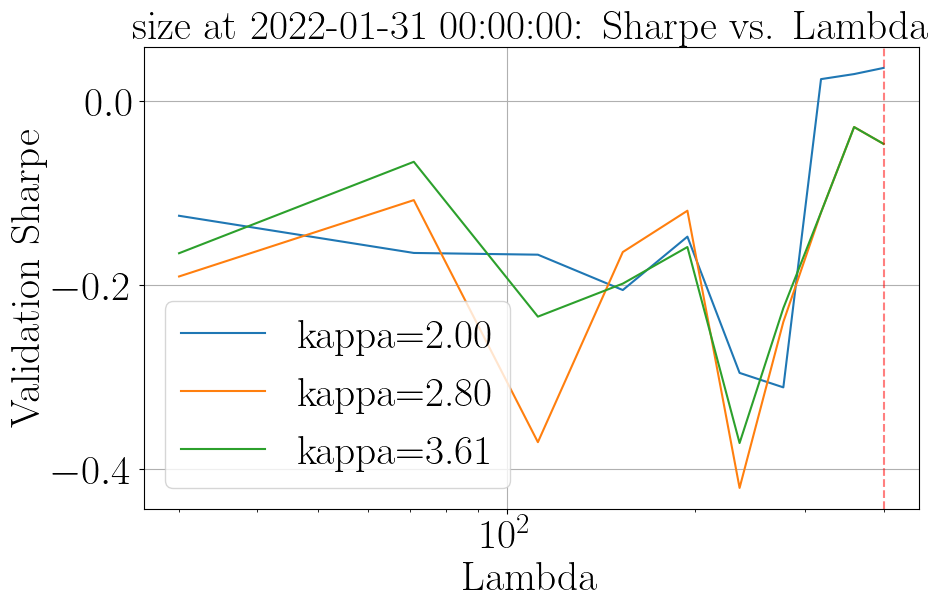


Processing factor usmv
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=30.00, κ=3.61, Sharpe=-0.0275


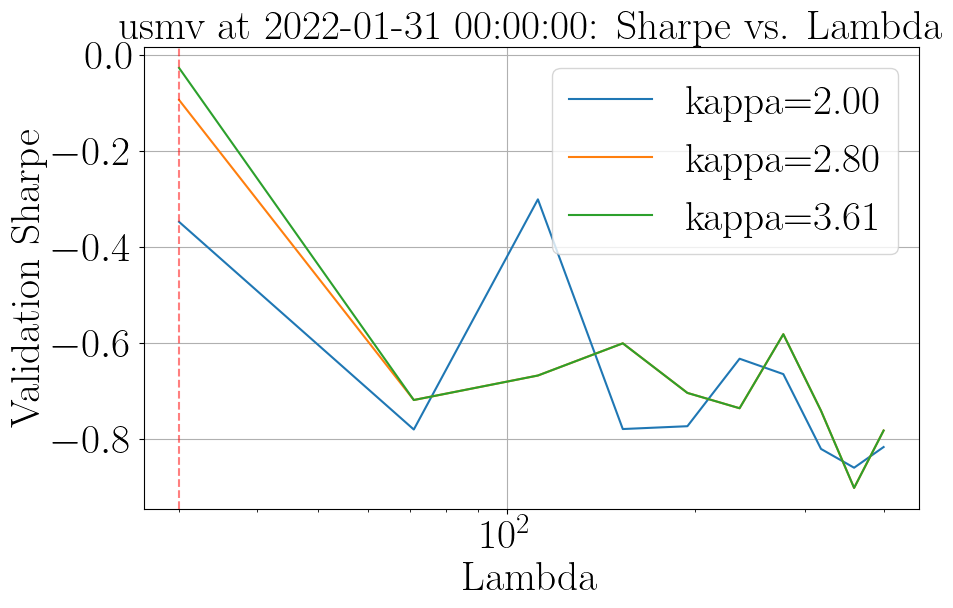


Processing factor vlue
Training: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (12.00 years)
Validation: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (6.00 years)
Training data: 2004-01-30 00:00:00 to 2016-01-29 00:00:00 (2938 days)
Validation data: 2016-02-01 00:00:00 to 2022-01-31 00:00:00 (1512 days)
Best params: λ=112.22, κ=2.80, Sharpe=0.4393


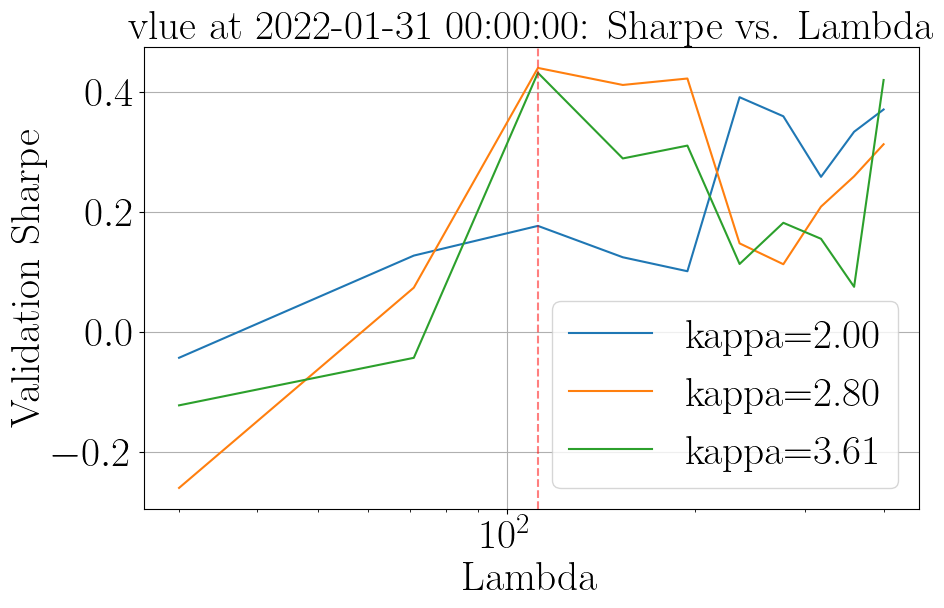


Trading period: 2022-02-28 00:00:00 to 2022-03-31 00:00:00 (23 days)

Trading period: 2022-03-31 00:00:00 to 2022-04-29 00:00:00 (20 days)

Trading period: 2022-04-29 00:00:00 to 2022-05-31 00:00:00 (21 days)

Trading period: 2022-05-31 00:00:00 to 2022-06-30 00:00:00 (21 days)

Trading period: 2022-06-30 00:00:00 to 2022-07-29 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2022-07-29 00:00:00

Processing factor iwf
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=194.44, κ=2.00, Sharpe=0.5026


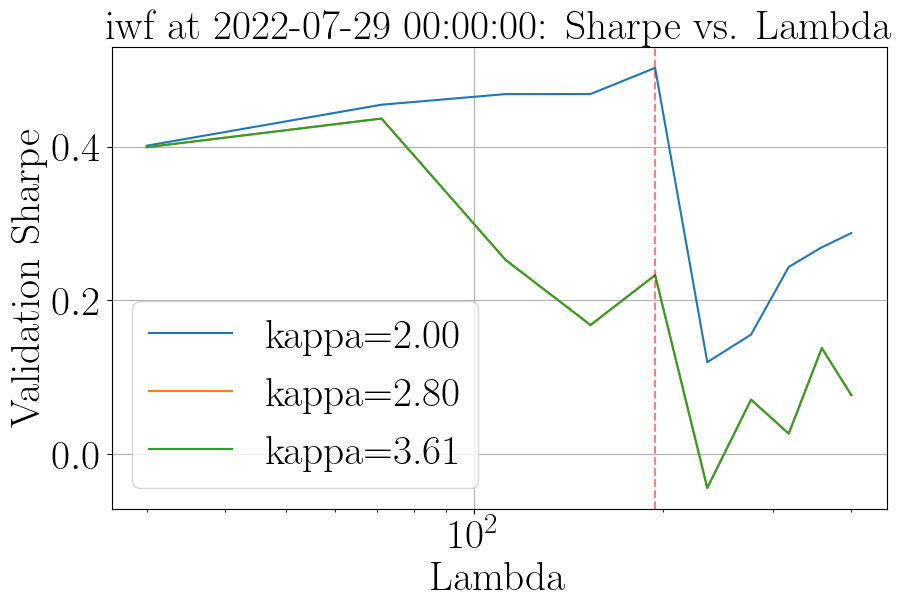


Processing factor mtum
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=71.11, κ=2.80, Sharpe=0.4777


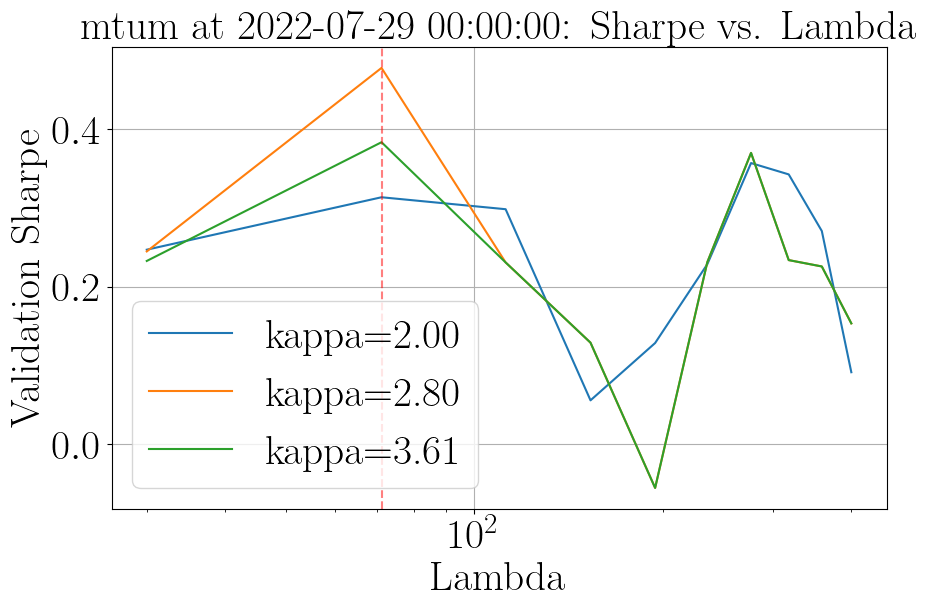


Processing factor qual
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=194.44, κ=2.00, Sharpe=0.3768


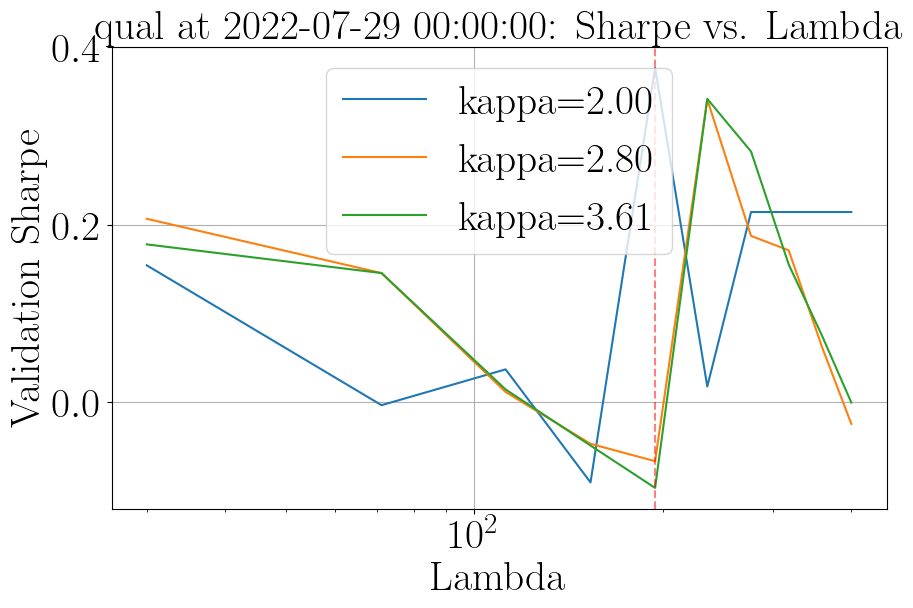


Processing factor size
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.80, Sharpe=0.3656


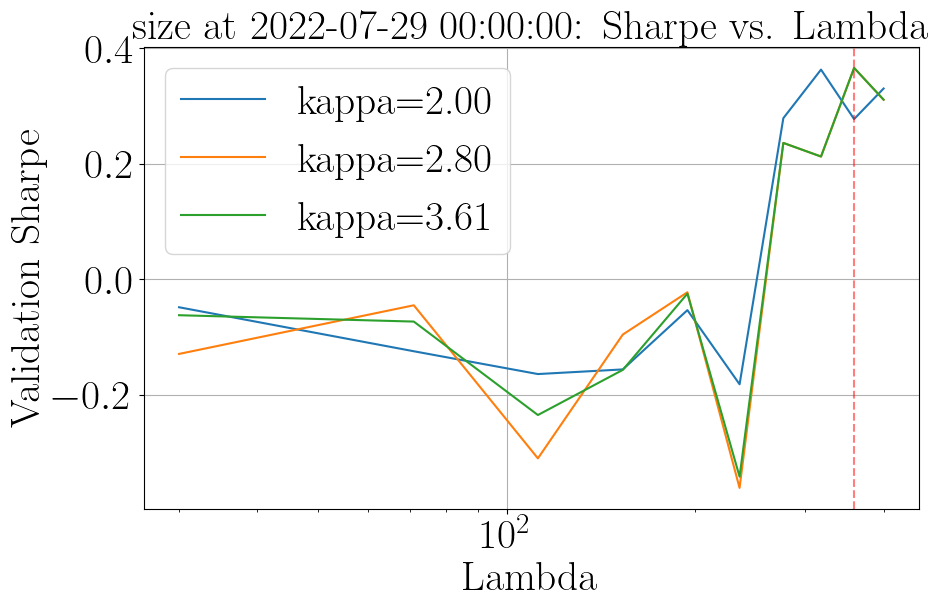


Processing factor usmv
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.0062


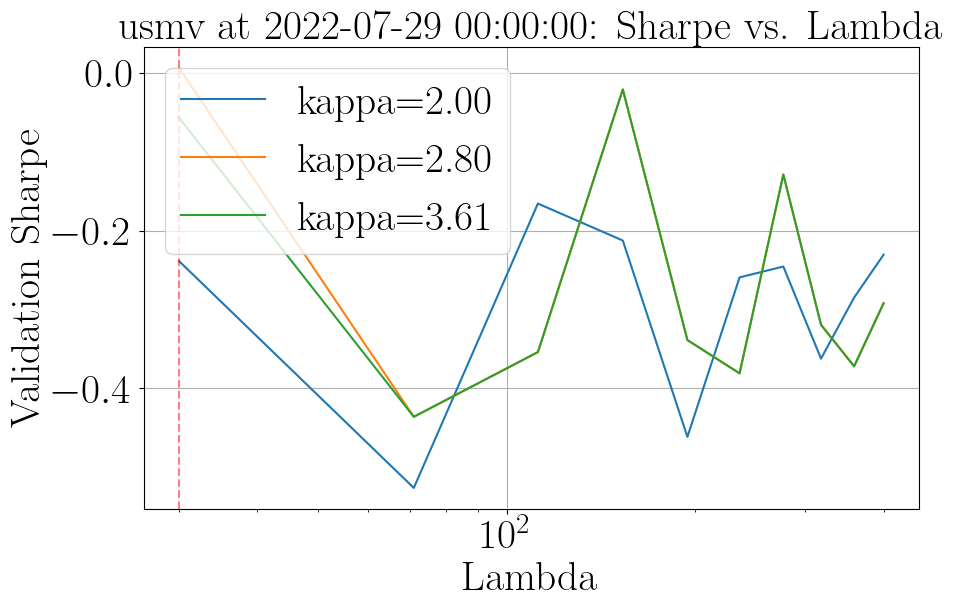


Processing factor vlue
Training: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (12.00 years)
Validation: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (6.00 years)
Training data: 2004-07-28 00:00:00 to 2016-07-28 00:00:00 (2945 days)
Validation data: 2016-07-29 00:00:00 to 2022-07-29 00:00:00 (1511 days)
Best params: λ=153.33, κ=2.80, Sharpe=0.5389


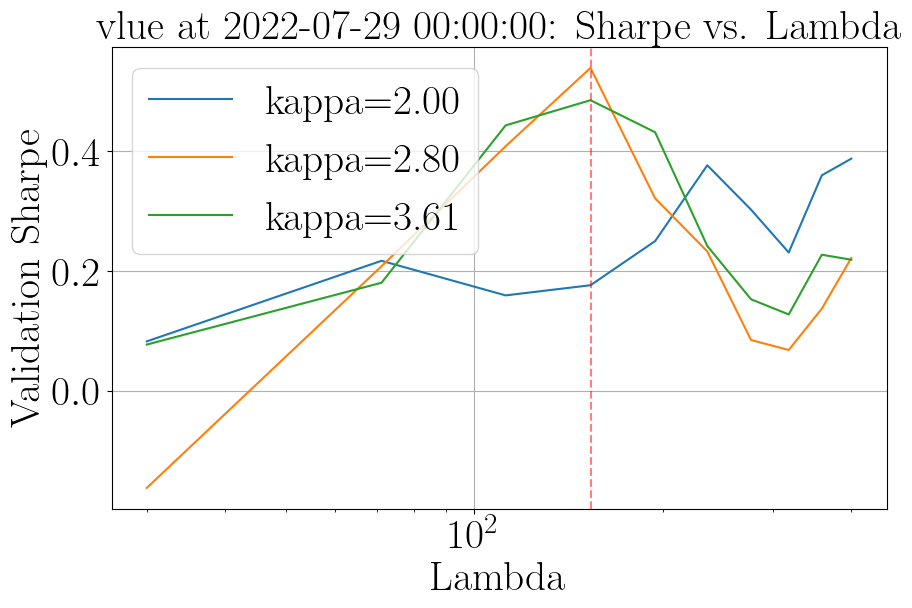


Trading period: 2022-08-31 00:00:00 to 2022-09-30 00:00:00 (21 days)

Trading period: 2022-09-30 00:00:00 to 2022-10-31 00:00:00 (21 days)

Trading period: 2022-10-31 00:00:00 to 2022-11-30 00:00:00 (21 days)

Trading period: 2022-11-30 00:00:00 to 2022-12-30 00:00:00 (21 days)

Trading period: 2022-12-30 00:00:00 to 2023-01-31 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2023-01-31 00:00:00

Processing factor iwf
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=194.44, κ=2.00, Sharpe=0.4413


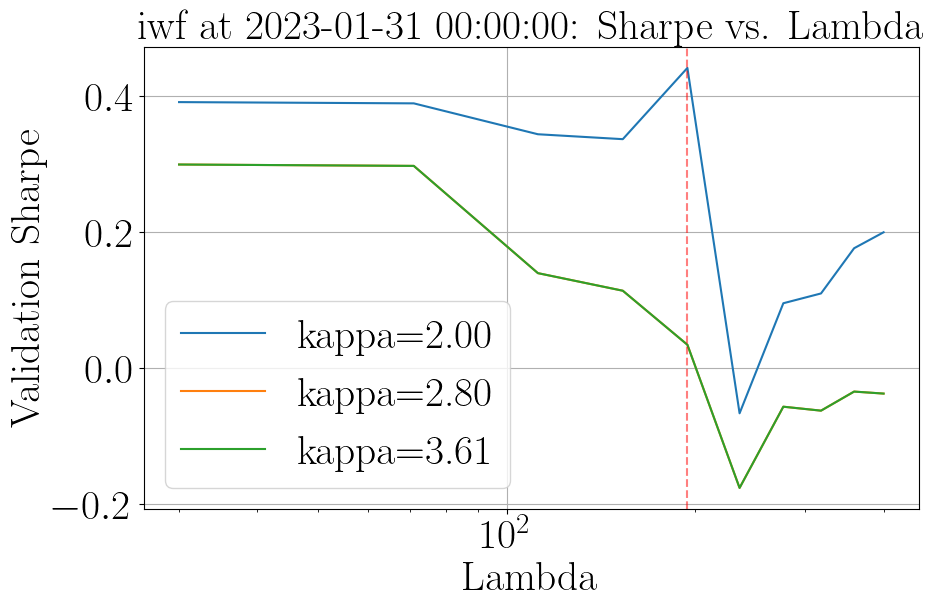


Processing factor mtum
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.2943


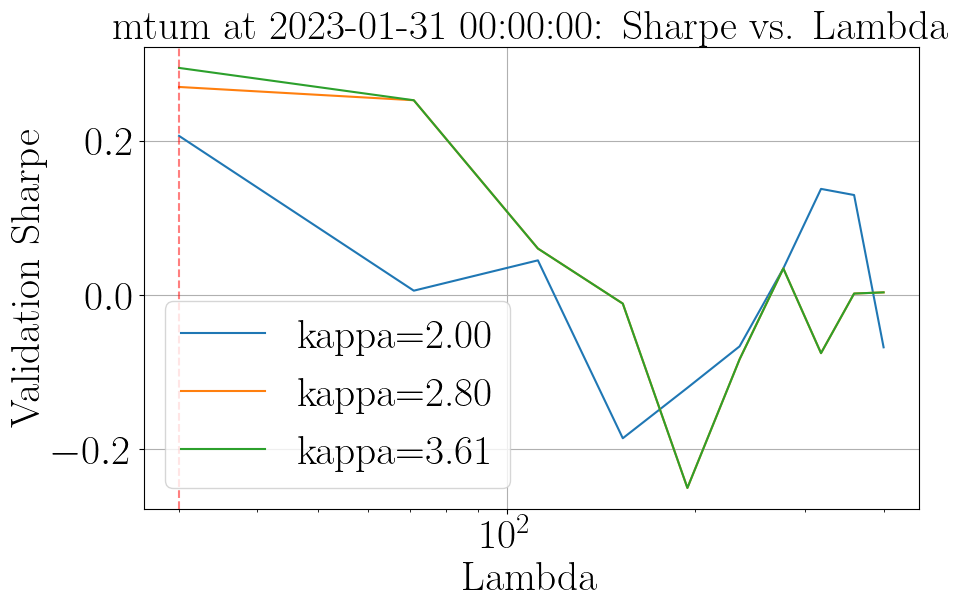


Processing factor qual
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=235.56, κ=3.61, Sharpe=0.5252


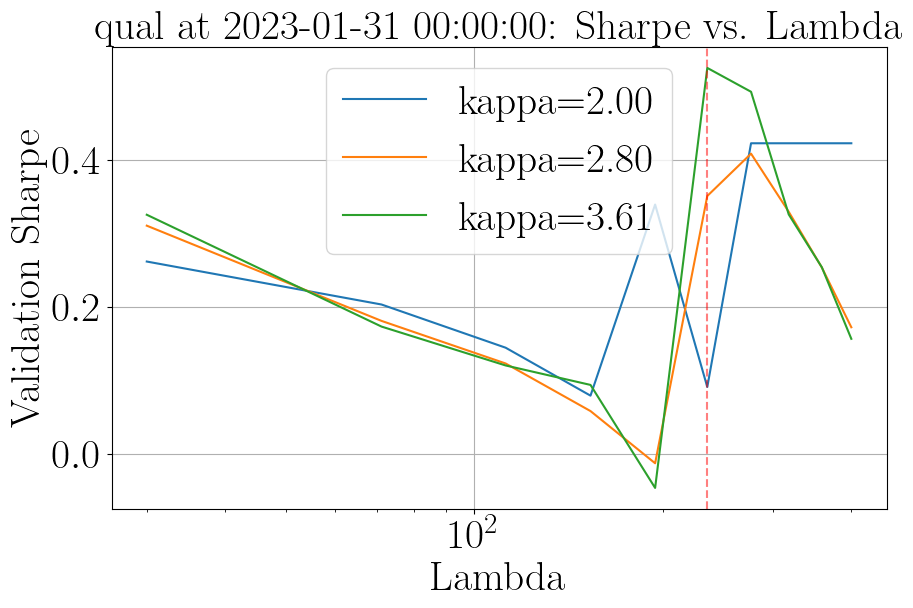


Processing factor size
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=317.78, κ=2.00, Sharpe=0.3219


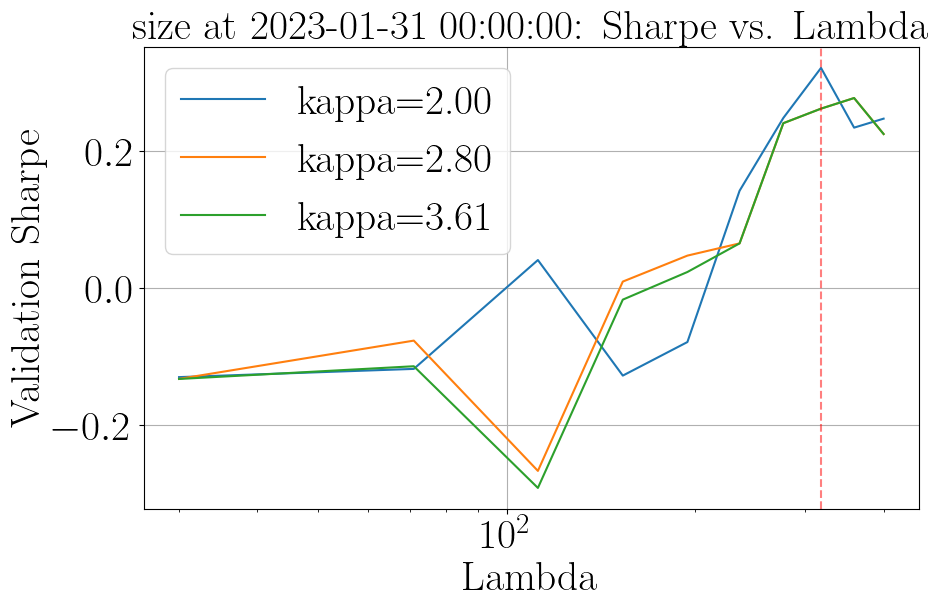


Processing factor usmv
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=276.67, κ=2.80, Sharpe=0.1102


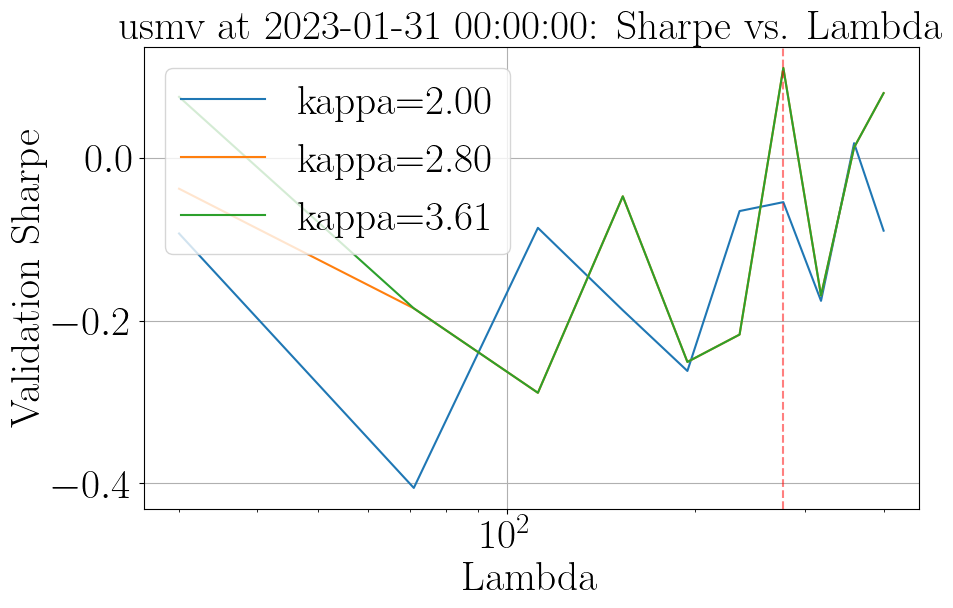


Processing factor vlue
Training: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (12.00 years)
Validation: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (6.00 years)
Training data: 2005-01-31 00:00:00 to 2017-01-30 00:00:00 (2947 days)
Validation data: 2017-01-31 00:00:00 to 2023-01-31 00:00:00 (1511 days)
Best params: λ=112.22, κ=3.61, Sharpe=0.3857


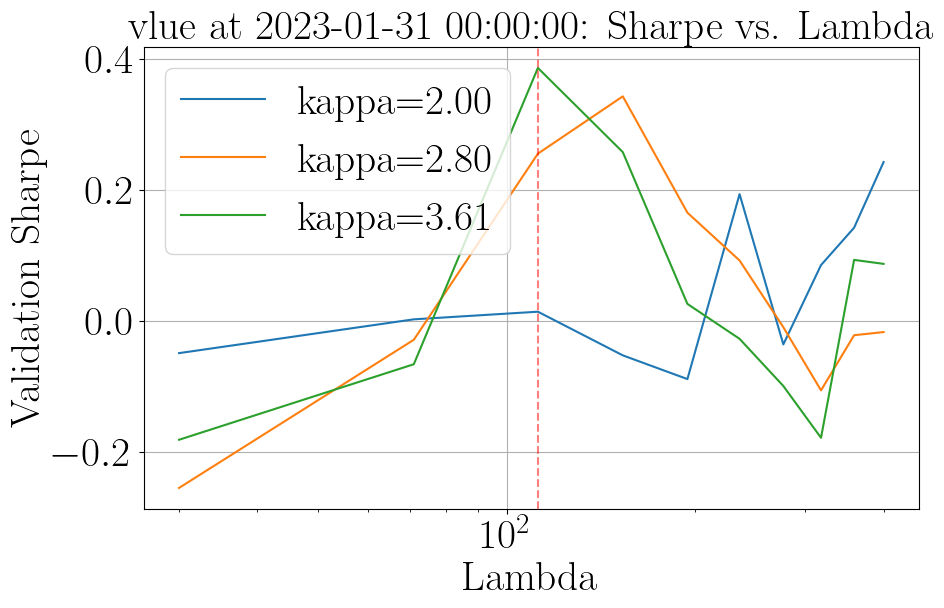


Trading period: 2023-02-28 00:00:00 to 2023-03-31 00:00:00 (23 days)

Trading period: 2023-03-31 00:00:00 to 2023-04-28 00:00:00 (19 days)

Trading period: 2023-04-28 00:00:00 to 2023-05-31 00:00:00 (22 days)

Trading period: 2023-05-31 00:00:00 to 2023-06-30 00:00:00 (21 days)

Trading period: 2023-06-30 00:00:00 to 2023-07-31 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2023-07-31 00:00:00

Processing factor iwf
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=112.22, κ=2.00, Sharpe=0.6245


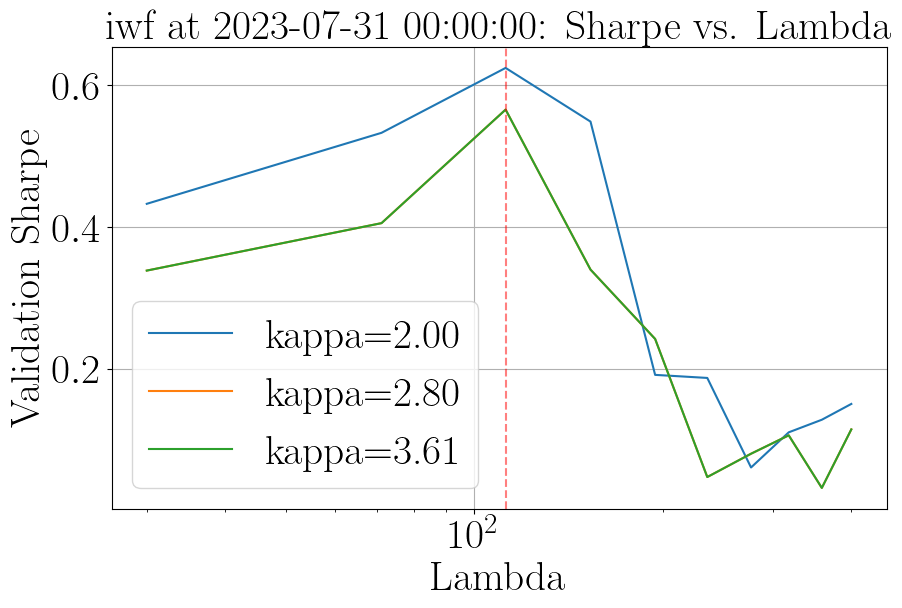


Processing factor mtum
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.1239


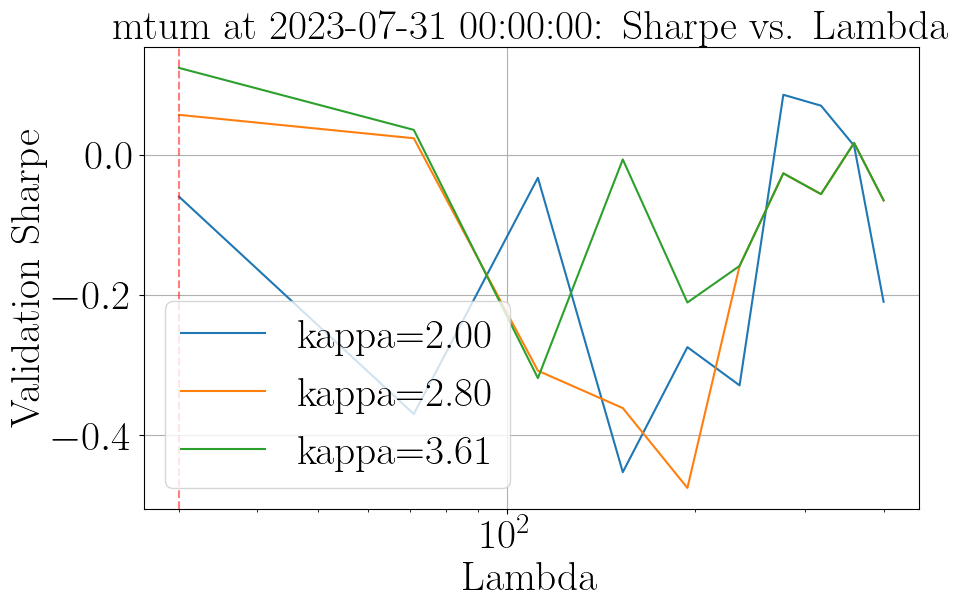


Processing factor qual
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=276.67, κ=3.61, Sharpe=0.5033


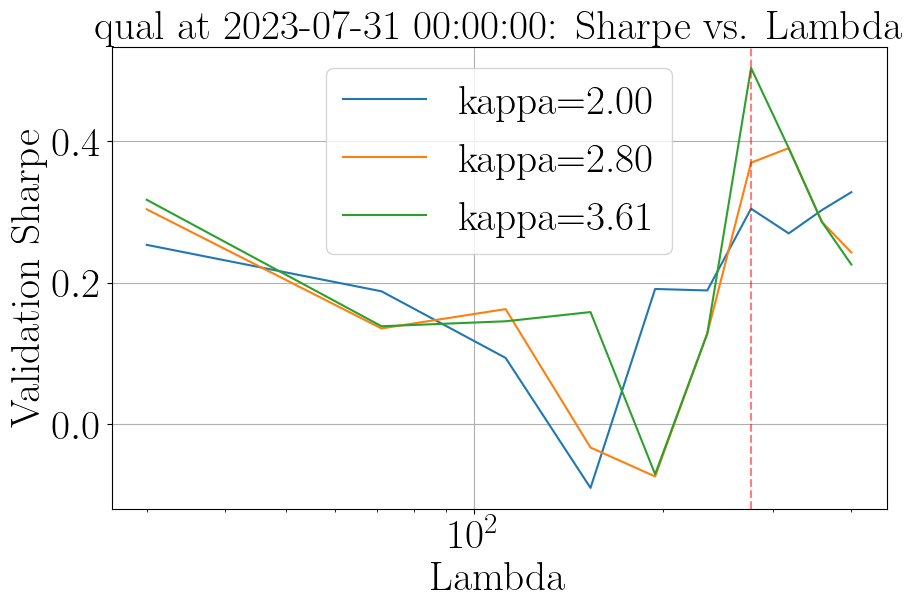


Processing factor size
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=317.78, κ=2.00, Sharpe=0.2799


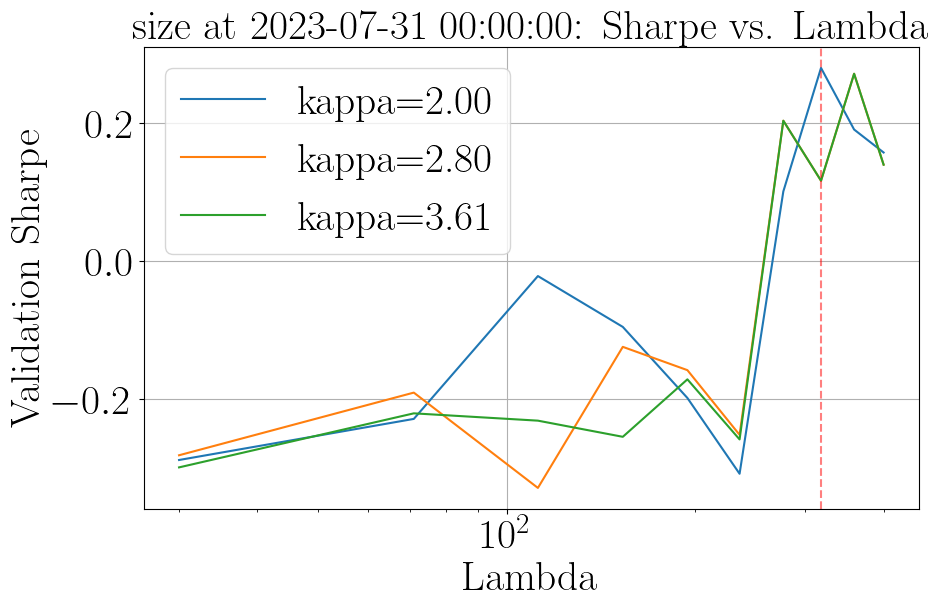


Processing factor usmv
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=153.33, κ=2.80, Sharpe=0.1897


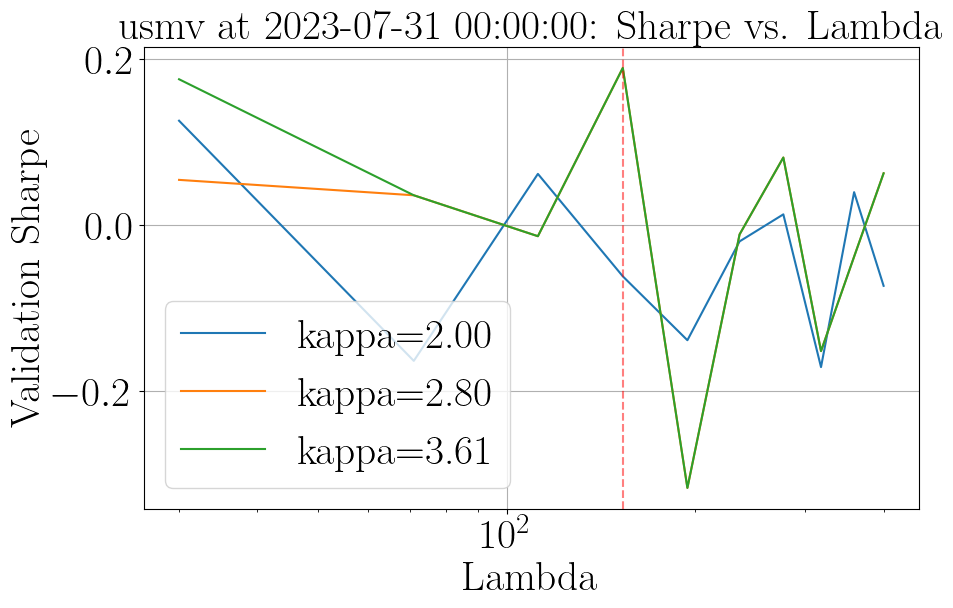


Processing factor vlue
Training: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (11.99 years)
Validation: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (6.00 years)
Training data: 2005-08-01 00:00:00 to 2017-07-28 00:00:00 (2950 days)
Validation data: 2017-07-31 00:00:00 to 2023-07-31 00:00:00 (1510 days)
Best params: λ=153.33, κ=2.80, Sharpe=0.3301


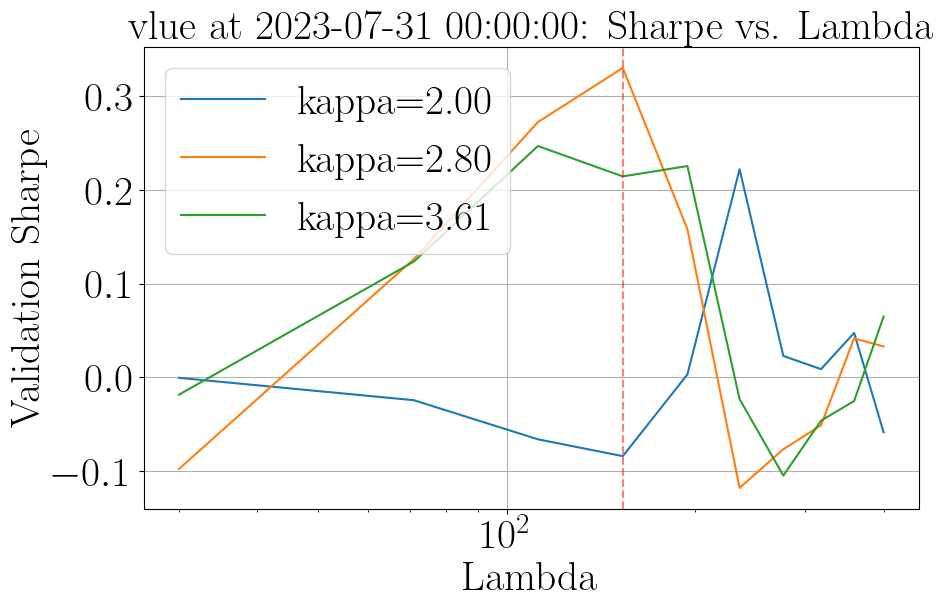


Trading period: 2023-08-31 00:00:00 to 2023-09-29 00:00:00 (20 days)

Trading period: 2023-09-29 00:00:00 to 2023-10-31 00:00:00 (22 days)

Trading period: 2023-10-31 00:00:00 to 2023-11-30 00:00:00 (21 days)

Trading period: 2023-11-30 00:00:00 to 2023-12-29 00:00:00 (20 days)

Trading period: 2023-12-29 00:00:00 to 2024-01-31 00:00:00 (21 days)

CROSS-VALIDATION PERIOD: 2024-01-31 00:00:00

Processing factor iwf
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=112.22, κ=2.00, Sharpe=0.5497


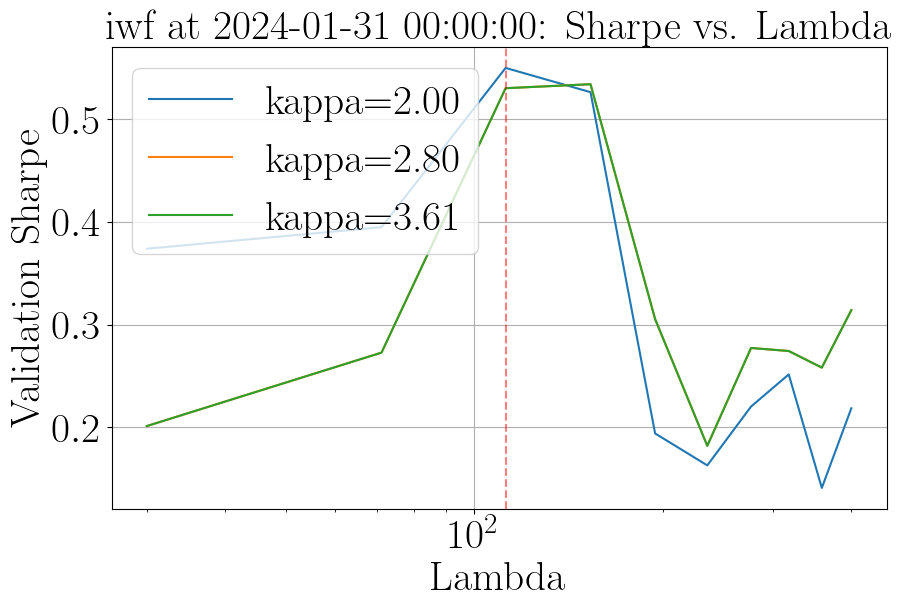


Processing factor mtum
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=235.56, κ=2.80, Sharpe=0.3086


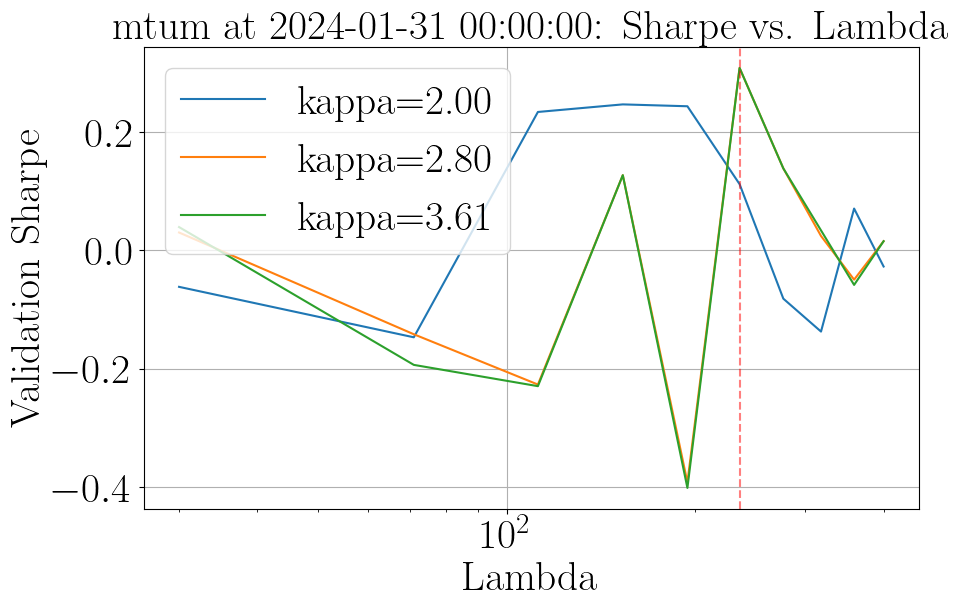


Processing factor qual
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=276.67, κ=2.00, Sharpe=0.5601


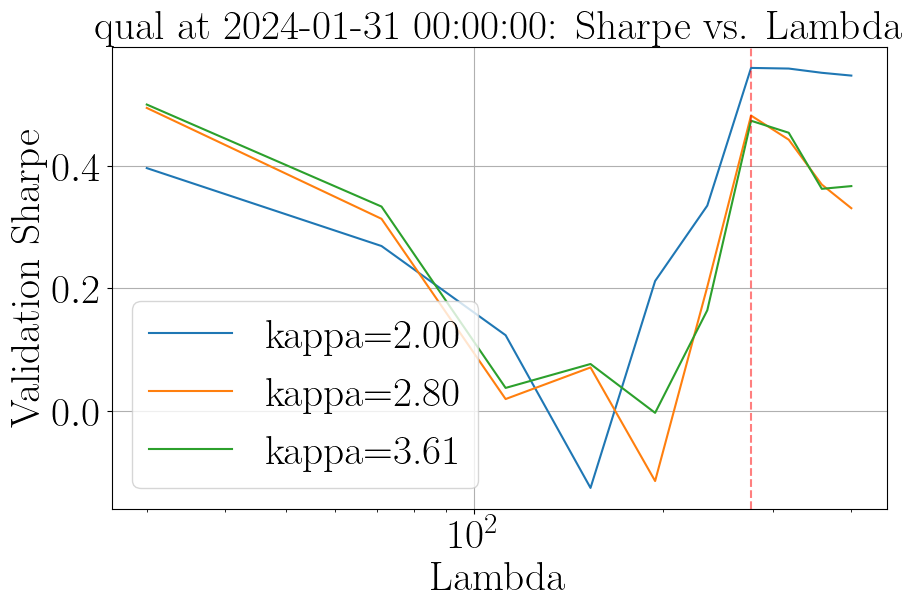


Processing factor size
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=358.89, κ=2.80, Sharpe=0.4521


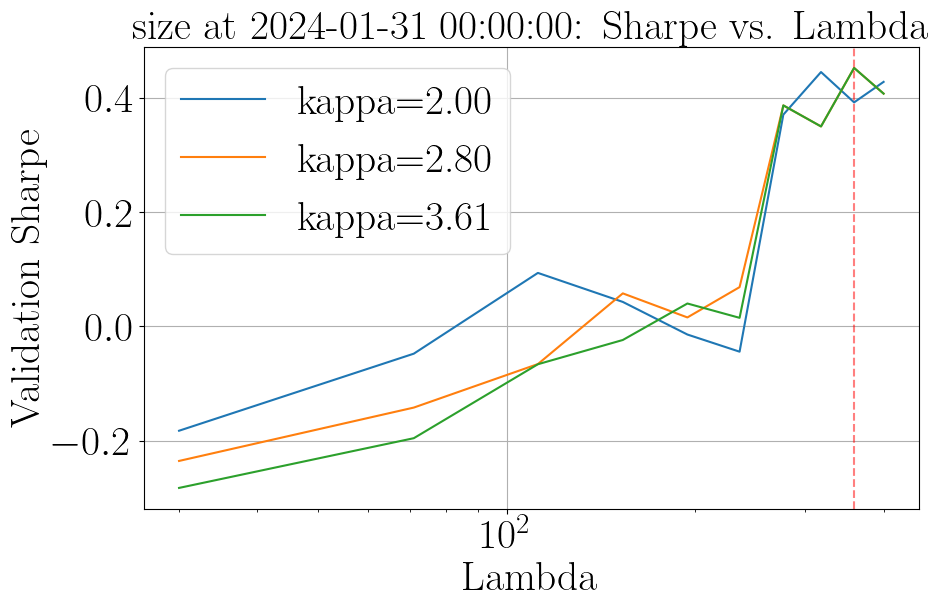


Processing factor usmv
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.0927


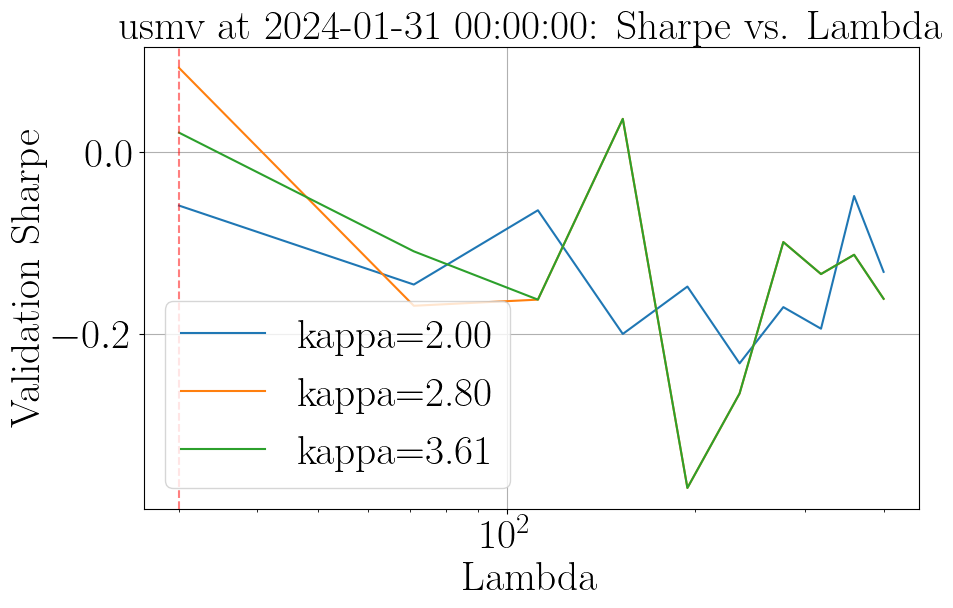


Processing factor vlue
Training: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (12.00 years)
Validation: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (6.00 years)
Training data: 2006-01-30 00:00:00 to 2018-01-30 00:00:00 (2957 days)
Validation data: 2018-01-31 00:00:00 to 2024-01-31 00:00:00 (1510 days)
Best params: λ=153.33, κ=3.61, Sharpe=0.3153


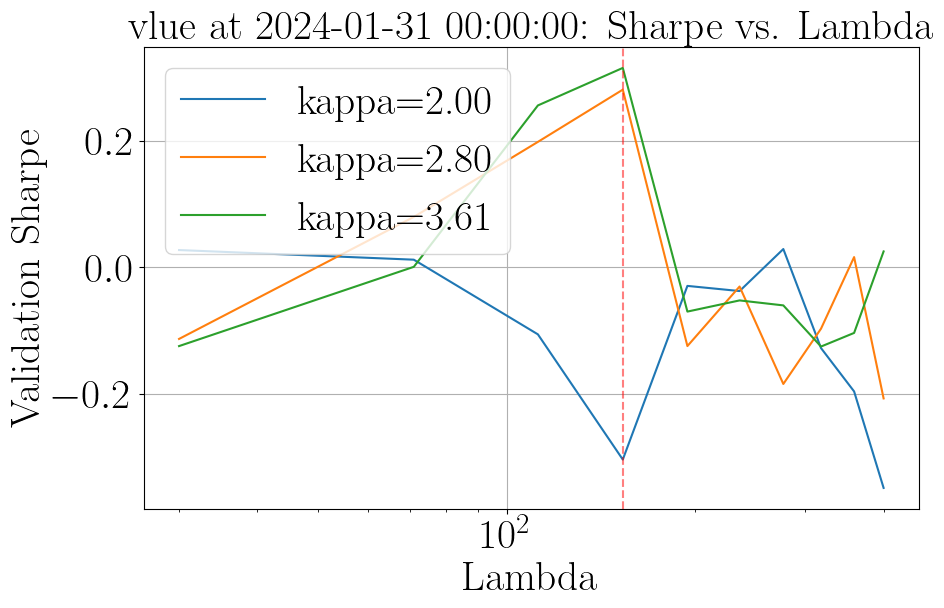


Trading period: 2024-02-29 00:00:00 to 2024-03-29 00:00:00 (21 days)

Trading period: 2024-03-29 00:00:00 to 2024-04-30 00:00:00 (22 days)

Trading period: 2024-04-30 00:00:00 to 2024-05-31 00:00:00 (22 days)

Trading period: 2024-05-31 00:00:00 to 2024-06-28 00:00:00 (19 days)

Trading period: 2024-06-28 00:00:00 to 2024-07-31 00:00:00 (22 days)

CROSS-VALIDATION PERIOD: 2024-07-31 00:00:00

Processing factor iwf
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=112.22, κ=2.00, Sharpe=0.5045


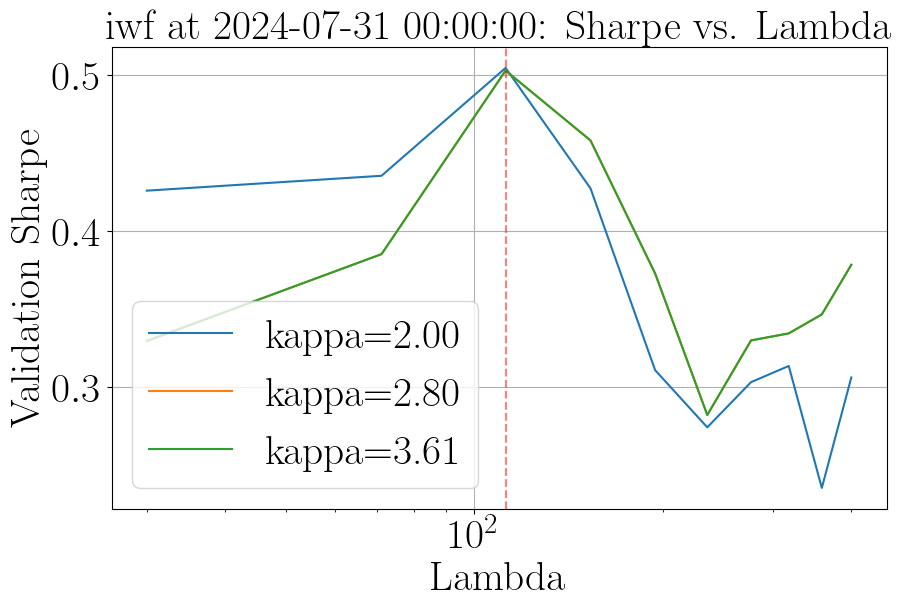


Processing factor mtum
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.00, Sharpe=0.3992


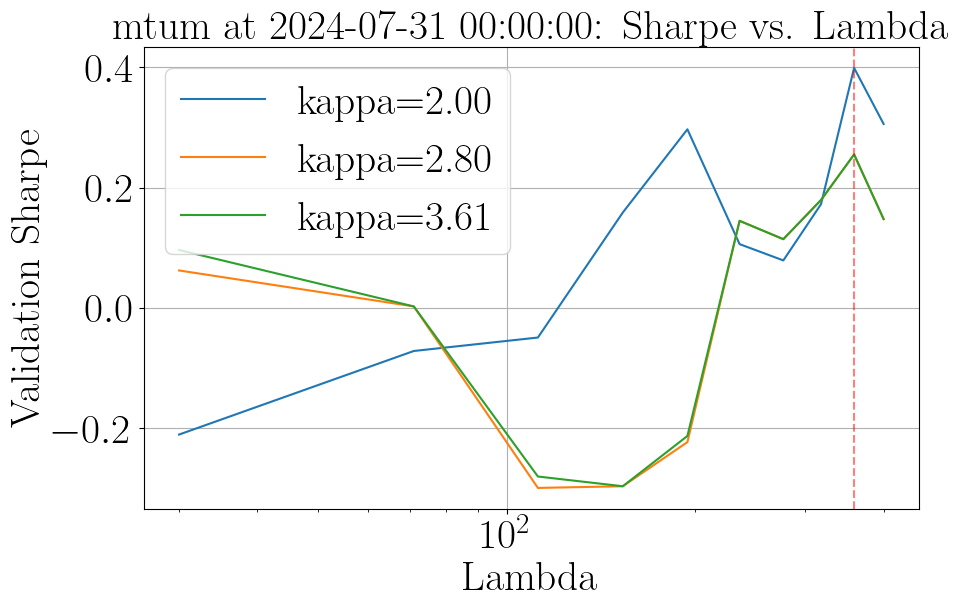


Processing factor qual
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.6557


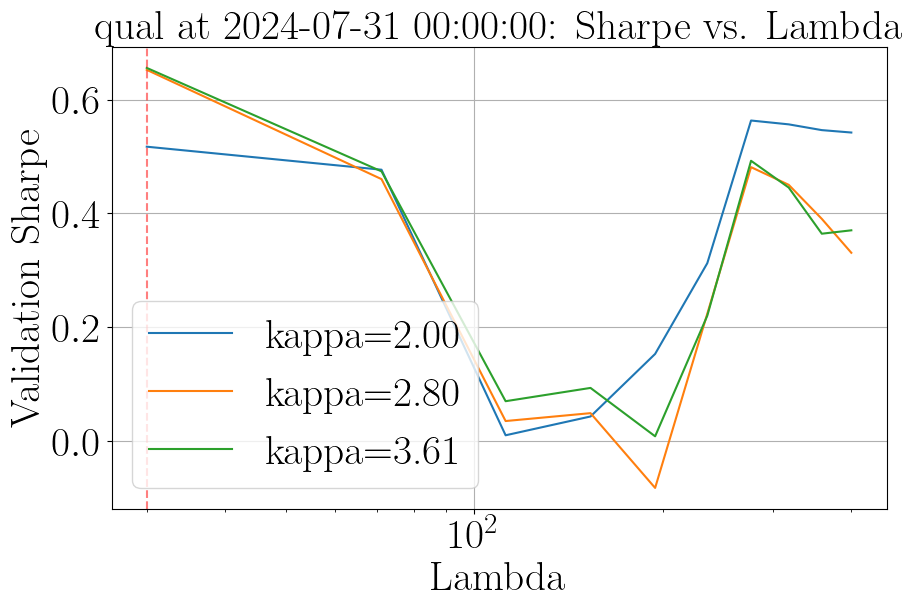


Processing factor size
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.80, Sharpe=0.5007


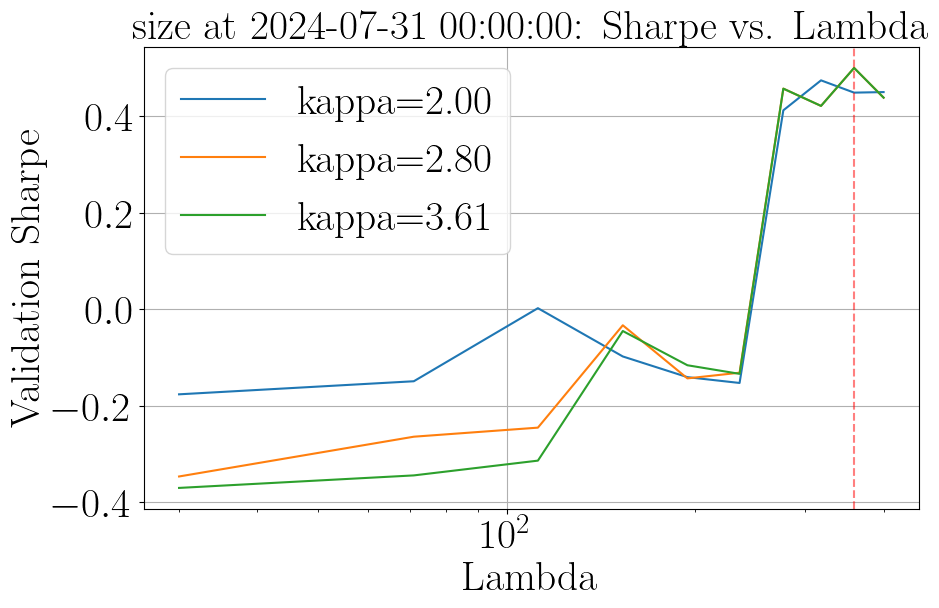


Processing factor usmv
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.2328


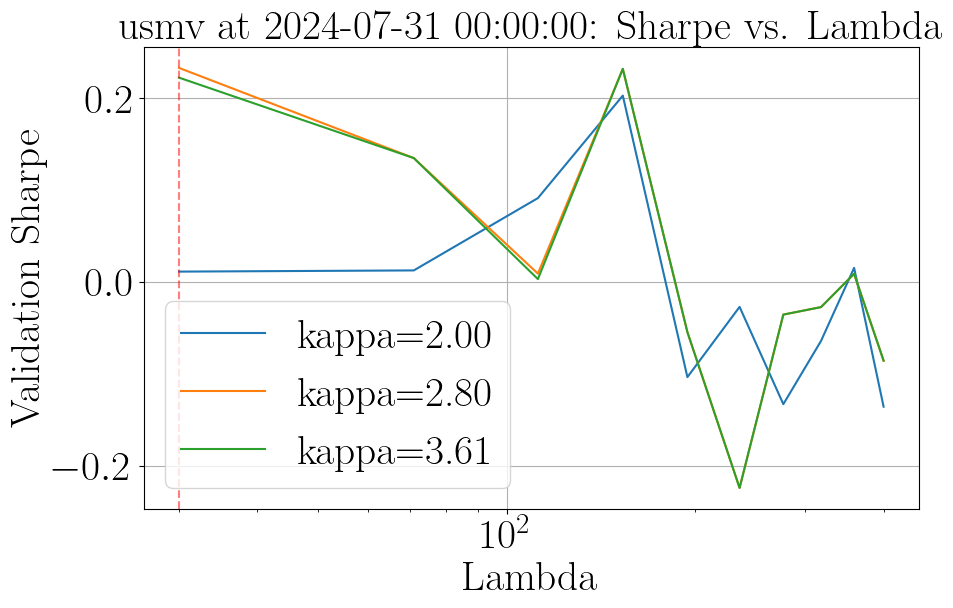


Processing factor vlue
Training: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (12.00 years)
Validation: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (6.00 years)
Training data: 2006-07-31 00:00:00 to 2018-07-30 00:00:00 (2960 days)
Validation data: 2018-07-31 00:00:00 to 2024-07-31 00:00:00 (1511 days)
Best params: λ=112.22, κ=2.80, Sharpe=0.2228


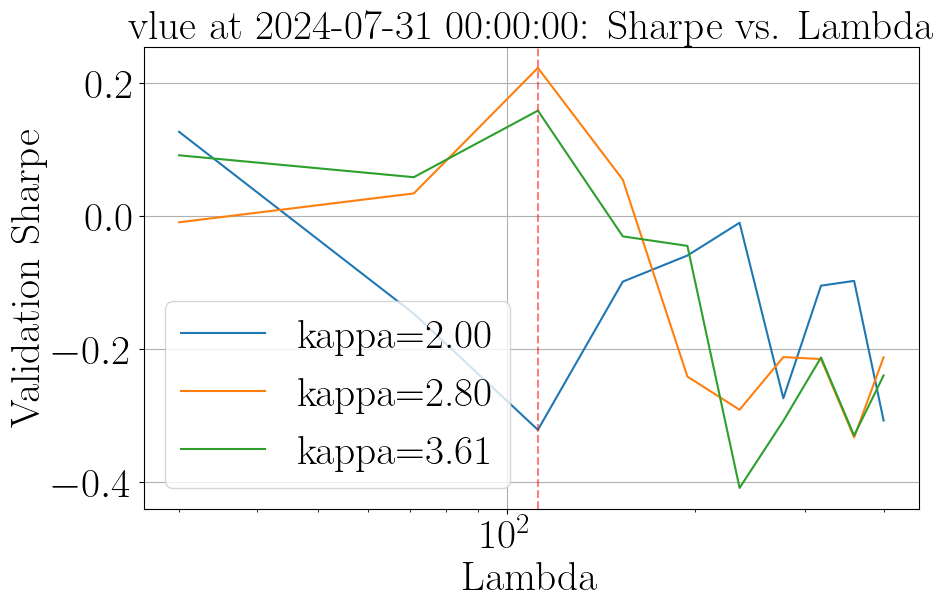


Trading period: 2024-08-30 00:00:00 to 2024-09-30 00:00:00 (20 days)

Trading period: 2024-09-30 00:00:00 to 2024-10-31 00:00:00 (23 days)

Trading period: 2024-10-31 00:00:00 to 2024-11-29 00:00:00 (20 days)

Trading period: 2024-11-29 00:00:00 to 2024-12-31 00:00:00 (21 days)

Trading period: 2024-12-31 00:00:00 to 2025-01-31 00:00:00 (20 days)

CROSS-VALIDATION PERIOD: 2025-01-31 00:00:00

Processing factor iwf
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=153.33, κ=2.00, Sharpe=0.6748


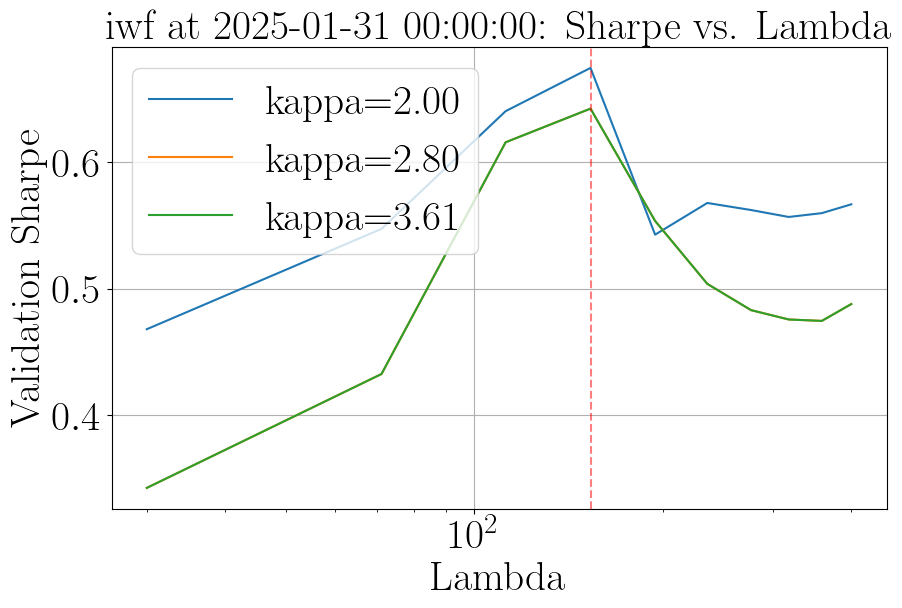


Processing factor mtum
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=276.67, κ=2.00, Sharpe=0.2927


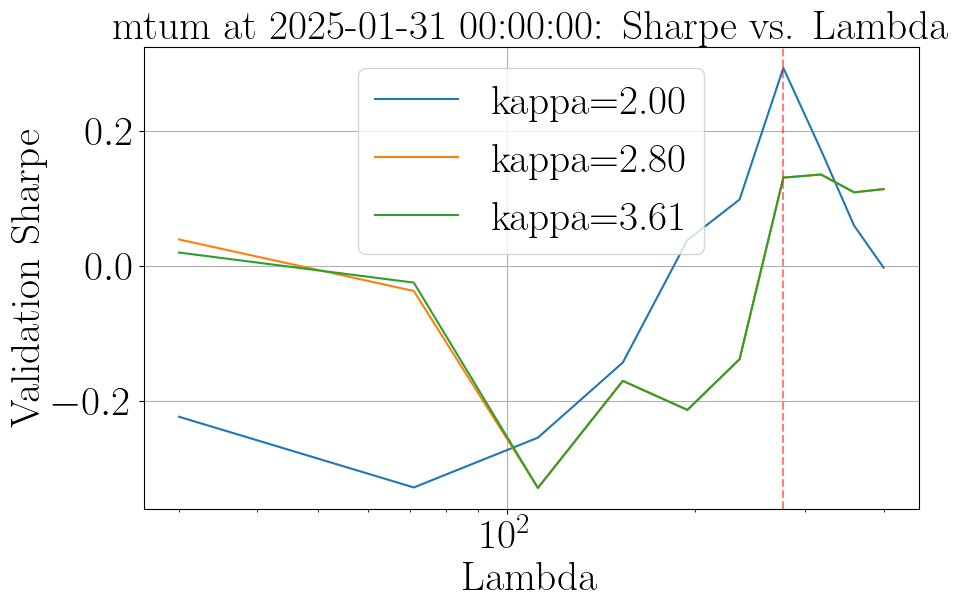


Processing factor qual
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=30.00, κ=2.80, Sharpe=0.6398


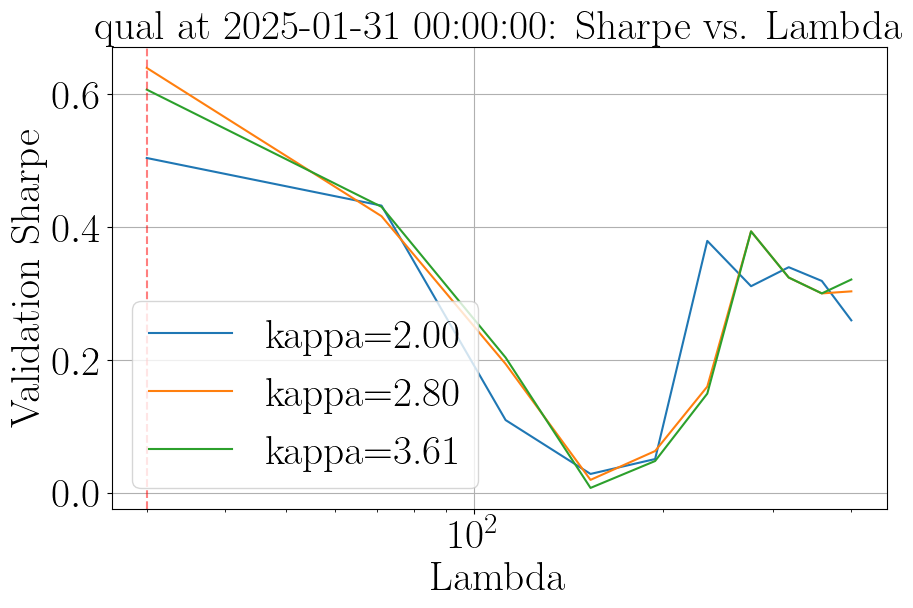


Processing factor size
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=317.78, κ=2.80, Sharpe=0.5717


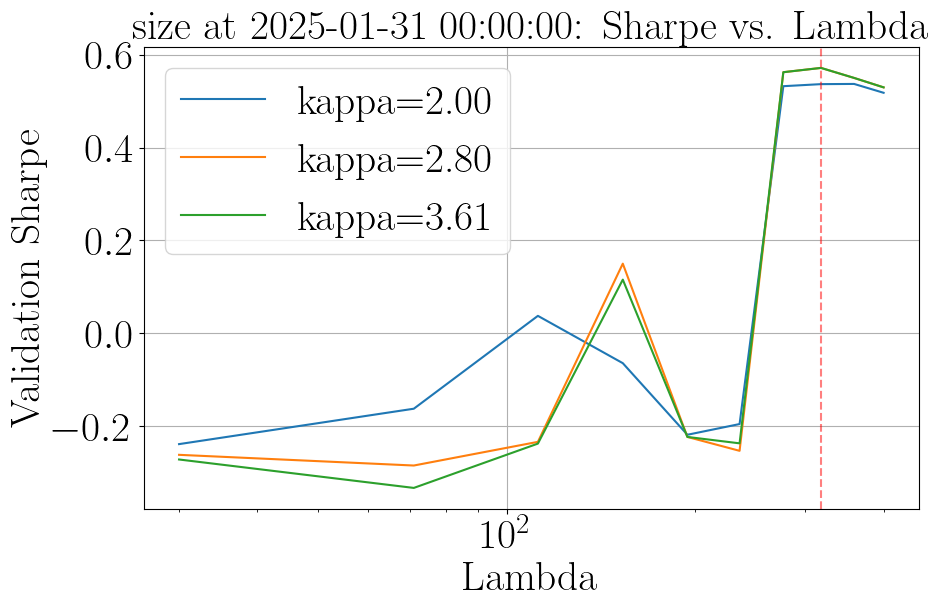


Processing factor usmv
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=153.33, κ=2.80, Sharpe=0.3072


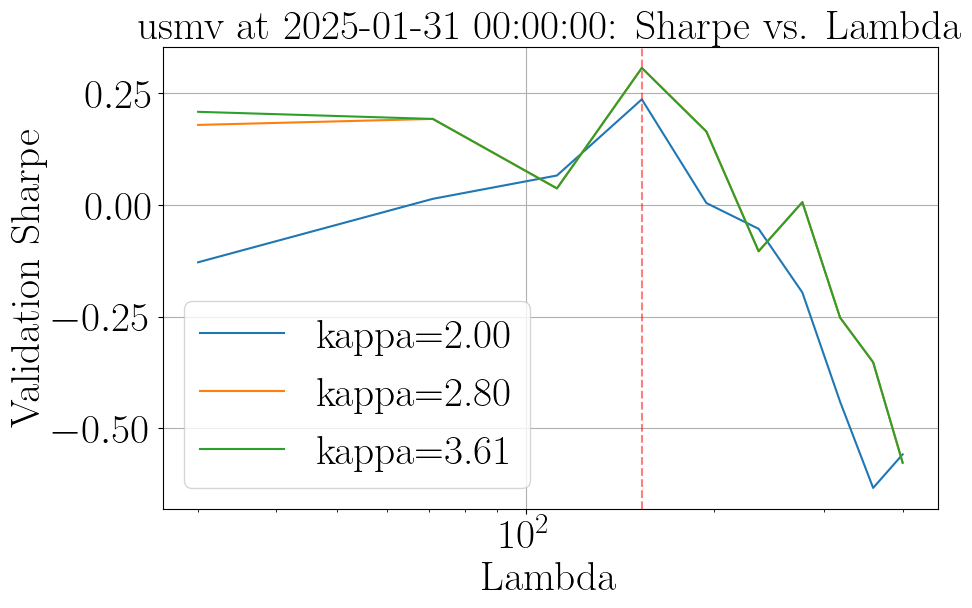


Processing factor vlue
Training: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (12.00 years)
Validation: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (6.00 years)
Training data: 2007-01-30 00:00:00 to 2019-01-30 00:00:00 (2966 days)
Validation data: 2019-01-31 00:00:00 to 2025-01-31 00:00:00 (1511 days)
Best params: λ=400.00, κ=2.00, Sharpe=-0.0590


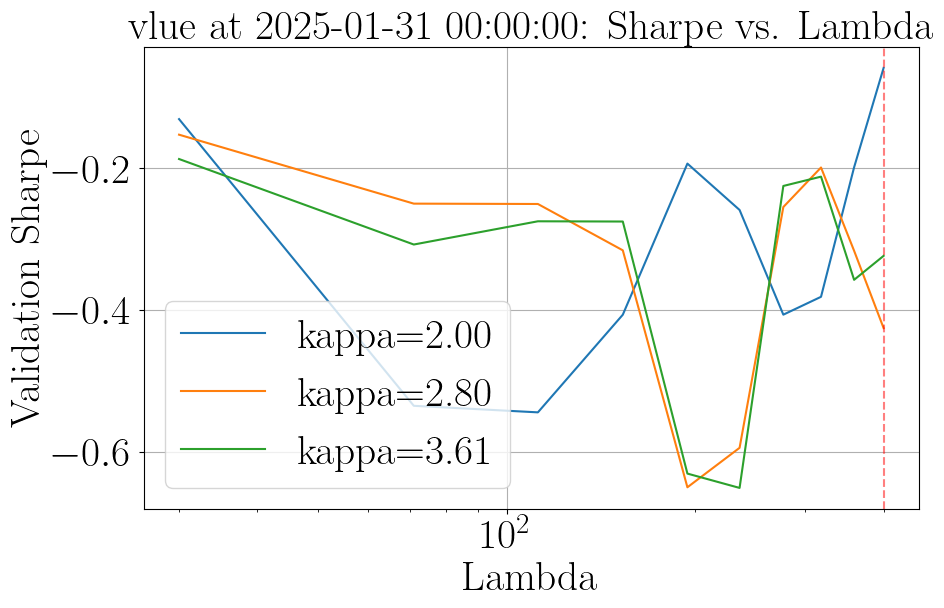


Trading period: 2025-02-28 00:00:00 to 2025-03-31 00:00:00 (21 days)

Trading period: 2025-03-31 00:00:00 to 2025-04-03 00:00:00 (3 days)

CROSS-VALIDATION PERIOD: 2025-04-03 00:00:00

Processing factor iwf
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=112.22, κ=2.00, Sharpe=0.5221


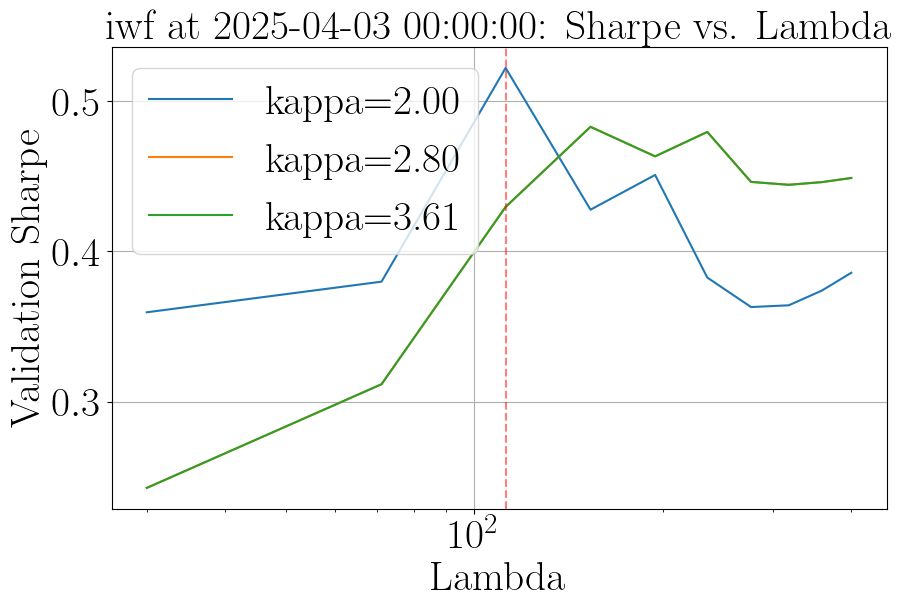


Processing factor mtum
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=358.89, κ=2.00, Sharpe=0.4826


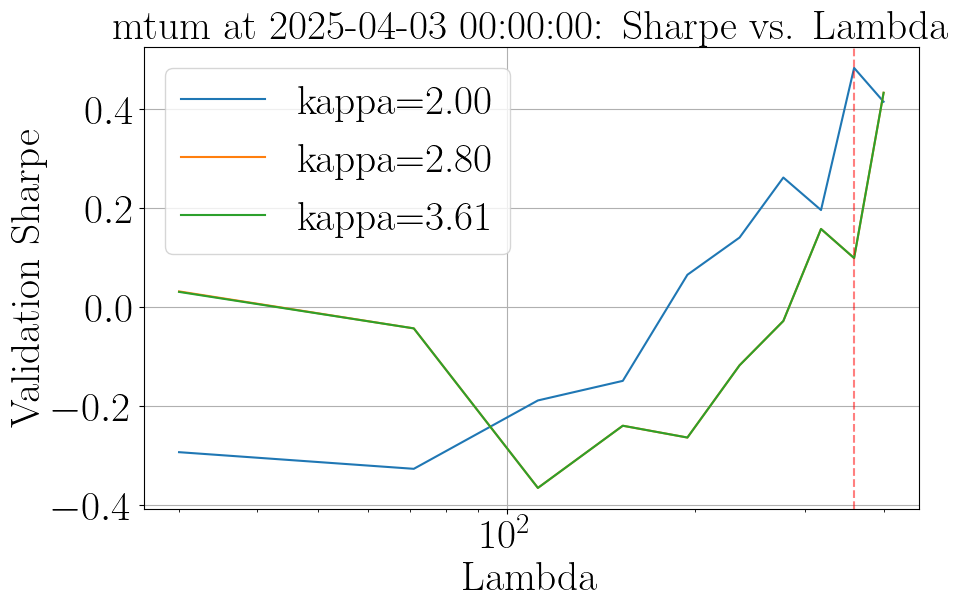


Processing factor qual
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=30.00, κ=3.61, Sharpe=0.5958


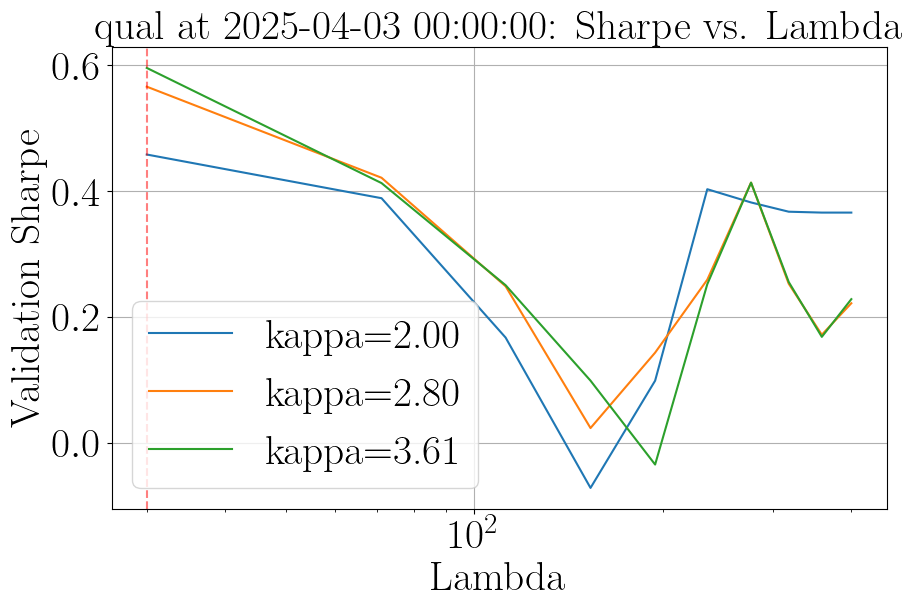


Processing factor size
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=317.78, κ=2.80, Sharpe=0.4431


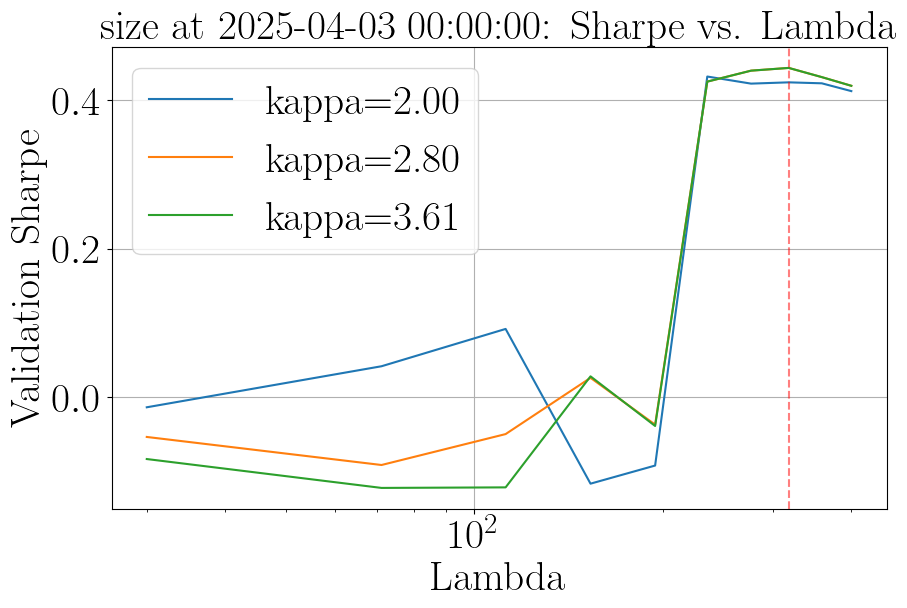


Processing factor usmv
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=153.33, κ=2.00, Sharpe=0.2501


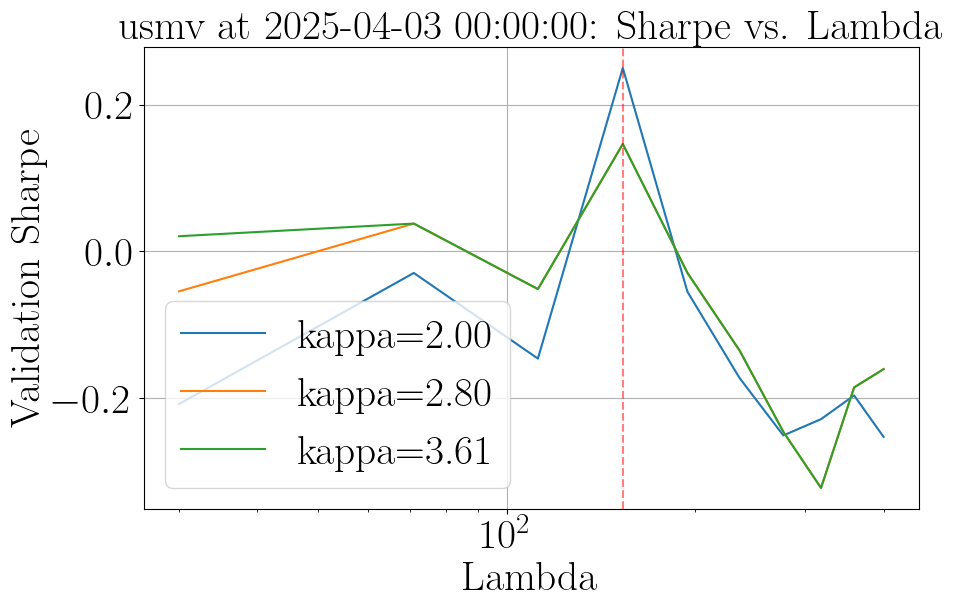


Processing factor vlue
Training: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (12.00 years)
Validation: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (6.00 years)
Training data: 2007-04-02 00:00:00 to 2019-04-02 00:00:00 (2967 days)
Validation data: 2019-04-03 00:00:00 to 2025-04-03 00:00:00 (1511 days)
Best params: λ=400.00, κ=2.00, Sharpe=0.0581


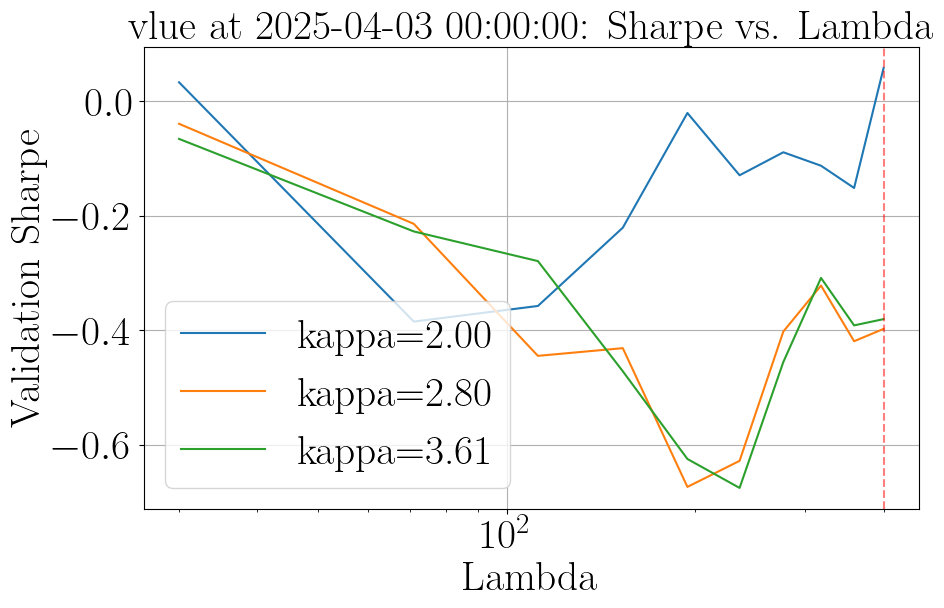

C:\Users\victo\AppData\Local\Temp\ipykernel_3852\570252160.py:629: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label="Re-Cross-Validation" if date == recross_val_boundaries[0] else "")
C:\Users\victo\AppData\Local\Temp\ipykernel_3852\570252160.py:629: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label="Re-Cross-Validation" if date == recross_val_boundaries[0] else "")
C:\Users\victo\AppData\Local\Temp\ipykernel_3852\570252160.py:629: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To

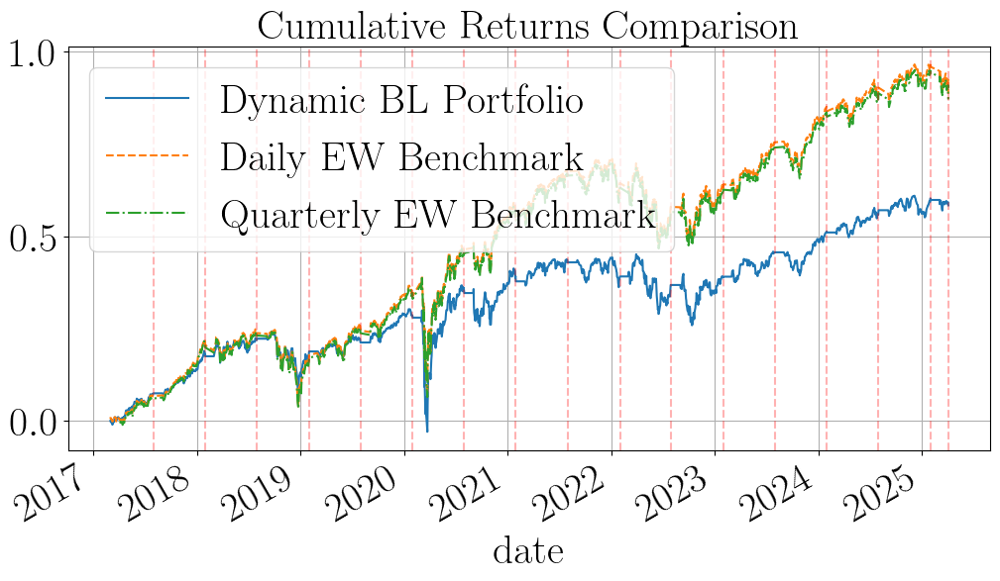

<Figure size 1200x600 with 0 Axes>

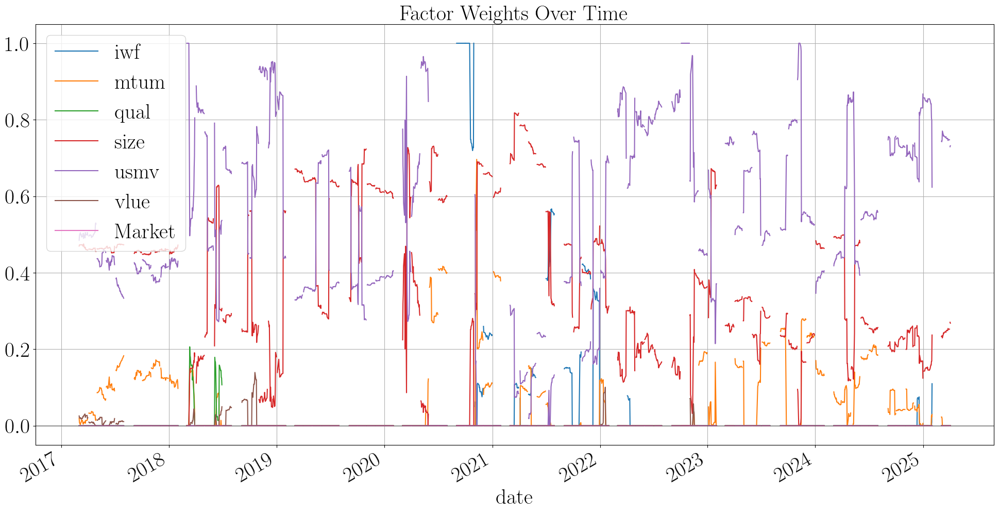


PERFORMANCE SUMMARY
Period: 2017-03-01 00:00:00 to 2025-04-03 00:00:00
Number of trading days: 1705

Annualized Performance Metrics:
Daily EW Benchmark Sharpe: 0.7485
Quarterly EW Benchmark Sharpe: 0.7404
Dynamic BL Portfolio Sharpe: 0.6085

Total Returns:
Daily EW Benchmark Return: 0.8872
Quarterly EW Benchmark Return: 0.8713
Dynamic BL Portfolio Return: 0.5843


In [ ]:
# %%
# Modified implementation of rolling time series CV and trading process

def rolling_time_series_cv_sjm_long_short_optimized(
    lambda_values,
    kappa_values,
    X_train,
    X_val,
    factor_returns_train,
    factor_returns_val,
    market_returns_train,
    market_returns_val,
    cost_per_100pct=0.0005,
    annual_threshold=0.05
):
    """
    Optimized CV function that evaluates hyperparameters on pre-defined train/val sets.
    Returns the best hyperparameters and associated model.
    """
    # Ensure DataFrames have aligned indices
    train_common_index = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    val_common_index = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    if len(train_common_index) == 0 or len(val_common_index) == 0:
        raise ValueError("No common dates between X, factor_returns, and market_returns")
    
    # Apply common index
    X_train = X_train.loc[train_common_index]
    factor_returns_train = factor_returns_train.loc[train_common_index]
    market_returns_train = market_returns_train.loc[train_common_index]
    
    X_val = X_val.loc[val_common_index]
    factor_returns_val = factor_returns_val.loc[val_common_index]
    market_returns_val = market_returns_val.loc[val_common_index]
    
    # Generate active returns
    active_train = factor_returns_train - market_returns_train
    active_val = factor_returns_val - market_returns_val
    
    print(f"Training data: {X_train.index[0]} to {X_train.index[-1]} ({len(X_train)} days)")
    print(f"Validation data: {X_val.index[0]} to {X_val.index[-1]} ({len(X_val)} days)")
    
    # Standardize and clip the data
    clipper = DataClipperStd(mul=3.)
    X_train_clipped = clipper.fit_transform(X_train)
    X_val_clipped = clipper.transform(X_val)
    
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(
        scaler.fit_transform(X_train_clipped),
        index=X_train_clipped.index,
        columns=X_train_clipped.columns
    )
    X_val_scaled = pd.DataFrame(
        scaler.transform(X_val_clipped),
        index=X_val_clipped.index,
        columns=X_val_clipped.columns
    )
    
    # Grid search over hyperparameters
    best_sharpe = -np.inf
    best_lambda = None
    best_kappa = None
    best_model = None
    results = []
    
    for lam in lambda_values:
        for kappa in kappa_values:
            max_feats = int(kappa**2)
            
            try:
                # Fit model
                model = SparseJumpModel(
                    n_components=2,
                    max_feats=max_feats,
                    jump_penalty=lam,
                    cont=False,
                    max_iter=30
                )
                model.fit(X_train_scaled, ret_ser=active_train, sort_by="cumret")
                
                # Calculate regime counts for diagnostic purposes
                train_states = model.predict(X_train_scaled)
                regime_counts = np.bincount(train_states, minlength=2)
                
                # Skip if model didn't find both regimes or has NaN returns
                if regime_counts[0] == 0 or regime_counts[1] == 0 or np.isnan(model.ret_).any():
                    print(f"Skipping λ={lam}, κ={kappa}: Invalid regime distribution {regime_counts} or NaN returns")
                    results.append(-np.inf)
                    continue
                
                # Calculate positions and returns on validation set
                val_states = model.predict_online(X_val_scaled)
                val_regime_counts = np.bincount(val_states, minlength=2)
                
                # Define position function
                def position_from_expected_return(ann_ret, threshold=annual_threshold):
                    if ann_ret > threshold: 
                        return 1.0
                    elif ann_ret < -threshold: 
                        return -1.0
                    else: 
                        return ann_ret / threshold

                # Map regime returns to expected annual returns
                state_avg_daily_active_ret = model.ret_
                state_to_expected = {
                    st: state_avg_daily_active_ret[st] * 252 for st in range(len(state_avg_daily_active_ret))
                }
                
                # Calculate strategy returns with day-lag logic
                strategy_ret = np.zeros(len(val_states))
                prev_position = 0.0
                
                for t in range(len(val_states)):
                    st = val_states.iloc[t]
                    # Calculate PnL based on previous day's position
                    daily_pnl = prev_position * active_val.iloc[t]
                    
                    # Calculate new position based on current day's state
                    new_position = position_from_expected_return(state_to_expected.get(st, 0.0))
                    
                    # Calculate trading costs
                    turnover = abs(new_position - prev_position)
                    cost = turnover * cost_per_100pct
                    
                    # Record strategy return
                    strategy_ret[t] = daily_pnl - cost
                    
                    # Update position for next day
                    prev_position = new_position
                
                # Calculate Sharpe ratio
                avg_ret = np.mean(strategy_ret)
                std_ret = np.std(strategy_ret, ddof=1)
                
                # Skip if std is zero
                if std_ret == 0:
                    print(f"Skipping λ={lam}, κ={kappa}: Zero standard deviation in strategy returns")
                    results.append(-np.inf)
                    continue
                    
                val_sharpe = (avg_ret/std_ret) * np.sqrt(252)
                results.append(val_sharpe)
                
                # # Print diagnostics that show lambda, sharpe, and regimes for the current fold
                # print(f"λ={lam:.2f}, κ={kappa:.2f}, Sharpe={val_sharpe:.4f}, "
                #       f"Train states={regime_counts}, Val states={val_regime_counts}")
                
                # Update best if improved
                if val_sharpe > best_sharpe:
                    best_sharpe = val_sharpe
                    best_lambda = lam
                    best_kappa = kappa
                    best_model = model
                    
            except Exception as e:
                print(f"Error with λ={lam}, κ={kappa}: {e}")
                results.append(-np.inf)
    
    if best_model is None:
        raise ValueError("No valid model found during hyperparameter search")
        
    print(f"Best params: λ={best_lambda:.2f}, κ={best_kappa:.2f}, Sharpe={best_sharpe:.4f}")
    
    # Reshape results for plotting
    results_array = np.array(results).reshape(len(lambda_values), len(kappa_values))
    
    return {
        "best_lambda": best_lambda,
        "best_kappa": best_kappa,
        "best_sharpe": best_sharpe,
        "best_model": best_model,
        "results_array": results_array
    }


# Modified main function for more efficient processing
if __name__ == "__main__":
    ############################################################################
    # 0) Set parameters
    ############################################################################
    # We define how often to re-fit and re-cross-validate:
    REFIT_FREQ = "ME"  # Monthly refit
    RECROSS_VAL_FREQ = "6ME"  # Every 6 months recross-validation
    
    # Training window configuration
    MIN_TRAINING_YEARS = 8  # Minimum 8 years of training data
    MAX_TRAINING_YEARS = 12  # Maximum 12 years of training data
    VAL_YEARS = 6  # 6-year validation window
    
    # Paths & Tickers
    directory = r"C:\Users\victo\git_new\thesis_vri_vp\data"
    factor_file = os.path.join(directory, "1estimation_index_returns.csv")
    market_file = os.path.join(directory, "1macro_data.csv")
    factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]

    # Date boundaries
    INITIAL_TRAIN_START = "2002-05-31"
    test_start = "2017-01-01"

    # Cross-validation settings
    lambda_values = np.linspace(30, 400, 10)  # For grid search
    
    ############################################################################
    # 1) Load full data for all factors & market
    ############################################################################
    # We'll store each factor's entire X and returns in a dict for easy access
    factor_data_dict = {}
    factor_returns_list = []
    for fac in factors:
        print(f"\nLoading data for factor {fac}")
        data = MergedDataLoader(
            factor_file=factor_file,
            market_file=market_file,
            ver="v2",
            factor_col=fac
        ).load()
        common_idx = (
            data.X.index
            .intersection(data.ret_ser.index)
            .intersection(data.market_ser.index)
        )

        # Full factor data
        X_full = data.X.loc[common_idx]
        fac_ret_full = data.ret_ser.loc[common_idx]
        mkt_ret_full = data.market_ser.loc[common_idx]
        active_ret = fac_ret_full - mkt_ret_full ################################################################################## we can access with attribute

        factor_data_dict[fac] = {
            "X": X_full,
            "fac_ret": fac_ret_full,
            "mkt_ret": mkt_ret_full,
            "active_ret": active_ret
        }
        factor_returns_list.append(fac_ret_full)

    # We'll store the last loaded "mkt_ret_full" as "all_market_ret"
    all_market_ret = mkt_ret_full

    # Combine factor returns + market into a single DF
    full_factors_df = pd.concat(factor_returns_list, axis=1).dropna()  # T x 6
    full_df = pd.concat([full_factors_df, all_market_ret], axis=1).dropna()
    full_df.columns = factors + ["Market"]

    # Our "test_index" is from test_start onward
    test_slice = filter_date_range(full_df, start_date=test_start)
    test_index = test_slice.index.sort_values()

    # Define refit and re-cross-validation boundaries
    refit_boundaries = (
        test_index.to_series()
        .resample(REFIT_FREQ)
        .last()
        .dropna()
    )
    
    recross_val_boundaries = (
        test_index.to_series()
        .resample(RECROSS_VAL_FREQ)
        .last()
        .dropna()
    )

    # Helper function to get appropriate training and validation windows
    def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=6,
        initial_train_start=None
    ):
        # 1) Validation window
        val_end = current_date
        val_start = val_end - pd.DateOffset(years=val_years)
        
        # 2) Training window ends just before validation
        train_end = val_start - pd.DateOffset(days=1)
        
        # 3) By default, try the *largest* training window (max_train_years)
        train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
        
        # 4) Don’t go before your global earliest start
        if initial_train_start is not None:
            earliest_start_dt = pd.to_datetime(initial_train_start)
            train_start_candidate = max(train_start_candidate, earliest_start_dt)
        
        # 5) Ensure we have at least min_train_years from train_start to train_end
        if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
            # Move train_start_candidate to enforce minimum
            train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
            # Also don’t go before earliest global date
            if initial_train_start is not None:
                train_start_candidate = max(train_start_candidate, earliest_start_dt)
        
        # Filter actual data
        idx = full_data.index
        train_dates = idx[(idx >= train_start_candidate) & (idx <= train_end)]
        val_dates   = idx[(idx >= val_start) & (idx <= val_end)]
        
        if len(train_dates) == 0 or len(val_dates) == 0:
            raise ValueError(
                f"No data found for train [{train_start_candidate} to {train_end}]"
                f" or val [{val_start} to {val_end}]"
            )
        
        return train_dates[0], train_dates[-1], val_dates[0], val_dates[-1]


    ############################################################################
    # 2) Main Trading Loop with Periodic Re-Cross-Validation
    ############################################################################
    # Tracking variables
    best_hyperparams = {fac: {"best_lambda": None, "best_kappa": None} for fac in factors}
    all_daily_states = {fac: pd.Series(dtype=float) for fac in factors}
    all_daily_weights = []
    all_daily_rets = []
    hyperparameter_history = {fac: [] for fac in factors}
    training_window_history = []
    validation_window_history = []
    
    # Process each cross-validation period
    for i in range(len(recross_val_boundaries)):
        cv_date = recross_val_boundaries.iloc[i]
        print(f"\n{'='*80}")
        print(f"CROSS-VALIDATION PERIOD: {cv_date}")
        print(f"{'='*80}")
        
        for factor_name in factors:
            print(f"\nProcessing factor {factor_name}")
            
            # Get data for this factor
            data = factor_data_dict[factor_name]
            X = data["X"]
            factor_returns = data["fac_ret"]
            market_returns = data["mkt_ret"]
            
            # Get train/val windows for this CV period
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_date, X,
                min_train_years=MIN_TRAINING_YEARS,
                max_train_years=MAX_TRAINING_YEARS,
                val_years=VAL_YEARS,
                initial_train_start=INITIAL_TRAIN_START
            )
            
            # Extract train/val data
            X_train = filter_date_range(X, start_date=train_start, end_date=train_end)
            X_val = filter_date_range(X, start_date=val_start, end_date=val_end)
            
            factor_returns_train = filter_date_range(factor_returns, start_date=train_start, end_date=train_end)
            factor_returns_val = filter_date_range(factor_returns, start_date=val_start, end_date=val_end)
            
            market_returns_train = filter_date_range(market_returns, start_date=train_start, end_date=train_end)
            market_returns_val = filter_date_range(market_returns, start_date=val_start, end_date=val_end)
            
            # Track window sizes
            training_years = (train_end - train_start).days / 365.25
            validation_years = (val_end - val_start).days / 365.25
            
            print(f"Training: {train_start} to {train_end} ({training_years:.2f} years)")
            print(f"Validation: {val_start} to {val_end} ({validation_years:.2f} years)")
            
            # Add to history
            training_window_history.append({
                "date": cv_date,
                "factor": factor_name,
                "start_date": train_start,
                "end_date": train_end,
                "years": training_years
            })
            
            validation_window_history.append({
                "date": cv_date,
                "factor": factor_name,
                "start_date": val_start,
                "end_date": val_end,
                "years": validation_years
            })
            
            # Define kappa values based on feature count
            kappa_values = np.linspace(2, np.sqrt(X_train.shape[1]), 3)
            
            # Run cross-validation to find best hyperparameters
            cv_results = rolling_time_series_cv_sjm_long_short_optimized(
                lambda_values=lambda_values,
                kappa_values=kappa_values,
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=factor_returns_train,
                factor_returns_val=factor_returns_val,
                market_returns_train=market_returns_train,
                market_returns_val=market_returns_val
            )
            
            # Store previous hyperparameters for comparison
            old_lambda = best_hyperparams[factor_name].get("best_lambda")
            old_kappa = best_hyperparams[factor_name].get("best_kappa")
            
            # Update hyperparameters
            best_hyperparams[factor_name] = {
                "best_lambda": cv_results["best_lambda"],
                "best_kappa": cv_results["best_kappa"],
                "best_model": cv_results["best_model"]  # Store the model for potential reuse
            }
            
            # Record hyperparameter history
            hyperparameter_history[factor_name].append({
                "date": cv_date,
                "old_lambda": old_lambda,
                "new_lambda": cv_results["best_lambda"],
                "old_kappa": old_kappa,
                "new_kappa": cv_results["best_kappa"],
                "sharpe": cv_results["best_sharpe"]
            })
            
            # Plot results if desired
            plt.figure(figsize=(10, 6))
            for k_idx, kp in enumerate(kappa_values):
                plt.plot(lambda_values, cv_results["results_array"][:, k_idx], 
                         label=f"kappa={kp:.2f}")
            plt.axvline(x=cv_results["best_lambda"], color='r', linestyle='--', alpha=0.5)
            plt.xscale('log')
            plt.xlabel('Lambda')
            plt.ylabel('Validation Sharpe')
            plt.title(f"{factor_name} at {cv_date}: Sharpe vs. Lambda")
            plt.legend()
            plt.grid(True)
            plt.show()
        
        # Find which refit periods belong to this CV period
        if i < len(recross_val_boundaries) - 1:
            next_cv_date = recross_val_boundaries.iloc[i + 1]
            refit_mask = (refit_boundaries > cv_date) & (refit_boundaries <= next_cv_date)
        else:
            refit_mask = refit_boundaries > cv_date
            
        refit_dates_in_period = refit_boundaries[refit_mask]
        
        # Process each refit period within this CV period
        for j in range(len(refit_dates_in_period)):
            refit_date = refit_dates_in_period.iloc[j]
            
            # Define the trading period
            if j < len(refit_dates_in_period) - 1:
                next_refit_date = refit_dates_in_period.iloc[j + 1]
            else:
                # For the last refit period, use either next CV period or end of data
                if i < len(recross_val_boundaries) - 1:
                    next_refit_date = recross_val_boundaries.iloc[i + 1]
                else:
                    next_refit_date = test_index[-1]
            
            test_mask = (test_index > refit_date) & (test_index <= next_refit_date)
            test_dates_chunk = test_index[test_mask]
            
            if len(test_dates_chunk) == 0:
                continue
                
            print(f"\nTrading period: {refit_date} to {next_refit_date} ({len(test_dates_chunk)} days)")
            
            # Build factor dict for BL portfolio construction
            factor_dict_chunk = {}
            
            # Process each factor for this refit period
            for fac in factors:
                fac_data = factor_data_dict[fac]
                X = fac_data["X"]
                ret_full = fac_data["fac_ret"]
                mkt_full = fac_data["mkt_ret"]
                active = fac_data["active_ret"]
                
                # Get appropriate training window for this refit date
                train_start, train_end = get_train_val_windows(
                    refit_date, X,
                    min_train_years=MIN_TRAINING_YEARS,
                    max_train_years=MAX_TRAINING_YEARS,
                    val_years=0,  # No validation window needed for refit
                    initial_train_start=INITIAL_TRAIN_START
                )[:2]  # Take only train_start and train_end
                
                # Get training data
                X_train = filter_date_range(X, start_date=train_start, end_date=train_end)
                active_train = filter_date_range(active, start_date=train_start, end_date=train_end)
                
                # Process training data
                clipper = DataClipperStd(mul=3.0)
                X_train_clip = clipper.fit_transform(X_train)
                
                scaler = StandardScaler()
                X_train_scaled = pd.DataFrame(
                    scaler.fit_transform(X_train_clip),
                    index=X_train_clip.index,
                    columns=X_train_clip.columns
                )
                
                # Get hyperparameters for this factor
                lam = best_hyperparams[fac]["best_lambda"]
                kp = best_hyperparams[fac]["best_kappa"]
                max_feats = int(kp**2)
                
                # Fit SJM
                sjm = SparseJumpModel(
                    n_components=2, 
                    max_feats=max_feats, 
                    jump_penalty=lam
                )
                sjm.fit(X_train_scaled, ret_ser=active_train, sort_by="cumret")
                
                # Daily online inference for trading period
                X_test_proc_list = []
                for day in test_dates_chunk:
                    # For online scaling, we use all available history up to the current day
                    X_hist = X.loc[:day]
                    
                    # Clip & scale using all history
                    temp_clipper = DataClipperStd(mul=3.0)
                    X_hist_clip = temp_clipper.fit_transform(X_hist)
                    
                    temp_scaler = StandardScaler()
                    _ = temp_scaler.fit_transform(X_hist_clip)  # Fit on all history
                    
                    # Transform just the current day
                    if day in X.index:
                        X_day = X.loc[[day]]
                        X_day_clip = temp_clipper.transform(X_day)
                        X_day_scaled = temp_scaler.transform(X_day_clip)
                        X_test_proc_list.append(
                            pd.Series(X_day_scaled.flatten(), index=X_day.columns, name=day)
                        )
                
                X_test_scaled = pd.DataFrame(X_test_proc_list).sort_index()
                
                # Predict states
                Old:
                if not X_test_scaled.empty:
                    states_chunk = sjm.predict_online(X_test_scaled)
                    states_series = pd.Series(states_chunk, index=X_test_scaled.index)
                else:
                    states_series = pd.Series(dtype=float)
                
                # # New:
                # if X_test_scaled.empty:
                #     raise ValueError(f"No scaled data available for prediction on trading dates: {test_dates_chunk[0]} to {test_dates_chunk[-1]}")
                    
                # states_chunk = sjm.predict_online(X_test_scaled)
                # states_series = pd.Series(states_chunk, index=X_test_scaled.index)

                
                # Update global state tracking
                all_daily_states[fac] = pd.concat(
                    [s for s in [all_daily_states[fac], states_series] if not s.empty]
                ).sort_index()
                
                
                train_states = sjm.predict(X_train_scaled)
                abs_regime_returns = {}
                for st in range(sjm.n_components):
                    # find the subset of training days assigned to regime st
                    st_mask = (train_states == st)
                    # take the mean of the *absolute* factor returns for those days
                    abs_regime_returns[st] = factor_returns_train.loc[st_mask].mean()

                # Store factor info for BL
                factor_dict_chunk[fac] = {
                    "ret": ret_full,
                    "states": states_series,
                    "regime_returns": {
                        0: sjm.ret_[0],
                        1: sjm.ret_[1],
                    },
                    "abs_regime_returns" : {
                        0: abs_regime_returns[0],
                        1: abs_regime_returns[1],
                    }
                }
                
            # Run Black-Litterman portfolio construction
            weights_chunk = run_bl_portfolio_pyopt_expanding(
                factor_dict=factor_dict_chunk,
                returns_df=full_df,
                test_index=test_dates_chunk,
                tau=0.05,
                delta=2.5
            )
            
            # Compute portfolio returns
            daily_factor_rets = full_df.loc[test_dates_chunk, factors]
            portfolio_rets = (weights_chunk * daily_factor_rets).sum(axis=1)
            
            # Store results
            all_daily_weights.append(weights_chunk)
            all_daily_rets.append(portfolio_rets)
    
    ############################################################################
    # 3) Analyze Results and Compare to Benchmarks
    ############################################################################
    if len(all_daily_rets) == 0:
        raise ValueError("No daily returns computed. Check your date ranges or data.")

    all_portfolio_rets = pd.concat(all_daily_rets).sort_index()
    all_weights_df = pd.concat(all_daily_weights).sort_index()
    cumrets = all_portfolio_rets.cumsum()

    # Compare to equal-weight benchmark
    overlap_idx = all_portfolio_rets.index.intersection(full_df.index)
    test_returns_df = full_df.loc[overlap_idx, :]
    ew_bench_rets = test_returns_df.mean(axis=1)
    ew_bench_cum = ew_bench_rets.cumsum()
    
    # Also compute quarterly-rebalanced EW portfolio
    quarterly_ends = test_returns_df.index.to_series().resample("QE").last().dropna()
    n_assets = test_returns_df.shape[1]
    quarterly_ew_rets = pd.Series(index=test_returns_df.index, dtype=float)

    for i in range(len(quarterly_ends) - 1):
        start_q = quarterly_ends.iloc[i]
        end_q = quarterly_ends.iloc[i + 1]
        mask = (test_returns_df.index > start_q) & (test_returns_df.index <= end_q)
        chunk_dates = test_returns_df.index[mask]
        
        w = np.ones(n_assets) / n_assets
        
        for day in chunk_dates:
            r_i = test_returns_df.loc[day].values
            r_p = np.dot(w, r_i)
            quarterly_ew_rets.loc[day] = r_p
            
            w = w * (1 + r_i)
            if (1 + r_p) != 0:
                w /= (1 + r_p)

    quarterly_ew_rets = quarterly_ew_rets.dropna()
    quarterly_ew_cum = quarterly_ew_rets.cumsum()

    ############################################################################
    # 4) Plot Results and Print Performance Statistics
    ############################################################################
    # Plot 1: Cumulative returns comparison
    plt.figure(figsize=(12, 6))
    cumrets.plot(label="Dynamic BL Portfolio")
    ew_bench_cum.plot(label="Daily EW Benchmark", linestyle="--")
    quarterly_ew_cum.plot(label="Quarterly EW Benchmark", linestyle="-.")
    
    # Add vertical lines at re-cross-validation dates
    for date in recross_val_boundaries:
        if date in cumrets.index:
            plt.axvline(x=date, color='r', linestyle='--', alpha=0.3, 
                        label="Re-Cross-Validation" if date == recross_val_boundaries.iloc[0] else "")
    
    plt.title("Cumulative Returns Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Factor weights over time
    plt.figure(figsize=(12, 6))
    plt.stackplot(all_weights_df.index, all_weights_df.T.values, labels=all_weights_df.columns)
    plt.title("Out-of-Sample Portfolio Weights Over Time")
    plt.xlabel("Trading Days")
    plt.ylabel("Weights")
    plt.legend(
        loc="center left",
        bbox_to_anchor=(1, 0.5),
        fontsize='small'  # smaller font size for legend
    )

    plt.tight_layout()
    plt.show()


    # Print performance statistics
    print("\n==============================================================")
    print("PERFORMANCE SUMMARY")
    print("==============================================================")
    print(f"Period: {all_portfolio_rets.index[0]} to {all_portfolio_rets.index[-1]}")
    print(f"Number of trading days: {len(all_portfolio_rets)}")
    print("\nAnnualized Performance Metrics:")
    print(f"Daily EW Benchmark Sharpe: {annualized_sharpe(ew_bench_rets):.4f}")
    print(f"Quarterly EW Benchmark Sharpe: {annualized_sharpe(quarterly_ew_rets):.4f}")
    print(f"Dynamic BL Portfolio Sharpe: {annualized_sharpe(all_portfolio_rets):.4f}")
    print(f"\nTotal Returns:")
    print(f"Daily EW Benchmark Return: {ew_bench_cum.iloc[-1]:.4f}")
    print(f"Quarterly EW Benchmark Return: {quarterly_ew_cum.iloc[-1]:.4f}")
    print(f"Dynamic BL Portfolio Return: {cumrets.iloc[-1]:.4f}")

In [ ]:
# # Print hyperparameter evolution
    # print("\n==============================================================")
    # print("HYPERPARAMETER EVOLUTION")
    # print("==============================================================")
    # for fac in factors:
    #     if hyperparameter_history[fac]:
    #         print(f"\nFactor: {fac}")
    #         for entry in hyperparameter_history[fac]:
    #             print(f"Date: {entry['date']}")
    #             #print(f"  Lambda: {entry['old_lambda']:.2f} -> {entry['new_lambda']:.2f}")
    #             print(f"  Kappa²: {int(entry['old_kappa']**2)} -> {int(entry['new_kappa']**2)}")
    #             print(f"  Sharpe: {entry['sharpe']:.4f}")
    #     else:
    #         print(f"\nFactor: {fac} - No parameter changes")

    # # Print training window evolution
    # if training_window_history:
    #     print("\n==============================================================")
    #     print(f"TRAINING WINDOW EVOLUTION ({WINDOW_TYPE.upper()})")
    #     print("==============================================================")
    #     for entry in training_window_history:
    #         print(f"Date: {entry['date']}")
    #         print(f"  Window: {entry['start_date']} to {entry['end_date']}")
    #         print(f"  Size: {entry['years']:.2f} years")


PERFORMANCE SUMMARY
Period: 2017-03-01 00:00:00 to 2025-04-03 00:00:00
Number of trading days: 1705

Annualized Performance Metrics:
Daily EW Benchmark Sharpe: 0.7485
Quarterly EW Benchmark Sharpe: 0.7404
Dynamic BL Portfolio Sharpe: 0.6546

Total Returns:
Daily EW Benchmark Return: 0.8872
Quarterly EW Benchmark Return: 0.8713
Dynamic BL Portfolio Return: 0.6200


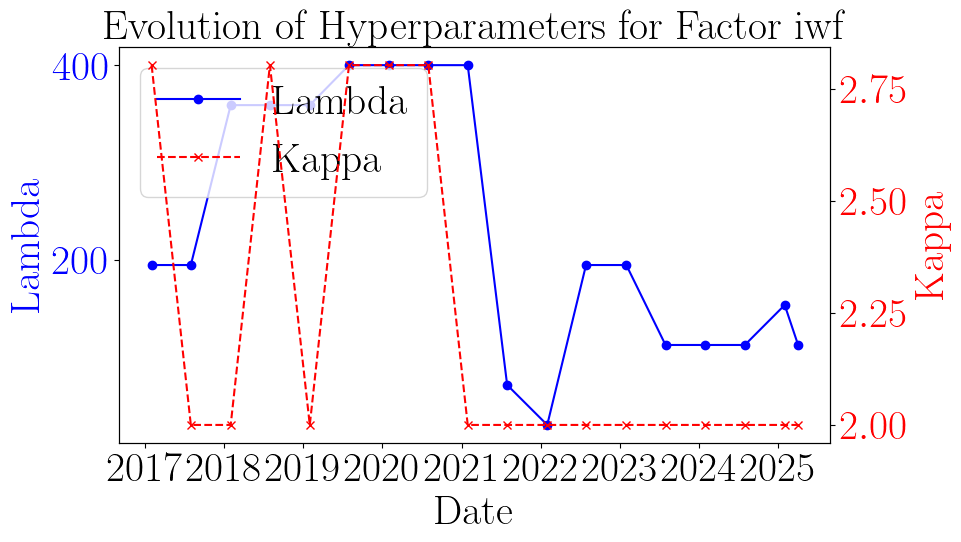

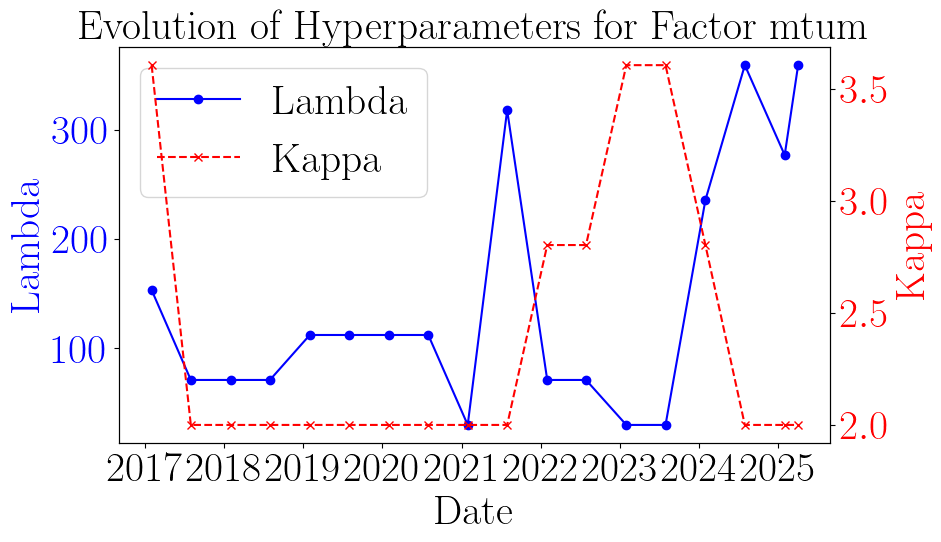

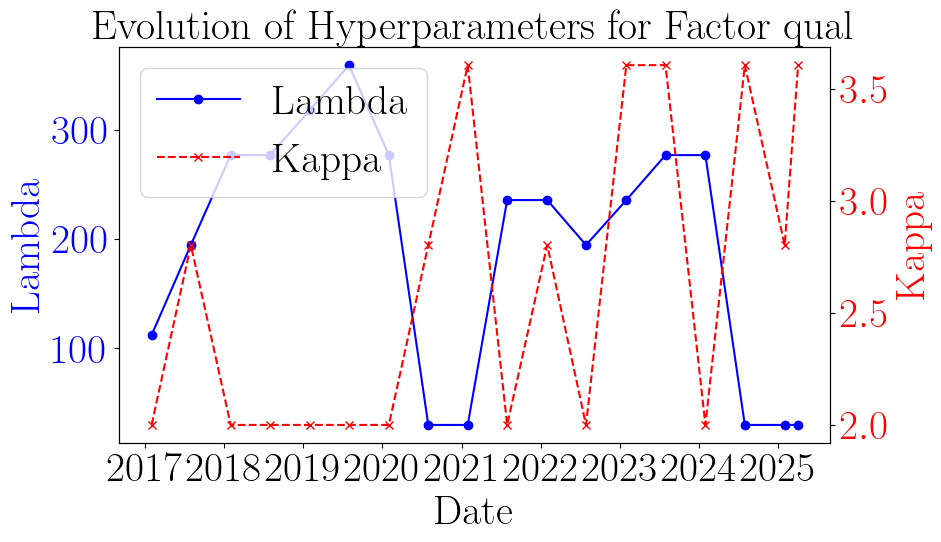

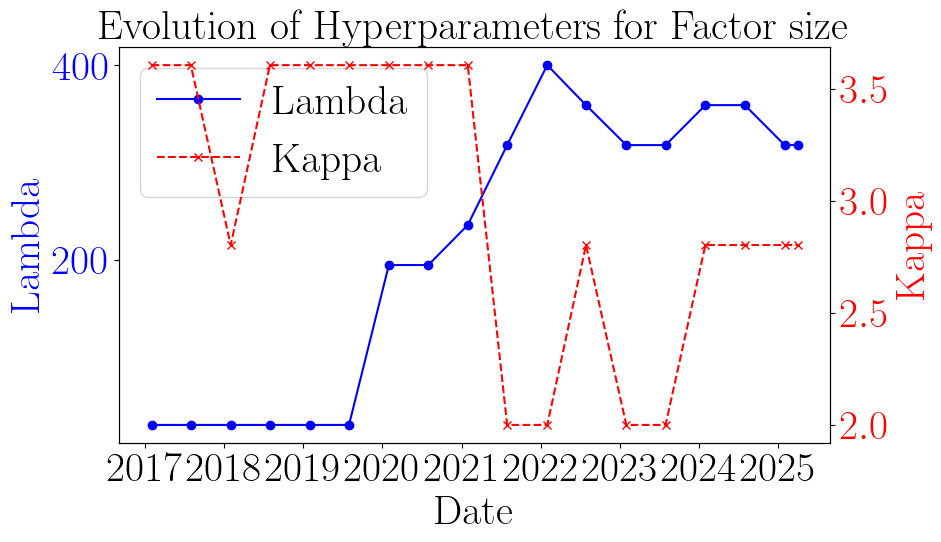

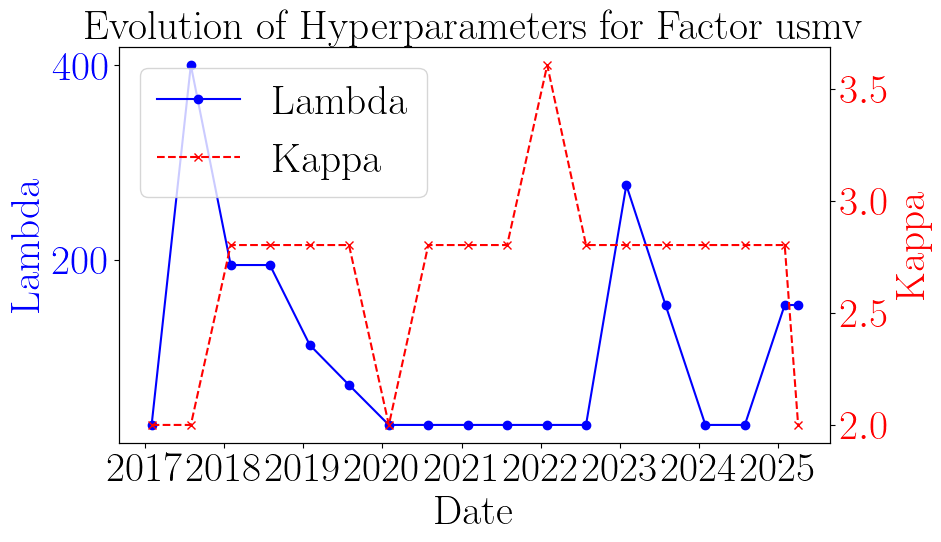

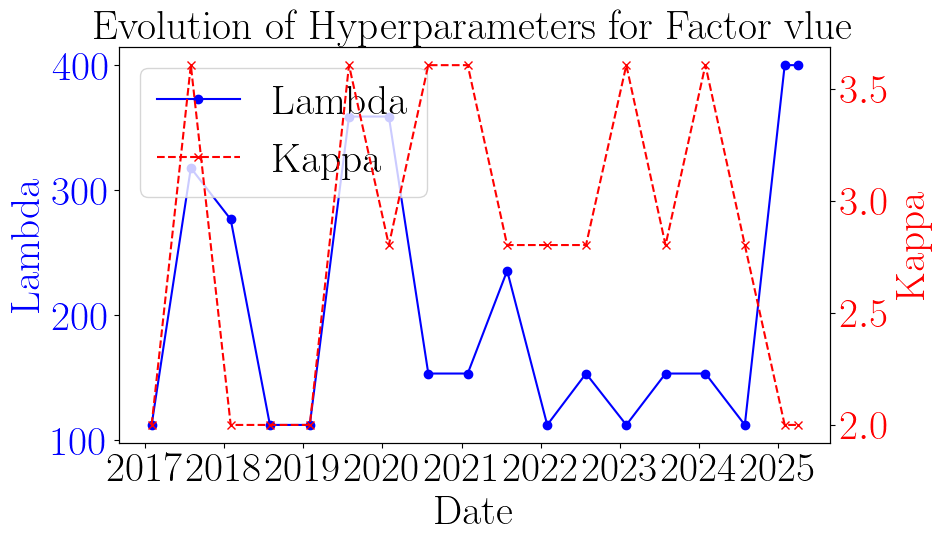

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_hyperparameters_over_time(hyperparameter_history, factor):
    """
    Plot the evolution of hyperparameters (lambda and kappa) over time for a given factor.
    
    Parameters:
      hyperparameter_history (dict): Dictionary with factor keys and lists of hyperparameter history records.
      factor (str): The name of the factor to plot.
    """
    # Convert the list of history records to a DataFrame
    df = pd.DataFrame(hyperparameter_history[factor])
    
    # Ensure the 'date' column is in datetime format and sort by date
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    
    # Set up the figure with dual y-axes for lambda and kappa
    fig, ax1 = plt.subplots(figsize=(10, 6))
    
    # Plot lambda on the primary y-axis (left)
    ax1.plot(df['date'], df['new_lambda'], marker='o', color='blue', label='Lambda')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Lambda', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    # Create a second y-axis to plot kappa
    ax2 = ax1.twinx()
    ax2.plot(df['date'], df['new_kappa'], marker='x', linestyle='--', color='red', label='Kappa')
    ax2.set_ylabel('Kappa', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    
    # Optional: Combine legends from both axes for clarity
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    plt.title(f"Evolution of Hyperparameters for Factor {factor}")
    plt.tight_layout()
    plt.show()

# Example usage: visualize hyperparameters for each factor
# Assume hyperparameter_history is a dictionary like:
# {
#   "factor1": [{"date": "2020-01-01", "old_lambda": ..., "new_lambda": ..., "old_kappa": ..., "new_kappa": ..., "sharpe": ...}, ...],
#   "factor2": [ ... ],
#   ...
# }
for fac in hyperparameter_history:
    plot_hyperparameters_over_time(hyperparameter_history, fac)


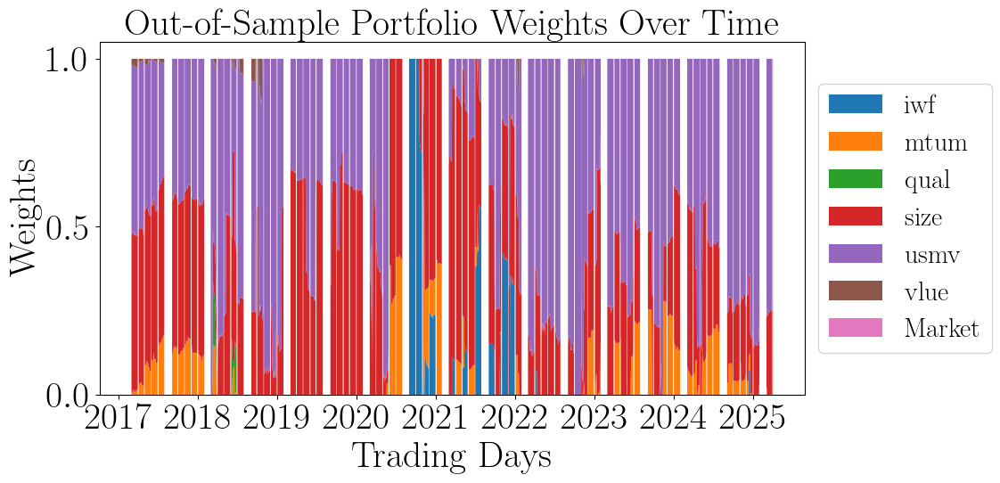

In [11]:
plt.figure(figsize=(12, 6))
plt.stackplot(all_weights_df.index, all_weights_df.T.values, labels=all_weights_df.columns)
plt.title("Out-of-Sample Portfolio Weights Over Time")
plt.xlabel("Trading Days")
plt.ylabel("Weights")

plt.legend(
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize='small'  # smaller font size for legend
)

plt.tight_layout()
plt.show()
